# Annealing - Hyperopt

In this notebook, we will use **Annealing** to select the best **hyperparameters** for a CNN that recognizes digits in images, using the MNIST dataset and the open source Python package [Hyperopt](http://hyperopt.github.io/hyperopt/).

The MNIST dataset is availale in [Kaggle](https://www.kaggle.com/c/digit-recognizer/data).


## Download dataset

- Navigate to the [MNIST website in Kaggle](https://www.kaggle.com/c/digit-recognizer/data)
- Download the train.csv file
- Unzip and copy the train.csv file to where you see the SAVE_DATASETS-HERE.txt file
- Rename to mnist.csv

**Remember that you need to be logged in to be able to download the dataset**

## Notebook content

- Data Preparation
- Set up the hyperparameter search shape
- Set up a simple CNN
- Set up the objective function
- Perform Simulated Annealing
- Evaluate Model Performance

In [1]:
# For reproducible results.
# See: 
# https://keras.io/getting_started/faq/#how-can-i-obtain-reproducible-results-using-keras-during-development

import os
os.environ['PYTHONHASHSEED'] = '0'

import numpy as np
import tensorflow as tf
import random as python_random

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.
np.random.seed(123)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(123)

# The below set_seed() will make random number generation
# in the TensorFlow backend have a well-defined initial state.
# For further details, see:
# https://www.tensorflow.org/api_docs/python/tf/random/set_seed
tf.random.set_seed(1234)

2022-10-07 10:03:08.628892: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-07 10:03:08.628971: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
import itertools
from functools import partial

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [5]:
from keras.utils.np_utils import to_categorical
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [6]:
from hyperopt import hp, anneal, fmin, Trials

#  Data Preparation

The dataset contains information about images, each image is a hand-written digit. The aim is to have the computer predict which digit was written by the person, automatically, by "looking" at the image. 

Each image is 28 pixels in height and 28 pixels in width (28 x 28), making a total of 784 pixels. Each pixel value is an integer between 0 and 255, indicating the darkness in a gray-scale of that pixel.

The data is stored in a dataframe where each each pixel is a column (so it is flattened and not in the 28 x 28 format). 

The data set the has 785 columns. The first column, called "label", is the digit that was drawn by the user. The rest of the columns contain the pixel-values of the associated image.

In [7]:
# Load the data

data = pd.read_csv("../mnist.csv")

# first column is the target, the rest of the columns
# are the pixels of the image

# each row is 1 image
data.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
# split dataset into a train and test set

X_train, X_test, y_train, y_test = train_test_split(
    data.drop(['label'], axis=1), # the images
    data['label'], # the target
    test_size = 0.1,
    random_state=0)

X_train.shape, X_test.shape

((37800, 784), (4200, 784))

Text(0, 0.5, 'Number of images')

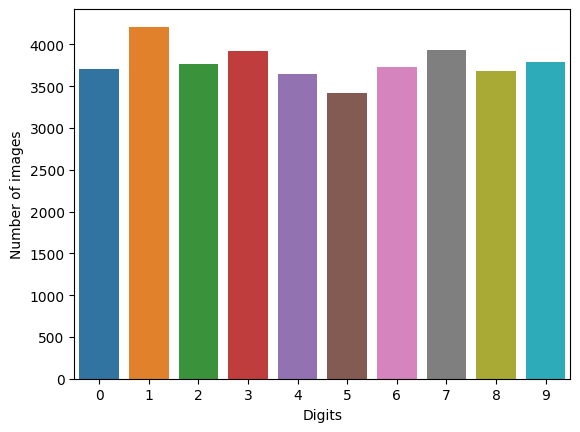

In [9]:
# number of images for each digit

g = sns.countplot(x=y_train)
plt.xlabel('Digits')
plt.ylabel('Number of images')

There are roughly the same amount of images for each of the 10 digits.

## Image re-scaling

We re-scale data for the CNN, between 0 and 1.

In [10]:
# Re-scale the data

# 255 is the maximum value a pixel can take

X_train = X_train / 255
X_test = X_test / 255

## Reshape

The images were stored in a pandas dataframe as 1-D vectors of 784 values. For a CNN with Keras, we need tensors with the following dimensions: width x height x channel. 

Thus, we reshape all data to 28 x 2 8 x 1, 3-D matrices. 

The 3rd dimension corresponds to the channel. RGB images have 3 channels. MNIST images are in gray-scale, thus they have only one channel in the 3rd dimension.

In [11]:
# Reshape image in 3 dimensions:
# height: 28px X width: 28px X channel: 1 

X_train = X_train.values.reshape(-1,28,28,1)
X_test = X_test.values.reshape(-1,28,28,1)

## Target encoding

In [12]:
# the target is 1 variable with the 9 different digits
# as values

y_train.unique()

array([2, 0, 7, 4, 3, 5, 9, 6, 8, 1])

In [13]:
# For Keras, we need to create 10 dummy variables,
# one for each digit

# Encode labels to one hot vectors (ex : digit 2 -> [0,0,1,0,0,0,0,0,0,0])

y_train = to_categorical(y_train, num_classes = 10)
y_test = to_categorical(y_test, num_classes = 10)

# the new target
y_train

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

Let's print some example images.

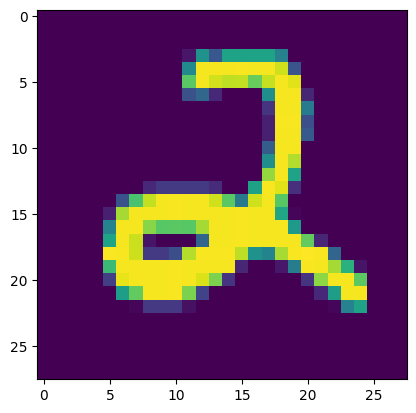

In [14]:
# Some image examples 

g = plt.imshow(X_train[0][:,:,0])

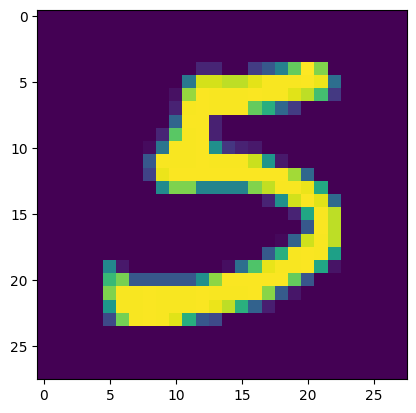

In [15]:
# Some image examples 

g = plt.imshow(X_train[10][:,:,0])

# Define the Hyperparameter Space

Hyperopt provides the hp module to create distributions to sample the hyperparameters. More details in [Defining a Search Space](http://hyperopt.github.io/hyperopt/getting-started/search_spaces/).


We want to find the following hyper-parameters:

- The learning rate of the optimizer.
- The number of convolutional layers.
- The number of fully-connected Dense layers.
- The number of nodes (neurons) for each of the dense layers.
- Whether to use 'sigmoid' or 'relu' activation in all the layers.

In [16]:
# determine the hyperparameter space

param_grid = {
    'learning_rate': hp.uniform('learning_rate', 1e-6, 1e-2),
    'num_conv_layers': hp.quniform('num_conv_layers', 1, 3, 1),
    'num_dense_layers': hp.quniform('num_dense_layers', 1, 5, 1),
    'num_dense_nodes': hp.quniform('num_dense_nodes', 5, 512, 1),
    'activation': hp.choice('activation', ['relu', 'sigmoid']),
}

# Define the CNN

We will create a CNN, with 2 Convolutional layers followed by Pooling, and varying number of fully-connected Dense layers. Each Convlutional layer, can itself have more than 1 conv layer.

In [17]:
# function to create the CNN

def create_cnn(
    # the hyperparam to optimize are passed
    # as arguments
    learning_rate,
    num_conv_layers,
    num_dense_layers,
    num_dense_nodes,
    activation,
):
    """
    Hyper-parameters:
    learning_rate:        Learning-rate for the optimizer.
    convolutional layers: Number of conv layers.
    num_dense_layers:     Number of dense layers.
    num_dense_nodes:      Number of nodes in each dense layer.
    activation:           Activation function for all layers.
    """

    # Start construction of a Keras Sequential model.
    model = Sequential()

    # First convolutional layer.
    # There are many hyper-parameters in this layer
    # For this demo, we will optimize the activation function and
    # the number of convolutional layers that it can take.
    
    # We add the different number of conv layers in the following loop:
    
    for i in range(num_conv_layers):
        model.add(Conv2D(kernel_size=5, strides=1, filters=16, padding='same',
                         activation=activation))
    model.add(MaxPool2D(pool_size=2, strides=2))

    # Second convolutional layer.
    # Same hyperparameters to optimize as previous layer.
    for i in range(num_conv_layers):
        model.add(Conv2D(kernel_size=5, strides=1, filters=36, padding='same',
                         activation=activation))
    model.add(MaxPool2D(pool_size=2, strides=2))

    # Flatten the 4-rank output of the convolutional layers
    # to 2-rank that can be input to a fully-connected Dense layer.
    model.add(Flatten())

    # Add fully-connected Dense layers.
    # The number of layers is a hyper-parameter we want to optimize.
    # We add the different number of layers in the following loop:
    
    for i in range(num_dense_layers):
        
        # Add the dense fully-connected layer to the model.
        # This has two hyper-parameters we want to optimize:
        # The number of nodes (neurons) and the activation function.
        model.add(Dense(num_dense_nodes,
                        activation=activation,
                        ))

    # Last fully-connected dense layer with softmax-activation
    # for use in classification.
    model.add(Dense(10, activation='softmax'))

    # Use the Adam method for training the network.
    # We want to find the best learning-rate for the Adam method.
    optimizer = Adam(lr=learning_rate)

    # In Keras we need to compile the model so it can be trained.
    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Define the Objective Function

In [18]:
# we will save the model with this name
path_best_model = 'cnn_model.h5'

# starting point for the optimization
best_accuracy = 0

In [19]:
def objective(params):
    
    """
    Hyper-parameters:
    learning_rate:        Learning-rate for the optimizer.
    convolutional layers: Number of conv layers.
    num_dense_layers:     Number of dense layers.
    num_dense_nodes:      Number of nodes in each dense layer.
    activation:           Activation function for all layers.
    """

    # Print the hyper-parameters.        
    print('learning rate: ', params['learning_rate'])
    print('num_conv_layers: ', int(params['num_conv_layers']))
    print('num_dense_layers: ',int(params['num_dense_layers']))
    print('num_dense_nodes: ', int(params['num_dense_nodes']))
    print('activation: ', params['activation'])
    print()
    
    # Create the neural network with the hyper-parameters.
    # We call the function we created previously.
    model = create_cnn(learning_rate=params['learning_rate'],
                       num_conv_layers=int(params['num_conv_layers']),
                       num_dense_layers=int(params['num_dense_layers']),
                       num_dense_nodes=int(params['num_dense_nodes']),
                       activation=params['activation'],
                       )

   
    # Set a learning rate annealer
    # this reduces the learning rate if learning does not improve
    # for a certain number of epochs
    learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                                patience=2, 
                                                verbose=1, 
                                                factor=0.5, 
                                                min_lr=0.00001)
   
    # train the model
    # we use 3 epochs to be able to run the notebook in a "reasonable"
    # time. If we increase the epochs, we will have better performance
    # this could be another parameter to optimize in fact.
    history = model.fit(x=X_train,
                        y=y_train,
                        epochs=3,
                        batch_size=128,
                        validation_split=0.1,
                        callbacks=learning_rate_reduction)

    # Get the classification accuracy on the validation-set
    # after the last training-epoch.
    accuracy = history.history['val_accuracy'][-1]

    # Print the classification accuracy.
    print()
    print("Accuracy: {0:.2%}".format(accuracy))
    print()

    # Save the model if it improves on the best-found performance.
    # We use the global keyword so we update the variable outside
    # of this function.
    global best_accuracy

    # If the classification accuracy of the saved model is improved ...
    if accuracy > best_accuracy:
        # Save the new model to harddisk.
        # Training CNNs is costly, so we want to avoid having to re-train
        # the network with the best found parameters. We save it instead
        # as we search for the best hyperparam space.
        model.save(path_best_model)
        
        # Update the classification accuracy.
        best_accuracy = accuracy

    # Delete the Keras model with these hyper-parameters from memory.
    del model

    
    # Remember that Scikit-optimize always minimizes the objective
    # function, so we need to negate the accuracy (because we want
    # the maximum accuracy)
    return -accuracy

## Test run

In [20]:
# Before we run the hyper-parameter optimization,
# let's first check that the everything is working
# by passing some default hyper-parameters.

default_parameters = {
    'learning_rate': 1e-5,
    'num_conv_layers': 1,
    'num_dense_layers': 1,
    'num_dense_nodes': 16,
    'activation': 'relu',
}


objective(default_parameters)

learning rate:  1e-05
num_conv_layers:  1
num_dense_layers:  1
num_dense_nodes:  16
activation:  relu



2022-10-07 10:05:34.895735: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-07 10:05:34.895805: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-07 10:05:34.895839: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (LAP-VK-DS): /proc/driver/nvidia/version does not exist
2022-10-07 10:05:34.896091: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home/kuhn/Github_local/hyperparameter-optimization/.venv/hyperparameter-optimization/lib/python3.9/site-packages

Epoch 1/3
266/266 [==============================] - 14s 51ms/step - loss: 2.2490 - accuracy: 0.2445 - val_loss: 2.1896 - val_accuracy: 0.4005
Epoch 2/3
266/266 [==============================] - 14s 51ms/step - loss: 2.0980 - accuracy: 0.5015 - val_loss: 1.9901 - val_accuracy: 0.5704
Epoch 3/3
266/266 [==============================] - 13s 47ms/step - loss: 1.8444 - accuracy: 0.6217 - val_loss: 1.6954 - val_accuracy: 0.6402

Accuracy: 64.02%



-0.6402116417884827

We obtained a mediocre accuracy, but all our code is working. So let's get started with the Optimization now!!

## Simulated Annealing

In [19]:
# fmin performs the minimization
# tpe.anneal samples the parameters using simulated annealing

trials = Trials()

search = fmin(
    fn=objective,
    space=param_grid,
    max_evals=30,
    rstate=np.random.RandomState(42),
    algo=anneal.suggest, # annealing
    trials=trials
)

learning rate:                                                                                                                  
0.0031951530631466342                                                                                                           
num_conv_layers:                                                                                                                
1                                                                                                                               
num_dense_layers:                                                                                                               
4                                                                                                                               
num_dense_nodes:                                                                                                                
236                                                                                              

 - ETA: 52s - loss: 1.9607 - accuracy: 0.2582                                                                                   
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 51s - loss: 1.9326 - accuracy: 0.2693                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 51s - loss: 1.9048 - accuracy: 0.2802                                                                                   
                                                                                                 

 - ETA: 46s - loss: 1.5141 - accuracy: 0.4334                                                                                   
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 46s - loss: 1.4988 - accuracy: 0.4393                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 45s - loss: 1.4839 - accuracy: 0.4452                                                                                   
                                                                                                 

 - ETA: 38s - loss: 1.2559 - accuracy: 0.5344                                                                                   
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 38s - loss: 1.2463 - accuracy: 0.5382                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 38s - loss: 1.2368 - accuracy: 0.5418                                                                                   
                                                                                                 

 - ETA: 34s - loss: 1.0871 - accuracy: 0.5998                                                                                   
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 33s - loss: 1.0805 - accuracy: 0.6024                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 33s - loss: 1.0740 - accuracy: 0.6049                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.9658 - accuracy: 0.6462                                                                                   
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 31s - loss: 0.9609 - accuracy: 0.6481                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 31s - loss: 0.9560 - accuracy: 0.6500                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.8738 - accuracy: 0.6812                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 26s - loss: 0.8699 - accuracy: 0.6827                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 26s - loss: 0.8661 - accuracy: 0.6841                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.8011 - accuracy: 0.7086                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 22s - loss: 0.7981 - accuracy: 0.7098                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 22s - loss: 0.7950 - accuracy: 0.7110                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.7423 - accuracy: 0.7308                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 18s - loss: 0.7398 - accuracy: 0.7318                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 18s - loss: 0.7373 - accuracy: 0.7327                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.6936 - accuracy: 0.7492                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 14s - loss: 0.6915 - accuracy: 0.7500                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 14s - loss: 0.6894 - accuracy: 0.7507                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.6525 - accuracy: 0.7646                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 10s - loss: 0.6507 - accuracy: 0.7653                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 10s - loss: 0.6489 - accuracy: 0.7659                                                                                   
                                                                                                 

 - ETA: 6s - loss: 0.6173 - accuracy: 0.7778                                                                                    
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 0.6158 - accuracy: 0.7784                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 0.6142 - accuracy: 0.7789                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.5867 - accuracy: 0.7892                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.5853 - accuracy: 0.7897                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.5840 - accuracy: 0.7902                                                                                    
                                                                                                   

 - ETA: 34s - loss: 0.0377 - accuracy: 0.9874                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 34s - loss: 0.0444 - accuracy: 0.9857                                                                                   
                                                                                                                                
  5/266 [..............................]                                                                                        
 - ETA: 34s - loss: 0.0479 - accuracy: 0.9848                                                                                   
                                                                                                 

 - ETA: 33s - loss: 0.0631 - accuracy: 0.9794                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 33s - loss: 0.0631 - accuracy: 0.9794                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                                                        
 - ETA: 33s - loss: 0.0631 - accuracy: 0.9795                                                                                   
                                                                                                 

 - ETA: 30s - loss: 0.0616 - accuracy: 0.9806                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 30s - loss: 0.0614 - accuracy: 0.9806                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                                                        
 - ETA: 30s - loss: 0.0613 - accuracy: 0.9807                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0606 - accuracy: 0.9811                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 27s - loss: 0.0605 - accuracy: 0.9811                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                                                        
 - ETA: 27s - loss: 0.0605 - accuracy: 0.9811                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0612 - accuracy: 0.9809                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 24s - loss: 0.0613 - accuracy: 0.9809                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                                                        
 - ETA: 24s - loss: 0.0614 - accuracy: 0.9809                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.0621 - accuracy: 0.9809                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 21s - loss: 0.0621 - accuracy: 0.9809                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 21s - loss: 0.0621 - accuracy: 0.9808                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0626 - accuracy: 0.9808                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.0627 - accuracy: 0.9808                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 18s - loss: 0.0627 - accuracy: 0.9808                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0628 - accuracy: 0.9807                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0628 - accuracy: 0.9807                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0629 - accuracy: 0.9807                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.0631 - accuracy: 0.9807                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0632 - accuracy: 0.9807                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0632 - accuracy: 0.9807                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.0637 - accuracy: 0.9806                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0637 - accuracy: 0.9806                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0637 - accuracy: 0.9806                                                                                   
                                                                                                 

 - ETA: 7s - loss: 0.0641 - accuracy: 0.9806                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0641 - accuracy: 0.9806                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0641 - accuracy: 0.9806                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0642 - accuracy: 0.9806                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0642 - accuracy: 0.9806                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0642 - accuracy: 0.9806                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0643 - accuracy: 0.9806                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0643 - accuracy: 0.9806                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0643 - accuracy: 0.9806                                                                                    
                                                                                                   

 - ETA: 54s - loss: 0.0465 - accuracy: 0.9859                                                                                   
                                                                                                                                
 10/266 [>.............................]                                                                                        
 - ETA: 52s - loss: 0.0452 - accuracy: 0.9861                                                                                   
                                                                                                                                
 11/266 [>.............................]                                                                                        
 - ETA: 50s - loss: 0.0439 - accuracy: 0.9864                                                                                   
                                                                                                 

 - ETA: 36s - loss: 0.0410 - accuracy: 0.9870                                                                                   
                                                                                                                                
 31/266 [==>...........................]                                                                                        
 - ETA: 36s - loss: 0.0411 - accuracy: 0.9869                                                                                   
                                                                                                                                
 32/266 [==>...........................]                                                                                        
 - ETA: 35s - loss: 0.0412 - accuracy: 0.9869                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.0433 - accuracy: 0.9865                                                                                   
                                                                                                                                
 52/266 [====>.........................]                                                                                        
 - ETA: 30s - loss: 0.0433 - accuracy: 0.9864                                                                                   
                                                                                                                                
 53/266 [====>.........................]                                                                                        
 - ETA: 30s - loss: 0.0434 - accuracy: 0.9864                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0442 - accuracy: 0.9862                                                                                   
                                                                                                                                
 73/266 [=======>......................]                                                                                        
 - ETA: 27s - loss: 0.0442 - accuracy: 0.9862                                                                                   
                                                                                                                                
 74/266 [=======>......................]                                                                                        
 - ETA: 27s - loss: 0.0443 - accuracy: 0.9862                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.0447 - accuracy: 0.9861                                                                                   
                                                                                                                                
 94/266 [=========>....................]                                                                                        
 - ETA: 25s - loss: 0.0447 - accuracy: 0.9861                                                                                   
                                                                                                                                
 95/266 [=========>....................]                                                                                        
 - ETA: 25s - loss: 0.0447 - accuracy: 0.9861                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0448 - accuracy: 0.9861                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0448 - accuracy: 0.9861                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 22s - loss: 0.0448 - accuracy: 0.9861                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0451 - accuracy: 0.9861                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.0451 - accuracy: 0.9861                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 0.0451 - accuracy: 0.9861                                                                                   
                                                                                                 

 - ETA: 15s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 15s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 15s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 0.0452 - accuracy: 0.9862                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                                               
199/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                                               
200/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                   

 - ETA: 6s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                                               
220/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                                               
221/266 [=======================>......]                                                                                        
 - ETA: 6s - loss: 0.0452 - accuracy: 0.9862                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.0451 - accuracy: 0.9863                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0451 - accuracy: 0.9863                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.0451 - accuracy: 0.9863                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.0451 - accuracy: 0.9863                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0451 - accuracy: 0.9863                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0452 - accuracy: 0.9863                                                                                    
                                                                                                   

                                                                                                                                
 12/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 2.6297 - accuracy: 0.0984                                                                                   
                                                                                                                                
 13/266 [>.............................]                                                                                        
 - ETA: 32s - loss: 2.6205 - accuracy: 0.0989                                                                                   
                                                                                                                                
 14/266 [>.............................]                                                         

                                                                                                                                
 33/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 2.5142 - accuracy: 0.1009                                                                                   
                                                                                                                                
 34/266 [==>...........................]                                                                                        
 - ETA: 30s - loss: 2.5109 - accuracy: 0.1009                                                                                   
                                                                                                                                
 35/266 [==>...........................]                                                         

                                                                                                                                
 54/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 2.4631 - accuracy: 0.1018                                                                                   
                                                                                                                                
 55/266 [=====>........................]                                                                                        
 - ETA: 29s - loss: 2.4614 - accuracy: 0.1019                                                                                   
                                                                                                                                
 56/266 [=====>........................]                                                         

                                                                                                                                
 75/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 2.4338 - accuracy: 0.1023                                                                                   
                                                                                                                                
 76/266 [=======>......................]                                                                                        
 - ETA: 26s - loss: 2.4328 - accuracy: 0.1024                                                                                   
                                                                                                                                
 77/266 [=======>......................]                                                         

                                                                                                                                
 96/266 [=========>....................]                                                                                        
 - ETA: 24s - loss: 2.4147 - accuracy: 0.1026                                                                                   
                                                                                                                                
 97/266 [=========>....................]                                                                                        
 - ETA: 24s - loss: 2.4140 - accuracy: 0.1027                                                                                   
                                                                                                                                
 98/266 [==========>...................]                                                         

                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 2.4012 - accuracy: 0.1028                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 21s - loss: 2.4006 - accuracy: 0.1028                                                                                   
                                                                                                                                
119/266 [============>.................]                                                         

                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 2.3909 - accuracy: 0.1031                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 18s - loss: 2.3905 - accuracy: 0.1031                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                         

                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 15s - loss: 2.3829 - accuracy: 0.1034                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 15s - loss: 2.3825 - accuracy: 0.1034                                                                                   
                                                                                                                                
161/266 [=================>............]                                                         

                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 2.3764 - accuracy: 0.1035                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 12s - loss: 2.3761 - accuracy: 0.1035                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                         

                                                                                                                               
201/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 2.3710 - accuracy: 0.1035                                                                                    
                                                                                                                               
202/266 [=====================>........]                                                                                        
 - ETA: 9s - loss: 2.3707 - accuracy: 0.1035                                                                                    
                                                                                                                               
203/266 [=====================>........]                                                            

                                                                                                                               
222/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 2.3664 - accuracy: 0.1035                                                                                    
                                                                                                                               
223/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 2.3662 - accuracy: 0.1035                                                                                    
                                                                                                                               
224/266 [========================>.....]                                                            

                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 2.3626 - accuracy: 0.1036                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 2.3624 - accuracy: 0.1036                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                            

                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3592 - accuracy: 0.1037                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3591 - accuracy: 0.1037                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                                
 18/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 2.3040 - accuracy: 0.1029                                                                                   
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 2.3041 - accuracy: 0.1031                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                         

                                                                                                                                
 39/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 2.3052 - accuracy: 0.1026                                                                                   
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 2.3052 - accuracy: 0.1025                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                         

                                                                                                                                
 60/266 [=====>........................]                                                                                        
 - ETA: 27s - loss: 2.3055 - accuracy: 0.1012                                                                                   
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 27s - loss: 2.3055 - accuracy: 0.1012                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                         

                                                                                                                                
 81/266 [========>.....................]                                                                                        
 - ETA: 24s - loss: 2.3056 - accuracy: 0.1005                                                                                   
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 24s - loss: 2.3056 - accuracy: 0.1005                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                         

                                                                                                                                
102/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 2.3058 - accuracy: 0.0999                                                                                   
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 21s - loss: 2.3058 - accuracy: 0.0999                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                         

                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 2.3058 - accuracy: 0.0994                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 19s - loss: 2.3058 - accuracy: 0.0994                                                                                   
                                                                                                                                
125/266 [=============>................]                                                         

                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 16s - loss: 2.3058 - accuracy: 0.0991                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 16s - loss: 2.3058 - accuracy: 0.0991                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                         

                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 2.3058 - accuracy: 0.0989                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 13s - loss: 2.3058 - accuracy: 0.0989                                                                                   
                                                                                                                                
167/266 [=================>............]                                                         

                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 11s - loss: 2.3058 - accuracy: 0.0989                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 2.3058 - accuracy: 0.0990                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                         

                                                                                                                               
207/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 2.3058 - accuracy: 0.0991                                                                                    
                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 2.3058 - accuracy: 0.0991                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                            

                                                                                                                               
228/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 2.3057 - accuracy: 0.0992                                                                                    
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 2.3057 - accuracy: 0.0992                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                            

                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 2.3057 - accuracy: 0.0993                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 2.3057 - accuracy: 0.0993                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                            

                                                                                                                                
  3/266 [..............................]                                                                                        
 - ETA: 43s - loss: 2.3066 - accuracy: 0.1059                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 44s - loss: 2.3059 - accuracy: 0.1077                                                                                   
                                                                                                                                
  5/266 [..............................]                                                         

                                                                                                                                
 24/266 [=>............................]                                                                                        
 - ETA: 38s - loss: 2.3035 - accuracy: 0.1170                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 38s - loss: 2.3035 - accuracy: 0.1170                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                         

                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 35s - loss: 2.3035 - accuracy: 0.1166                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 35s - loss: 2.3035 - accuracy: 0.1165                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                         

                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 32s - loss: 2.3035 - accuracy: 0.1151                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 32s - loss: 2.3035 - accuracy: 0.1150                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                         

                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 29s - loss: 2.3035 - accuracy: 0.1133                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 29s - loss: 2.3035 - accuracy: 0.1132                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                         

                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 26s - loss: 2.3035 - accuracy: 0.1117                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 25s - loss: 2.3035 - accuracy: 0.1117                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                         

                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 21s - loss: 2.3036 - accuracy: 0.1105                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 21s - loss: 2.3036 - accuracy: 0.1105                                                                                   
                                                                                                                                
131/266 [=============>................]                                                         

                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 18s - loss: 2.3035 - accuracy: 0.1100                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 17s - loss: 2.3035 - accuracy: 0.1099                                                                                   
                                                                                                                                
152/266 [================>.............]                                                         

                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 14s - loss: 2.3035 - accuracy: 0.1095                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 14s - loss: 2.3035 - accuracy: 0.1095                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                         

                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 2.3035 - accuracy: 0.1091                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 2.3035 - accuracy: 0.1091                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                         

                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 2.3034 - accuracy: 0.1087                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 2.3034 - accuracy: 0.1087                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                            

                                                                                                                               
234/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 2.3034 - accuracy: 0.1084                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 2.3034 - accuracy: 0.1084                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                            

                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3034 - accuracy: 0.1081                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 2.3034 - accuracy: 0.1081                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                            

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:40 - loss: 2.5502 - accuracy: 0.1128                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:45 - loss: 2.5442 - accuracy: 0.1120                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:42 - loss: 2.4643 - accuracy: 0.1096                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:41 - loss: 2.4618 - accuracy: 0.1094                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:29 - loss: 2.4264 - accuracy: 0.1062                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 2.4251 - accuracy: 0.1060                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:19 - loss: 2.4055 - accuracy: 0.1045                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:19 - loss: 2.4047 - accuracy: 0.1044                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:10 - loss: 2.3919 - accuracy: 0.1038                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:10 - loss: 2.3914 - accuracy: 0.1038                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3822 - accuracy: 0.1035                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 2.3818 - accuracy: 0.1035                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                            

                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 2.3748 - accuracy: 0.1034                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 54s - loss: 2.3745 - accuracy: 0.1034                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                         

                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 2.3691 - accuracy: 0.1034                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 2.3688 - accuracy: 0.1034                                                                                   
                                                                                                                                
154/266 [================>.............]                                                         

                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 2.3644 - accuracy: 0.1033                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 2.3642 - accuracy: 0.1033                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                         

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 2.3605 - accuracy: 0.1031                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 2.3604 - accuracy: 0.1031                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 2.3572 - accuracy: 0.1030                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 2.3570 - accuracy: 0.1030                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3543 - accuracy: 0.1030                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3542 - accuracy: 0.1030                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 2.3518 - accuracy: 0.1029                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.3517 - accuracy: 0.1029                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 2.3109 - accuracy: 0.0924                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 2.3109 - accuracy: 0.0932                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                            

                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 2.3119 - accuracy: 0.0970                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 2.3119 - accuracy: 0.0970                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                            

                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:20 - loss: 2.3120 - accuracy: 0.0978                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:19 - loss: 2.3120 - accuracy: 0.0978                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                            

                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.3118 - accuracy: 0.0978                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:11 - loss: 2.3118 - accuracy: 0.0978                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                            

                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 2.3116 - accuracy: 0.0978                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:03 - loss: 2.3116 - accuracy: 0.0978                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                            

                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3115 - accuracy: 0.0978                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3115 - accuracy: 0.0978                                                                                   
                                                                                                                                
118/266 [============>.................]                                                         

                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 2.3114 - accuracy: 0.0979                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 2.3114 - accuracy: 0.0979                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                         

                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 40s - loss: 2.3112 - accuracy: 0.0981                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 39s - loss: 2.3112 - accuracy: 0.0981                                                                                   
                                                                                                                                
160/266 [=================>............]                                                         

                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3111 - accuracy: 0.0983                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3111 - accuracy: 0.0983                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                         

                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3110 - accuracy: 0.0985                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3110 - accuracy: 0.0985                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                         

                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 16s - loss: 2.3110 - accuracy: 0.0987                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3110 - accuracy: 0.0987                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                         

                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3109 - accuracy: 0.0989                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3109 - accuracy: 0.0989                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                            

                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3109 - accuracy: 0.0991                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3109 - accuracy: 0.0991                                                                                    
                                                                                                                               
265/266 [============================>.]                                                            

                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 2:00 - loss: 2.3064 - accuracy: 0.1050                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:59 - loss: 2.3065 - accuracy: 0.1051                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                            

                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 2.3076 - accuracy: 0.1041                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 2.3077 - accuracy: 0.1042                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                            

                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 2.3080 - accuracy: 0.1048                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 2.3079 - accuracy: 0.1048                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                            

                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 2.3081 - accuracy: 0.1052                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 2.3081 - accuracy: 0.1052                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                            

                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 2.3082 - accuracy: 0.1053                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 2.3082 - accuracy: 0.1053                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                            

                                                                                                                                
122/266 [============>.................]                                                                                        
 - ETA: 59s - loss: 2.3083 - accuracy: 0.1051                                                                                   
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 58s - loss: 2.3083 - accuracy: 0.1051                                                                                   
                                                                                                                                
124/266 [============>.................]                                                         

                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 2.3083 - accuracy: 0.1052                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 2.3083 - accuracy: 0.1052                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                         

                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 2.3083 - accuracy: 0.1053                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 2.3083 - accuracy: 0.1053                                                                                   
                                                                                                                                
166/266 [=================>............]                                                         

                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3082 - accuracy: 0.1054                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 2.3082 - accuracy: 0.1054                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                         

                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 2.3082 - accuracy: 0.1055                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 2.3082 - accuracy: 0.1055                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                         

                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3081 - accuracy: 0.1056                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3081 - accuracy: 0.1056                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                         

                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 2.3081 - accuracy: 0.1056                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 2.3081 - accuracy: 0.1056                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                            

0.002278333290059285                                                                                                            
num_conv_layers:                                                                                                                
2                                                                                                                               
num_dense_layers:                                                                                                               
4                                                                                                                               
num_dense_nodes:                                                                                                                
425                                                                                                                             
activation:                                                                                      

                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 2.0237 - accuracy: 0.2649                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 1.9970 - accuracy: 0.2757                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                            

                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 1.5753 - accuracy: 0.4389                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:22 - loss: 1.5592 - accuracy: 0.4450                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                            

                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 1.3052 - accuracy: 0.5402                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 1.2952 - accuracy: 0.5439                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                            

                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 1.1288 - accuracy: 0.6053                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 1.1218 - accuracy: 0.6079                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                            

                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 1.0019 - accuracy: 0.6515                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 59s - loss: 0.9968 - accuracy: 0.6534                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                           

                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 0.9065 - accuracy: 0.6862                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.9025 - accuracy: 0.6876                                                                                   
                                                                                                                                
126/266 [=============>................]                                                         

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.8315 - accuracy: 0.7133                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.8283 - accuracy: 0.7145                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 0.7707 - accuracy: 0.7352                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 36s - loss: 0.7681 - accuracy: 0.7361                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.7205 - accuracy: 0.7531                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.7183 - accuracy: 0.7539                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.6781 - accuracy: 0.7683                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.6763 - accuracy: 0.7689                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                         

                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.6418 - accuracy: 0.7812                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.6402 - accuracy: 0.7818                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                         

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.6101 - accuracy: 0.7925                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.6087 - accuracy: 0.7930                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:46 - loss: 0.0694 - accuracy: 0.9679                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:48 - loss: 0.0677 - accuracy: 0.9697                                                                                  
                                                                                                                               
  6/266 [..............................]                                                            

                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:32 - loss: 0.0644 - accuracy: 0.9759                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:32 - loss: 0.0645 - accuracy: 0.9761                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                            

                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 0.0635 - accuracy: 0.9778                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 0.0634 - accuracy: 0.9779                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                            

                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 0.0629 - accuracy: 0.9788                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 0.0629 - accuracy: 0.9788                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                            

                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0639 - accuracy: 0.9790                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 0.0640 - accuracy: 0.9790                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                            

                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.0651 - accuracy: 0.9792                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.0651 - accuracy: 0.9792                                                                                   
                                                                                                                                
111/266 [===========>..................]                                                         

                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 0.0656 - accuracy: 0.9794                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 0.0657 - accuracy: 0.9794                                                                                   
                                                                                                                                
132/266 [=============>................]                                                         

                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.0658 - accuracy: 0.9795                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.0658 - accuracy: 0.9795                                                                                   
                                                                                                                                
153/266 [================>.............]                                                         

                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.0658 - accuracy: 0.9797                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.0658 - accuracy: 0.9797                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                         

                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 27s - loss: 0.0659 - accuracy: 0.9799                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 27s - loss: 0.0659 - accuracy: 0.9799                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                         

                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0661 - accuracy: 0.9799                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0661 - accuracy: 0.9799                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                         

                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0663 - accuracy: 0.9800                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0663 - accuracy: 0.9800                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                         

                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.0665 - accuracy: 0.9800                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.0665 - accuracy: 0.9800                                                                                    
                                                                                                                               
258/266 [============================>.]                                                            

                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 0.0217 - accuracy: 0.9906                                                                                  
                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 0.0218 - accuracy: 0.9908                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                            

                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 0.0359 - accuracy: 0.9895                                                                                  
                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 0.0363 - accuracy: 0.9895                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                            

                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:20 - loss: 0.0424 - accuracy: 0.9884                                                                                  
                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:20 - loss: 0.0426 - accuracy: 0.9884                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                            

                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 0.0450 - accuracy: 0.9878                                                                                  
                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 0.0451 - accuracy: 0.9877                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                            

                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.0467 - accuracy: 0.9872                                                                                  
                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.0467 - accuracy: 0.9872                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                            

                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 57s - loss: 0.0478 - accuracy: 0.9869                                                                                   
                                                                                                                                
116/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 0.0478 - accuracy: 0.9869                                                                                   
                                                                                                                                
117/266 [============>.................]                                                         

                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 0.0488 - accuracy: 0.9867                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 0.0488 - accuracy: 0.9867                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                         

                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 0.0495 - accuracy: 0.9866                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 0.0495 - accuracy: 0.9866                                                                                   
                                                                                                                                
159/266 [================>.............]                                                         

                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 0.0498 - accuracy: 0.9865                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 0.0498 - accuracy: 0.9865                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                         

                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.0501 - accuracy: 0.9865                                                                                   
                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.0501 - accuracy: 0.9865                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                         

                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 17s - loss: 0.0503 - accuracy: 0.9865                                                                                   
                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 17s - loss: 0.0503 - accuracy: 0.9865                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                         

                                                                                                                                
241/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0504 - accuracy: 0.9865                                                                                    
                                                                                                                               
242/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0504 - accuracy: 0.9865                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                           

                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0506 - accuracy: 0.9865                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0506 - accuracy: 0.9865                                                                                    
                                                                                                                               
264/266 [============================>.]                                                            

 12/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 2.1360 - accuracy: 0.2230                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.1048 - accuracy: 0.2371                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.0726 - accuracy: 0.2513                                                     

 33/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 1.5804 - accuracy: 0.4474                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 1.5618 - accuracy: 0.4544                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 1.5436 - accuracy: 0.4612                                                     

 54/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 1.2786 - accuracy: 0.5596                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 1.2678 - accuracy: 0.5636                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:19 - loss: 1.2572 - accuracy: 0.5674                                                     

 75/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 1.0926 - accuracy: 0.6268                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 1.0855 - accuracy: 0.6294                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 1.0785 - accuracy: 0.6319                                                     

 96/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.9639 - accuracy: 0.6724                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.9587 - accuracy: 0.6743                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.9535 - accuracy: 0.6761                                                     

117/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 0.8675 - accuracy: 0.7062                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 0.8635 - accuracy: 0.7076                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 0.8596 - accuracy: 0.7090                                                    

138/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 0.7924 - accuracy: 0.7324                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 0.7892 - accuracy: 0.7335                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 0.7861 - accuracy: 0.7346                                                    

159/266 [================>.............]                                                                                        
 - ETA: 39s - loss: 0.7320 - accuracy: 0.7533                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.7294 - accuracy: 0.7542                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.7269 - accuracy: 0.7551                                                    

180/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 0.6824 - accuracy: 0.7705                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 0.6803 - accuracy: 0.7712                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 0.6782 - accuracy: 0.7719                                                    

201/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 0.6408 - accuracy: 0.7848                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 23s - loss: 0.6390 - accuracy: 0.7854                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 23s - loss: 0.6372 - accuracy: 0.7860                                                    

222/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.6053 - accuracy: 0.7970                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.6037 - accuracy: 0.7976                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.6022 - accuracy: 0.7981                                                    

243/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5745 - accuracy: 0.8076                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5731 - accuracy: 0.8081                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.5718 - accuracy: 0.8085                                                       

264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.5475 - accuracy: 0.8169                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.5463 - accuracy: 0.8173                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.5451 - accuracy: 0.8177                                                       

 18/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 0.0709 - accuracy: 0.9733                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 0.0718 - accuracy: 0.9731                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 0.0724 - accuracy: 0.9730                                                     

 39/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 0.0738 - accuracy: 0.9726                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 0.0736 - accuracy: 0.9727                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:22 - loss: 0.0734 - accuracy: 0.9728                                                     

 60/266 [=====>........................]                                                                                        
 - ETA: 1:16 - loss: 0.0704 - accuracy: 0.9742                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 0.0703 - accuracy: 0.9743                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 0.0702 - accuracy: 0.9743                                                     

 81/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 0.0690 - accuracy: 0.9752                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0690 - accuracy: 0.9752                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0689 - accuracy: 0.9753                                                     

102/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 0.0686 - accuracy: 0.9758                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 59s - loss: 0.0686 - accuracy: 0.9758                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 59s - loss: 0.0686 - accuracy: 0.9758                                                     

123/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 0.0681 - accuracy: 0.9763                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 0.0681 - accuracy: 0.9763                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 0.0681 - accuracy: 0.9763                                                    

144/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0676 - accuracy: 0.9767                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0676 - accuracy: 0.9767                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0676 - accuracy: 0.9768                                                    

165/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 0.0670 - accuracy: 0.9771                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 36s - loss: 0.0670 - accuracy: 0.9772                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 36s - loss: 0.0669 - accuracy: 0.9772                                                    

186/266 [===================>..........]                                                                                        
 - ETA: 29s - loss: 0.0665 - accuracy: 0.9775                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.0665 - accuracy: 0.9775                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.0664 - accuracy: 0.9775                                                    

207/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.0661 - accuracy: 0.9778                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.0661 - accuracy: 0.9778                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 20s - loss: 0.0660 - accuracy: 0.9778                                                    

228/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.0656 - accuracy: 0.9781                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.0656 - accuracy: 0.9781                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 13s - loss: 0.0656 - accuracy: 0.9781                                                    

249/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0651 - accuracy: 0.9783                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0651 - accuracy: 0.9783                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0651 - accuracy: 0.9783                                                       

  3/266 [..............................]                                                                                        
 - ETA: 1:34 - loss: 0.0266 - accuracy: 0.9891                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:33 - loss: 0.0264 - accuracy: 0.9894                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:33 - loss: 0.0255 - accuracy: 0.9900                                                     

 24/266 [=>............................]                                                                                        
 - ETA: 1:28 - loss: 0.0292 - accuracy: 0.9905                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:27 - loss: 0.0293 - accuracy: 0.9905                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:27 - loss: 0.0294 - accuracy: 0.9905                                                     

 45/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 0.0334 - accuracy: 0.9897                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 0.0336 - accuracy: 0.9896                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:20 - loss: 0.0337 - accuracy: 0.9896                                                     

 66/266 [======>.......................]                                                                                        
 - ETA: 1:13 - loss: 0.0355 - accuracy: 0.9891                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:13 - loss: 0.0356 - accuracy: 0.9890                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:13 - loss: 0.0357 - accuracy: 0.9890                                                     

 87/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0367 - accuracy: 0.9887                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0367 - accuracy: 0.9887                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.0368 - accuracy: 0.9886                                                     

108/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 0.0373 - accuracy: 0.9884                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 0.0374 - accuracy: 0.9884                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 0.0374 - accuracy: 0.9884                                                     

129/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.0378 - accuracy: 0.9883                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.0378 - accuracy: 0.9883                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.0378 - accuracy: 0.9883                                                    

150/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 0.0381 - accuracy: 0.9883                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0381 - accuracy: 0.9883                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0381 - accuracy: 0.9883                                                    

171/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0382 - accuracy: 0.9883                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0382 - accuracy: 0.9883                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0382 - accuracy: 0.9883                                                    

192/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0382 - accuracy: 0.9884                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0382 - accuracy: 0.9884                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0382 - accuracy: 0.9884                                                    

213/266 [=======================>......]                                                                                        
 - ETA: 24s - loss: 0.0382 - accuracy: 0.9884                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0382 - accuracy: 0.9884                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0382 - accuracy: 0.9884                                                    

234/266 [=========================>....]                                                                                        
 - ETA: 15s - loss: 0.0381 - accuracy: 0.9884                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0381 - accuracy: 0.9884                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0381 - accuracy: 0.9885                                                    

255/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0380 - accuracy: 0.9885                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0380 - accuracy: 0.9885                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0380 - accuracy: 0.9885                                                       

 - ETA: 2:01 - loss: 2.3859 - accuracy: 0.0795                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:04 - loss: 2.3809 - accuracy: 0.0806                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 2:05 - loss: 2.3762 - accuracy: 0.0821                                                                                  
                                                                                                   

 - ETA: 2:11 - loss: 2.3395 - accuracy: 0.0900                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:10 - loss: 2.3386 - accuracy: 0.0902                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 2:09 - loss: 2.3378 - accuracy: 0.0903                                                                                  
                                                                                                   

 - ETA: 1:57 - loss: 2.3274 - accuracy: 0.0936                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:56 - loss: 2.3271 - accuracy: 0.0938                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:56 - loss: 2.3267 - accuracy: 0.0940                                                                                  
                                                                                                   

 - ETA: 1:46 - loss: 2.3216 - accuracy: 0.0969                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:45 - loss: 2.3214 - accuracy: 0.0970                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:44 - loss: 2.3212 - accuracy: 0.0972                                                                                  
                                                                                                   

 - ETA: 1:35 - loss: 2.3181 - accuracy: 0.0991                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:34 - loss: 2.3180 - accuracy: 0.0991                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:34 - loss: 2.3179 - accuracy: 0.0992                                                                                  
                                                                                                   

 - ETA: 1:26 - loss: 2.3158 - accuracy: 0.1007                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:25 - loss: 2.3157 - accuracy: 0.1008                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:24 - loss: 2.3156 - accuracy: 0.1009                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 2.3141 - accuracy: 0.1020                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:11 - loss: 2.3140 - accuracy: 0.1021                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                                                        
 - ETA: 1:10 - loss: 2.3139 - accuracy: 0.1021                                                                                  
                                                                                                   

 - ETA: 58s - loss: 2.3128 - accuracy: 0.1030                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 57s - loss: 2.3127 - accuracy: 0.1031                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 57s - loss: 2.3127 - accuracy: 0.1031                                                                                   
                                                                                                 

 - ETA: 46s - loss: 2.3117 - accuracy: 0.1037                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 46s - loss: 2.3117 - accuracy: 0.1038                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 45s - loss: 2.3117 - accuracy: 0.1038                                                                                   
                                                                                                 

 - ETA: 36s - loss: 2.3109 - accuracy: 0.1043                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 35s - loss: 2.3109 - accuracy: 0.1043                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 35s - loss: 2.3109 - accuracy: 0.1043                                                                                   
                                                                                                 

 - ETA: 25s - loss: 2.3102 - accuracy: 0.1047                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 24s - loss: 2.3102 - accuracy: 0.1048                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 24s - loss: 2.3102 - accuracy: 0.1048                                                                                   
                                                                                                 

 - ETA: 14s - loss: 2.3096 - accuracy: 0.1052                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 2.3096 - accuracy: 0.1052                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 2.3096 - accuracy: 0.1052                                                                                   
                                                                                                 

 - ETA: 4s - loss: 2.3091 - accuracy: 0.1055                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.3091 - accuracy: 0.1055                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 2.3091 - accuracy: 0.1055                                                                                    
                                                                                                   

 - ETA: 2:08 - loss: 2.3002 - accuracy: 0.0967                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 2:06 - loss: 2.3003 - accuracy: 0.0977                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 2:04 - loss: 2.3004 - accuracy: 0.0986                                                                                  
                                                                                                   

 - ETA: 1:43 - loss: 2.3007 - accuracy: 0.1048                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:42 - loss: 2.3007 - accuracy: 0.1050                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:42 - loss: 2.3007 - accuracy: 0.1052                                                                                  
                                                                                                   

 - ETA: 1:38 - loss: 2.3010 - accuracy: 0.1067                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:38 - loss: 2.3010 - accuracy: 0.1067                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:39 - loss: 2.3010 - accuracy: 0.1067                                                                                  
                                                                                                   

 - ETA: 1:31 - loss: 2.3011 - accuracy: 0.1067                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:31 - loss: 2.3011 - accuracy: 0.1067                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:30 - loss: 2.3012 - accuracy: 0.1067                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 2.3013 - accuracy: 0.1068                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 2.3013 - accuracy: 0.1068                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 2.3013 - accuracy: 0.1068                                                                                  
                                                                                                   

 - ETA: 1:07 - loss: 2.3014 - accuracy: 0.1070                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:06 - loss: 2.3014 - accuracy: 0.1070                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:06 - loss: 2.3014 - accuracy: 0.1070                                                                                  
                                                                                                   

 - ETA: 57s - loss: 2.3014 - accuracy: 0.1071                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 2.3014 - accuracy: 0.1072                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 2.3014 - accuracy: 0.1072                                                                                   
                                                                                                 

 - ETA: 48s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 47s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                 

 - ETA: 40s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 2.3015 - accuracy: 0.1071                                                                                   
                                                                                                 

 - ETA: 30s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                 

 - ETA: 20s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 20s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 2.3016 - accuracy: 0.1071                                                                                   
                                                                                                 

 - ETA: 11s - loss: 2.3016 - accuracy: 0.1072                                                                                   
                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 2.3016 - accuracy: 0.1072                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 2.3016 - accuracy: 0.1072                                                                                   
                                                                                                 

 - ETA: 1s - loss: 2.3016 - accuracy: 0.1073                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3016 - accuracy: 0.1073                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3016 - accuracy: 0.1073                                                                                    
                                                                                                   

 - ETA: 1:29 - loss: 2.3007 - accuracy: 0.1170                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 2.3008 - accuracy: 0.1169                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 2.3008 - accuracy: 0.1170                                                                                  
                                                                                                   

 - ETA: 1:37 - loss: 2.3008 - accuracy: 0.1169                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 2.3008 - accuracy: 0.1169                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 2.3008 - accuracy: 0.1169                                                                                  
                                                                                                   

 - ETA: 1:26 - loss: 2.3009 - accuracy: 0.1159                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 2.3009 - accuracy: 0.1159                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:25 - loss: 2.3009 - accuracy: 0.1159                                                                                  
                                                                                                   

 - ETA: 1:16 - loss: 2.3009 - accuracy: 0.1152                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 2.3009 - accuracy: 0.1152                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 2.3009 - accuracy: 0.1152                                                                                  
                                                                                                   

 - ETA: 1:09 - loss: 2.3010 - accuracy: 0.1146                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:08 - loss: 2.3010 - accuracy: 0.1146                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:08 - loss: 2.3010 - accuracy: 0.1146                                                                                  
                                                                                                   

 - ETA: 1:02 - loss: 2.3010 - accuracy: 0.1142                                                                                  
                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 2.3010 - accuracy: 0.1142                                                                                  
                                                                                                                               
124/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 2.3010 - accuracy: 0.1142                                                                                  
                                                                                                   

 - ETA: 54s - loss: 2.3010 - accuracy: 0.1140                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 2.3010 - accuracy: 0.1140                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 2.3010 - accuracy: 0.1140                                                                                   
                                                                                                 

 - ETA: 44s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                 

 - ETA: 35s - loss: 2.3010 - accuracy: 0.1138                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 2.3010 - accuracy: 0.1138                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 34s - loss: 2.3010 - accuracy: 0.1138                                                                                   
                                                                                                 

 - ETA: 26s - loss: 2.3010 - accuracy: 0.1137                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 2.3010 - accuracy: 0.1137                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 2.3010 - accuracy: 0.1137                                                                                   
                                                                                                 

 - ETA: 17s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                 

 - ETA: 7s - loss: 2.3010 - accuracy: 0.1134                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 2.3010 - accuracy: 0.1134                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3011 - accuracy: 0.1134                                                                                    
                                                                                                   

num_dense_layers:                                                                                                               
4                                                                                                                               
num_dense_nodes:                                                                                                                
197                                                                                                                             
activation:                                                                                                                     
relu                                                                                                                            
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                         

                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 2:52 - loss: 2.3060 - accuracy: 0.0919                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 2:52 - loss: 2.3059 - accuracy: 0.0923                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                            

                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 2:40 - loss: 2.3050 - accuracy: 0.0980                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 2:39 - loss: 2.3049 - accuracy: 0.0982                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                            

                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 2:25 - loss: 2.3044 - accuracy: 0.1018                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 2:24 - loss: 2.3043 - accuracy: 0.1019                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                            

                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 2:13 - loss: 2.3040 - accuracy: 0.1039                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 2:12 - loss: 2.3040 - accuracy: 0.1040                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                            

                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:57 - loss: 2.3037 - accuracy: 0.1053                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:56 - loss: 2.3037 - accuracy: 0.1053                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                            

                                                                                                                               
125/266 [=============>................]                                                                                        
 - ETA: 1:41 - loss: 2.3035 - accuracy: 0.1063                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:40 - loss: 2.3035 - accuracy: 0.1064                                                                                  
                                                                                                                               
127/266 [=============>................]                                                            

                                                                                                                               
146/266 [===============>..............]                                                                                        
 - ETA: 1:24 - loss: 2.3033 - accuracy: 0.1070                                                                                  
                                                                                                                               
147/266 [===============>..............]                                                                                        
 - ETA: 1:23 - loss: 2.3033 - accuracy: 0.1071                                                                                  
                                                                                                                               
148/266 [===============>..............]                                                            

                                                                                                                               
167/266 [=================>............]                                                                                        
 - ETA: 1:09 - loss: 2.3032 - accuracy: 0.1076                                                                                  
                                                                                                                               
168/266 [=================>............]                                                                                        
 - ETA: 1:08 - loss: 2.3032 - accuracy: 0.1076                                                                                  
                                                                                                                               
169/266 [==================>...........]                                                            

                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 54s - loss: 2.3031 - accuracy: 0.1079                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 53s - loss: 2.3031 - accuracy: 0.1079                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                         

                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 39s - loss: 2.3031 - accuracy: 0.1082                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 38s - loss: 2.3031 - accuracy: 0.1082                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                         

                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 25s - loss: 2.3030 - accuracy: 0.1084                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 24s - loss: 2.3030 - accuracy: 0.1084                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                         

                                                                                                                                
251/266 [===========================>..]                                                                                        
 - ETA: 10s - loss: 2.3029 - accuracy: 0.1086                                                                                   
                                                                                                                                
252/266 [===========================>..]                                                                                        
 - ETA: 9s - loss: 2.3029 - accuracy: 0.1086                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                          

                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 3:04 - loss: 2.3001 - accuracy: 0.1071                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 3:00 - loss: 2.3002 - accuracy: 0.1073                                                                                  
                                                                                                                               
  7/266 [..............................]                                                            

                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 2:43 - loss: 2.3008 - accuracy: 0.1091                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 2:42 - loss: 2.3008 - accuracy: 0.1092                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                            

                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 2:50 - loss: 2.3008 - accuracy: 0.1102                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 2:48 - loss: 2.3009 - accuracy: 0.1102                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                            

                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 2:31 - loss: 2.3011 - accuracy: 0.1092                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 2:32 - loss: 2.3011 - accuracy: 0.1092                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                            

                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 2:17 - loss: 2.3012 - accuracy: 0.1083                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 2:16 - loss: 2.3012 - accuracy: 0.1083                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                            

                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:56 - loss: 2.3013 - accuracy: 0.1079                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:55 - loss: 2.3013 - accuracy: 0.1079                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                            

                                                                                                                               
131/266 [=============>................]                                                                                        
 - ETA: 1:41 - loss: 2.3014 - accuracy: 0.1078                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:41 - loss: 2.3014 - accuracy: 0.1078                                                                                  
                                                                                                                               
133/266 [==============>...............]                                                            

                                                                                                                               
152/266 [================>.............]                                                                                        
 - ETA: 1:25 - loss: 2.3014 - accuracy: 0.1076                                                                                  
                                                                                                                               
153/266 [================>.............]                                                                                        
 - ETA: 1:24 - loss: 2.3014 - accuracy: 0.1076                                                                                  
                                                                                                                               
154/266 [================>.............]                                                            

                                                                                                                               
173/266 [==================>...........]                                                                                        
 - ETA: 1:09 - loss: 2.3015 - accuracy: 0.1074                                                                                  
                                                                                                                               
174/266 [==================>...........]                                                                                        
 - ETA: 1:08 - loss: 2.3015 - accuracy: 0.1074                                                                                  
                                                                                                                               
175/266 [==================>...........]                                                            

                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 53s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 52s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                         

                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 37s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 36s - loss: 2.3015 - accuracy: 0.1074                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                         

                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 21s - loss: 2.3016 - accuracy: 0.1074                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 21s - loss: 2.3016 - accuracy: 0.1074                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                         

                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 2.3016 - accuracy: 0.1075                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 5s - loss: 2.3016 - accuracy: 0.1075                                                                                    
                                                                                                                               
259/266 [============================>.]                                                            

                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 2:38 - loss: 2.3006 - accuracy: 0.1168                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 2:38 - loss: 2.3006 - accuracy: 0.1171                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                            

                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 2:30 - loss: 2.3007 - accuracy: 0.1170                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 2:29 - loss: 2.3007 - accuracy: 0.1170                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                            

                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 2:14 - loss: 2.3009 - accuracy: 0.1161                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 2:13 - loss: 2.3009 - accuracy: 0.1160                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                            

                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 2:00 - loss: 2.3009 - accuracy: 0.1154                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:59 - loss: 2.3009 - accuracy: 0.1154                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                            

                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:46 - loss: 2.3009 - accuracy: 0.1148                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:45 - loss: 2.3009 - accuracy: 0.1148                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                            

                                                                                                                               
116/266 [============>.................]                                                                                        
 - ETA: 1:34 - loss: 2.3010 - accuracy: 0.1143                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:34 - loss: 2.3010 - accuracy: 0.1143                                                                                  
                                                                                                                               
118/266 [============>.................]                                                            

                                                                                                                               
137/266 [==============>...............]                                                                                        
 - ETA: 1:23 - loss: 2.3010 - accuracy: 0.1141                                                                                  
                                                                                                                               
138/266 [==============>...............]                                                                                        
 - ETA: 1:23 - loss: 2.3010 - accuracy: 0.1140                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                            

                                                                                                                               
158/266 [================>.............]                                                                                        
 - ETA: 1:12 - loss: 2.3010 - accuracy: 0.1140                                                                                  
                                                                                                                               
159/266 [================>.............]                                                                                        
 - ETA: 1:11 - loss: 2.3010 - accuracy: 0.1139                                                                                  
                                                                                                                               
160/266 [=================>............]                                                            

                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 58s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 57s - loss: 2.3010 - accuracy: 0.1139                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                         

                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 44s - loss: 2.3010 - accuracy: 0.1137                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 44s - loss: 2.3010 - accuracy: 0.1137                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                         

                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 30s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 29s - loss: 2.3010 - accuracy: 0.1136                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                         

                                                                                                                                
242/266 [==========================>...]                                                                                        
 - ETA: 16s - loss: 2.3010 - accuracy: 0.1135                                                                                   
                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 15s - loss: 2.3010 - accuracy: 0.1135                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                         

                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3010 - accuracy: 0.1133                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3010 - accuracy: 0.1133                                                                                    
                                                                                                                               
265/266 [============================>.]                                                            

 - ETA: 47s - loss: 1.9942 - accuracy: 0.2801                                                                                   
                                                                                                                                
 13/266 [>.............................]                                                                                        
 - ETA: 46s - loss: 1.9570 - accuracy: 0.2959                                                                                   
                                                                                                                                
 14/266 [>.............................]                                                                                        
 - ETA: 45s - loss: 1.9198 - accuracy: 0.3114                                                                                   
                                                                                                 

 - ETA: 42s - loss: 1.4173 - accuracy: 0.5042                                                                                   
                                                                                                                                
 34/266 [==>...........................]                                                                                        
 - ETA: 42s - loss: 1.3994 - accuracy: 0.5109                                                                                   
                                                                                                                                
 35/266 [==>...........................]                                                                                        
 - ETA: 41s - loss: 1.3820 - accuracy: 0.5174                                                                                   
                                                                                                 

 - ETA: 38s - loss: 1.1346 - accuracy: 0.6085                                                                                   
                                                                                                                                
 55/266 [=====>........................]                                                                                        
 - ETA: 38s - loss: 1.1246 - accuracy: 0.6121                                                                                   
                                                                                                                                
 56/266 [=====>........................]                                                                                        
 - ETA: 38s - loss: 1.1148 - accuracy: 0.6156                                                                                   
                                                                                                 

 - ETA: 35s - loss: 0.9642 - accuracy: 0.6694                                                                                   
                                                                                                                                
 76/266 [=======>......................]                                                                                        
 - ETA: 35s - loss: 0.9577 - accuracy: 0.6716                                                                                   
                                                                                                                                
 77/266 [=======>......................]                                                                                        
 - ETA: 35s - loss: 0.9514 - accuracy: 0.6739                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.8485 - accuracy: 0.7102                                                                                   
                                                                                                                                
 97/266 [=========>....................]                                                                                        
 - ETA: 30s - loss: 0.8439 - accuracy: 0.7118                                                                                   
                                                                                                                                
 98/266 [==========>...................]                                                                                        
 - ETA: 30s - loss: 0.8393 - accuracy: 0.7134                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.7630 - accuracy: 0.7402                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 25s - loss: 0.7595 - accuracy: 0.7414                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 25s - loss: 0.7560 - accuracy: 0.7426                                                                                   
                                                                                                 

 - ETA: 21s - loss: 0.6967 - accuracy: 0.7634                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 21s - loss: 0.6939 - accuracy: 0.7644                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 21s - loss: 0.6911 - accuracy: 0.7654                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.6434 - accuracy: 0.7820                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 17s - loss: 0.6411 - accuracy: 0.7828                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 17s - loss: 0.6389 - accuracy: 0.7836                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.5998 - accuracy: 0.7971                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 14s - loss: 0.5980 - accuracy: 0.7978                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 13s - loss: 0.5961 - accuracy: 0.7984                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.5633 - accuracy: 0.8098                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 10s - loss: 0.5617 - accuracy: 0.8103                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 10s - loss: 0.5602 - accuracy: 0.8109                                                                                   
                                                                                                 

 - ETA: 7s - loss: 0.5323 - accuracy: 0.8205                                                                                    
                                                                                                                               
223/266 [========================>.....]                                                                                        
 - ETA: 7s - loss: 0.5310 - accuracy: 0.8210                                                                                    
                                                                                                                               
224/266 [========================>.....]                                                                                        
 - ETA: 6s - loss: 0.5296 - accuracy: 0.8214                                                                                    
                                                                                                   

 - ETA: 3s - loss: 0.5056 - accuracy: 0.8298                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.5044 - accuracy: 0.8302                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 3s - loss: 0.5033 - accuracy: 0.8306                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.4823 - accuracy: 0.8378                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.4812 - accuracy: 0.8382                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.4802 - accuracy: 0.8386                                                                                    
                                                                                                   

 - ETA: 35s - loss: 0.0687 - accuracy: 0.9770                                                                                   
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 0.0693 - accuracy: 0.9769                                                                                   
                                                                                                                                
 20/266 [=>............................]                                                                                        
 - ETA: 34s - loss: 0.0698 - accuracy: 0.9769                                                                                   
                                                                                                 

 - ETA: 32s - loss: 0.0713 - accuracy: 0.9774                                                                                   
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 0.0712 - accuracy: 0.9775                                                                                   
                                                                                                                                
 41/266 [===>..........................]                                                                                        
 - ETA: 31s - loss: 0.0711 - accuracy: 0.9775                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.0691 - accuracy: 0.9782                                                                                   
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 28s - loss: 0.0690 - accuracy: 0.9782                                                                                   
                                                                                                                                
 62/266 [=====>........................]                                                                                        
 - ETA: 28s - loss: 0.0689 - accuracy: 0.9783                                                                                   
                                                                                                 

 - ETA: 25s - loss: 0.0681 - accuracy: 0.9786                                                                                   
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 0.0681 - accuracy: 0.9786                                                                                   
                                                                                                                                
 83/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 0.0680 - accuracy: 0.9786                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.0680 - accuracy: 0.9787                                                                                   
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 23s - loss: 0.0680 - accuracy: 0.9788                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 23s - loss: 0.0679 - accuracy: 0.9788                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0676 - accuracy: 0.9790                                                                                   
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 20s - loss: 0.0676 - accuracy: 0.9790                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 20s - loss: 0.0676 - accuracy: 0.9790                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.0672 - accuracy: 0.9792                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 17s - loss: 0.0671 - accuracy: 0.9792                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 17s - loss: 0.0671 - accuracy: 0.9792                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0667 - accuracy: 0.9794                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.0666 - accuracy: 0.9794                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 14s - loss: 0.0666 - accuracy: 0.9794                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0662 - accuracy: 0.9795                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 0.0662 - accuracy: 0.9795                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 11s - loss: 0.0662 - accuracy: 0.9796                                                                                   
                                                                                                 

 - ETA: 8s - loss: 0.0659 - accuracy: 0.9797                                                                                    
                                                                                                                               
208/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.0658 - accuracy: 0.9797                                                                                    
                                                                                                                               
209/266 [======================>.......]                                                                                        
 - ETA: 8s - loss: 0.0658 - accuracy: 0.9797                                                                                    
                                                                                                   

 - ETA: 5s - loss: 0.0655 - accuracy: 0.9798                                                                                    
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0655 - accuracy: 0.9798                                                                                    
                                                                                                                               
230/266 [========================>.....]                                                                                        
 - ETA: 5s - loss: 0.0655 - accuracy: 0.9798                                                                                    
                                                                                                   

 - ETA: 2s - loss: 0.0652 - accuracy: 0.9799                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.0652 - accuracy: 0.9799                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 2s - loss: 0.0652 - accuracy: 0.9799                                                                                    
                                                                                                   

 - ETA: 36s - loss: 0.0142 - accuracy: 0.9935                                                                                   
                                                                                                                                
  4/266 [..............................]                                                                                        
 - ETA: 36s - loss: 0.0138 - accuracy: 0.9937                                                                                   
                                                                                                                                
  5/266 [..............................]                                                                                        
 - ETA: 36s - loss: 0.0141 - accuracy: 0.9934                                                                                   
                                                                                                 

 - ETA: 33s - loss: 0.0260 - accuracy: 0.9908                                                                                   
                                                                                                                                
 25/266 [=>............................]                                                                                        
 - ETA: 33s - loss: 0.0263 - accuracy: 0.9907                                                                                   
                                                                                                                                
 26/266 [=>............................]                                                                                        
 - ETA: 33s - loss: 0.0266 - accuracy: 0.9906                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.0309 - accuracy: 0.9897                                                                                   
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0310 - accuracy: 0.9896                                                                                   
                                                                                                                                
 47/266 [====>.........................]                                                                                        
 - ETA: 31s - loss: 0.0311 - accuracy: 0.9896                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.0324 - accuracy: 0.9891                                                                                   
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 28s - loss: 0.0325 - accuracy: 0.9891                                                                                   
                                                                                                                                
 68/266 [======>.......................]                                                                                        
 - ETA: 28s - loss: 0.0325 - accuracy: 0.9890                                                                                   
                                                                                                 

 - ETA: 25s - loss: 0.0341 - accuracy: 0.9885                                                                                   
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 25s - loss: 0.0342 - accuracy: 0.9885                                                                                   
                                                                                                                                
 89/266 [=========>....................]                                                                                        
 - ETA: 25s - loss: 0.0342 - accuracy: 0.9885                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0354 - accuracy: 0.9882                                                                                   
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0355 - accuracy: 0.9882                                                                                   
                                                                                                                                
110/266 [===========>..................]                                                                                        
 - ETA: 22s - loss: 0.0355 - accuracy: 0.9882                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0364 - accuracy: 0.9879                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.0364 - accuracy: 0.9879                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 19s - loss: 0.0364 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0368 - accuracy: 0.9878                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0368 - accuracy: 0.9878                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 16s - loss: 0.0369 - accuracy: 0.9878                                                                                   
                                                                                                 

 - ETA: 13s - loss: 0.0370 - accuracy: 0.9878                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0370 - accuracy: 0.9878                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 13s - loss: 0.0370 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 10s - loss: 0.0370 - accuracy: 0.9879                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0370 - accuracy: 0.9879                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 10s - loss: 0.0370 - accuracy: 0.9879                                                                                   
                                                                                                 

 - ETA: 7s - loss: 0.0371 - accuracy: 0.9880                                                                                    
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0371 - accuracy: 0.9880                                                                                    
                                                                                                                               
215/266 [=======================>......]                                                                                        
 - ETA: 7s - loss: 0.0371 - accuracy: 0.9880                                                                                    
                                                                                                   

 - ETA: 4s - loss: 0.0372 - accuracy: 0.9880                                                                                    
                                                                                                                               
235/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0372 - accuracy: 0.9880                                                                                    
                                                                                                                               
236/266 [=========================>....]                                                                                        
 - ETA: 4s - loss: 0.0372 - accuracy: 0.9880                                                                                    
                                                                                                   

 - ETA: 1s - loss: 0.0372 - accuracy: 0.9880                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0373 - accuracy: 0.9880                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 1s - loss: 0.0373 - accuracy: 0.9880                                                                                    
                                                                                                   

                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:36 - loss: 2.2827 - accuracy: 0.1239                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:35 - loss: 2.2768 - accuracy: 0.1274                                                                                  
                                                                                                                               
  8/266 [..............................]                                                            

                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:36 - loss: 1.9046 - accuracy: 0.3130                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 1.8852 - accuracy: 0.3207                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                            

                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 1.5741 - accuracy: 0.4405                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 1.5617 - accuracy: 0.4452                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                            

                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 1.3567 - accuracy: 0.5217                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:20 - loss: 1.3483 - accuracy: 0.5248                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                            

                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 1.2042 - accuracy: 0.5780                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 1.1979 - accuracy: 0.5803                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                            

                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 1.0889 - accuracy: 0.6201                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 1.0841 - accuracy: 0.6219                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                            

                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 0.9982 - accuracy: 0.6530                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.9943 - accuracy: 0.6544                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                         

                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.9246 - accuracy: 0.6795                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.9215 - accuracy: 0.6806                                                                                   
                                                                                                                                
155/266 [================>.............]                                                         

                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 0.8637 - accuracy: 0.7013                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 0.8611 - accuracy: 0.7023                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                         

                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.8123 - accuracy: 0.7197                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.8101 - accuracy: 0.7205                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                         

                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 0.7682 - accuracy: 0.7353                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.7663 - accuracy: 0.7360                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                         

                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.7299 - accuracy: 0.7489                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.7282 - accuracy: 0.7495                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                         

                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.6963 - accuracy: 0.7609                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.6947 - accuracy: 0.7614                                                                                    
                                                                                                                               
260/266 [============================>.]                                                            

                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:44 - loss: 0.0857 - accuracy: 0.9750                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:44 - loss: 0.0871 - accuracy: 0.9744                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                            

                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 0.0953 - accuracy: 0.9710                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 0.0952 - accuracy: 0.9710                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                            

                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 0.0921 - accuracy: 0.9719                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 0.0920 - accuracy: 0.9719                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                            

                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 0.0903 - accuracy: 0.9725                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 0.0903 - accuracy: 0.9725                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                            

                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 0.0900 - accuracy: 0.9726                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 0.0900 - accuracy: 0.9726                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                            

                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0892 - accuracy: 0.9729                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0892 - accuracy: 0.9729                                                                                  
                                                                                                                               
119/266 [============>.................]                                                            

                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 0.0884 - accuracy: 0.9731                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.0884 - accuracy: 0.9732                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                         

                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.0874 - accuracy: 0.9734                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0873 - accuracy: 0.9735                                                                                   
                                                                                                                                
161/266 [=================>............]                                                         

                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.0863 - accuracy: 0.9737                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.0863 - accuracy: 0.9737                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                         

                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.0855 - accuracy: 0.9739                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.0855 - accuracy: 0.9739                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                         

                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 0.0846 - accuracy: 0.9741                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 0.0846 - accuracy: 0.9741                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                         

                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.0837 - accuracy: 0.9744                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0837 - accuracy: 0.9744                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                          

                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0829 - accuracy: 0.9746                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0829 - accuracy: 0.9746                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 0.0357 - accuracy: 0.9867                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:48 - loss: 0.0359 - accuracy: 0.9867                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                            

                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:47 - loss: 0.0391 - accuracy: 0.9863                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:46 - loss: 0.0392 - accuracy: 0.9863                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                            

                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:38 - loss: 0.0413 - accuracy: 0.9858                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:37 - loss: 0.0414 - accuracy: 0.9858                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                            

                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:28 - loss: 0.0429 - accuracy: 0.9855                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:27 - loss: 0.0430 - accuracy: 0.9855                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                            

                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:16 - loss: 0.0440 - accuracy: 0.9854                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:16 - loss: 0.0440 - accuracy: 0.9854                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                            

                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:07 - loss: 0.0444 - accuracy: 0.9853                                                                                  
                                                                                                                               
124/266 [============>.................]                                                                                        
 - ETA: 1:06 - loss: 0.0444 - accuracy: 0.9853                                                                                  
                                                                                                                               
125/266 [=============>................]                                                            

                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 56s - loss: 0.0447 - accuracy: 0.9853                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 56s - loss: 0.0447 - accuracy: 0.9853                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                         

                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0446 - accuracy: 0.9854                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0446 - accuracy: 0.9854                                                                                   
                                                                                                                                
167/266 [=================>............]                                                         

                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0446 - accuracy: 0.9854                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 36s - loss: 0.0446 - accuracy: 0.9854                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                         

                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0445 - accuracy: 0.9855                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0445 - accuracy: 0.9855                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                         

                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0444 - accuracy: 0.9855                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.0444 - accuracy: 0.9855                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                         

                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.0443 - accuracy: 0.9856                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.0443 - accuracy: 0.9856                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                            

5                                                                                                                               
num_dense_nodes:                                                                                                                
251                                                                                                                             
activation:                                                                                                                     
relu                                                                                                                            
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 16:15 - loss: 2.3031 - accuracy: 0.0312                                                  

 20/266 [=>............................]                                                                                        
 - ETA: 1:52 - loss: 2.1993 - accuracy: 0.1584                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:50 - loss: 2.1839 - accuracy: 0.1654                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 2.1680 - accuracy: 0.1725                                                     

 41/266 [===>..........................]                                                                                        
 - ETA: 1:39 - loss: 1.8679 - accuracy: 0.2957                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:38 - loss: 1.8536 - accuracy: 0.3015                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 1.8395 - accuracy: 0.3072                                                     

 62/266 [=====>........................]                                                                                        
 - ETA: 1:24 - loss: 1.6061 - accuracy: 0.4007                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 1.5955 - accuracy: 0.4049                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:23 - loss: 1.5851 - accuracy: 0.4091                                                     

 83/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 1.4131 - accuracy: 0.4770                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 1.4052 - accuracy: 0.4800                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 1.3974 - accuracy: 0.4831                                                     

104/266 [==========>...................]                                                                                        
 - ETA: 1:07 - loss: 1.2677 - accuracy: 0.5338                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 1.2617 - accuracy: 0.5361                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 1.2557 - accuracy: 0.5384                                                     

125/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 1.1545 - accuracy: 0.5777                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 1.1497 - accuracy: 0.5795                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 1.1450 - accuracy: 0.5813                                                    

146/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 1.0632 - accuracy: 0.6128                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 1.0593 - accuracy: 0.6143                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 1.0554 - accuracy: 0.6158                                                    

167/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.9882 - accuracy: 0.6415                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.9850 - accuracy: 0.6428                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.9818 - accuracy: 0.6440                                                    

188/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.9260 - accuracy: 0.6654                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.9233 - accuracy: 0.6664                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.9206 - accuracy: 0.6674                                                    

209/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.8731 - accuracy: 0.6856                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.8707 - accuracy: 0.6865                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.8684 - accuracy: 0.6874                                                    

230/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.8275 - accuracy: 0.7030                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.8255 - accuracy: 0.7037                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.8235 - accuracy: 0.7045                                                    

251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.7878 - accuracy: 0.7181                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.7860 - accuracy: 0.7188                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.7843 - accuracy: 0.7194                                                       

  5/266 [..............................]                                                                                        
 - ETA: 2:18 - loss: 0.0807 - accuracy: 0.9732                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 2:10 - loss: 0.0806 - accuracy: 0.9735                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 2:04 - loss: 0.0809 - accuracy: 0.9737                                                     

 26/266 [=>............................]                                                                                        
 - ETA: 1:58 - loss: 0.0858 - accuracy: 0.9754                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:57 - loss: 0.0858 - accuracy: 0.9754                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:56 - loss: 0.0860 - accuracy: 0.9755                                                     

 47/266 [====>.........................]                                                                                        
 - ETA: 1:41 - loss: 0.0838 - accuracy: 0.9769                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:40 - loss: 0.0837 - accuracy: 0.9769                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:39 - loss: 0.0836 - accuracy: 0.9770                                                     

 68/266 [======>.......................]                                                                                        
 - ETA: 1:27 - loss: 0.0826 - accuracy: 0.9775                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:27 - loss: 0.0826 - accuracy: 0.9775                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:26 - loss: 0.0825 - accuracy: 0.9776                                                     

 89/266 [=========>....................]                                                                                        
 - ETA: 1:18 - loss: 0.0824 - accuracy: 0.9778                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:18 - loss: 0.0824 - accuracy: 0.9778                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0824 - accuracy: 0.9778                                                     

110/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0827 - accuracy: 0.9780                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0827 - accuracy: 0.9780                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.0828 - accuracy: 0.9780                                                     

131/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 0.0835 - accuracy: 0.9780                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 0.0835 - accuracy: 0.9780                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0836 - accuracy: 0.9780                                                    

152/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0841 - accuracy: 0.9780                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0841 - accuracy: 0.9780                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0841 - accuracy: 0.9780                                                    

173/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0845 - accuracy: 0.9780                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0845 - accuracy: 0.9779                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 0.0846 - accuracy: 0.9779                                                    

194/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0850 - accuracy: 0.9779                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0850 - accuracy: 0.9779                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 31s - loss: 0.0850 - accuracy: 0.9779                                                    

215/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.0853 - accuracy: 0.9779                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.0853 - accuracy: 0.9779                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 0.0853 - accuracy: 0.9779                                                    

236/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0853 - accuracy: 0.9780                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.0853 - accuracy: 0.9780                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.0853 - accuracy: 0.9780                                                    

257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.0854 - accuracy: 0.9780                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0854 - accuracy: 0.9780                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0854 - accuracy: 0.9780                                                       

 11/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0572 - accuracy: 0.9846                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0579 - accuracy: 0.9844                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0590 - accuracy: 0.9841                                                     

 32/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0722 - accuracy: 0.9801                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0726 - accuracy: 0.9800                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0729 - accuracy: 0.9799                                                     

 53/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 0.0766 - accuracy: 0.9786                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:21 - loss: 0.0767 - accuracy: 0.9786                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 0.0768 - accuracy: 0.9785                                                     

 74/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 0.0789 - accuracy: 0.9780                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 0.0790 - accuracy: 0.9780                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 0.0791 - accuracy: 0.9780                                                     

 95/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.0810 - accuracy: 0.9778                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 0.0810 - accuracy: 0.9778                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:03 - loss: 0.0811 - accuracy: 0.9778                                                     

116/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 0.0816 - accuracy: 0.9779                                                                                   
                                                                                                                                
117/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 0.0816 - accuracy: 0.9779                                                                                   
                                                                                                                                
118/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 0.0816 - accuracy: 0.9779                                                    

137/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 0.0815 - accuracy: 0.9782                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 0.0815 - accuracy: 0.9782                                                                                   
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 0.0815 - accuracy: 0.9782                                                    

158/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 0.0810 - accuracy: 0.9785                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 0.0810 - accuracy: 0.9785                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 0.0810 - accuracy: 0.9785                                                    

179/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.0804 - accuracy: 0.9788                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.0804 - accuracy: 0.9788                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 0.0804 - accuracy: 0.9788                                                    

200/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.0800 - accuracy: 0.9789                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.0800 - accuracy: 0.9790                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.0800 - accuracy: 0.9790                                                    

221/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 0.0798 - accuracy: 0.9791                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0798 - accuracy: 0.9791                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0798 - accuracy: 0.9791                                                    

242/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0796 - accuracy: 0.9792                                                                                    
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0796 - accuracy: 0.9792                                                                                    
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0796 - accuracy: 0.9792                                                       

263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0795 - accuracy: 0.9793                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0794 - accuracy: 0.9793                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0794 - accuracy: 0.9793                                                       

 - ETA: 1:35 - loss: 2.1355 - accuracy: 0.2035                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 2.1067 - accuracy: 0.2164                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 2.0776 - accuracy: 0.2292                                                                                  
                                                                                                   

 - ETA: 1:37 - loss: 1.6144 - accuracy: 0.4174                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 1.5962 - accuracy: 0.4244                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 1.5785 - accuracy: 0.4312                                                                                  
                                                                                                   

 - ETA: 1:24 - loss: 1.3139 - accuracy: 0.5321                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:24 - loss: 1.3029 - accuracy: 0.5362                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:23 - loss: 1.2920 - accuracy: 0.5402                                                                                  
                                                                                                   

 - ETA: 1:14 - loss: 1.1237 - accuracy: 0.6028                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 1.1163 - accuracy: 0.6055                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 1.1091 - accuracy: 0.6081                                                                                  
                                                                                                   

 - ETA: 1:05 - loss: 0.9910 - accuracy: 0.6514                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 0.9857 - accuracy: 0.6534                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 0.9804 - accuracy: 0.6553                                                                                  
                                                                                                   

 - ETA: 58s - loss: 0.8916 - accuracy: 0.6876                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 0.8875 - accuracy: 0.6891                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 57s - loss: 0.8834 - accuracy: 0.6906                                                                                   
                                                                                                 

 - ETA: 51s - loss: 0.8141 - accuracy: 0.7157                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.8109 - accuracy: 0.7169                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.8076 - accuracy: 0.7181                                                                                   
                                                                                                 

 - ETA: 43s - loss: 0.7516 - accuracy: 0.7383                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.7490 - accuracy: 0.7392                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.7463 - accuracy: 0.7402                                                                                   
                                                                                                 

 - ETA: 34s - loss: 0.7002 - accuracy: 0.7568                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.6980 - accuracy: 0.7576                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.6958 - accuracy: 0.7584                                                                                   
                                                                                                 

 - ETA: 26s - loss: 0.6569 - accuracy: 0.7723                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.6551 - accuracy: 0.7730                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 0.6532 - accuracy: 0.7736                                                                                   
                                                                                                 

 - ETA: 17s - loss: 0.6201 - accuracy: 0.7855                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.6185 - accuracy: 0.7861                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.6169 - accuracy: 0.7866                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.5881 - accuracy: 0.7969                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5867 - accuracy: 0.7974                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5853 - accuracy: 0.7979                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.5600 - accuracy: 0.8069                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.5588 - accuracy: 0.8074                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 116s 427ms/step - loss: 0.5575 - accuracy: 0.8078 - val_loss: 0.0766 - val_accuracy: 0.9754                                  

Epoch 2/3                                                                                         

 - ETA: 1:52 - loss: 0.0533 - accuracy: 0.9844                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:51 - loss: 0.0545 - accuracy: 0.9840                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 0.0556 - accuracy: 0.9838                                                                                  
                                                                                                   

 - ETA: 1:37 - loss: 0.0648 - accuracy: 0.9811                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 0.0649 - accuracy: 0.9811                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 0.0650 - accuracy: 0.9810                                                                                  
                                                                                                   

 - ETA: 1:28 - loss: 0.0669 - accuracy: 0.9803                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:27 - loss: 0.0669 - accuracy: 0.9803                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:27 - loss: 0.0669 - accuracy: 0.9803                                                                                  
                                                                                                   

 - ETA: 1:21 - loss: 0.0671 - accuracy: 0.9801                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.0671 - accuracy: 0.9801                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.0671 - accuracy: 0.9801                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 0.0672 - accuracy: 0.9799                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0672 - accuracy: 0.9799                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0672 - accuracy: 0.9799                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.0669 - accuracy: 0.9799                                                                                  
                                                                                                                               
125/266 [=============>................]                                                                                        
 - ETA: 1:02 - loss: 0.0669 - accuracy: 0.9799                                                                                  
                                                                                                                               
126/266 [=============>................]                                                                                        
 - ETA: 1:02 - loss: 0.0669 - accuracy: 0.9799                                                                                  
                                                                                                   

 - ETA: 52s - loss: 0.0665 - accuracy: 0.9800                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0665 - accuracy: 0.9800                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0665 - accuracy: 0.9800                                                                                   
                                                                                                 

 - ETA: 42s - loss: 0.0662 - accuracy: 0.9800                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 42s - loss: 0.0662 - accuracy: 0.9800                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 41s - loss: 0.0661 - accuracy: 0.9800                                                                                   
                                                                                                 

 - ETA: 33s - loss: 0.0659 - accuracy: 0.9801                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0659 - accuracy: 0.9801                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0658 - accuracy: 0.9801                                                                                   
                                                                                                 

 - ETA: 25s - loss: 0.0656 - accuracy: 0.9802                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0656 - accuracy: 0.9802                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0656 - accuracy: 0.9802                                                                                   
                                                                                                 

 - ETA: 16s - loss: 0.0652 - accuracy: 0.9803                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.0652 - accuracy: 0.9803                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 15s - loss: 0.0652 - accuracy: 0.9803                                                                                   
                                                                                                 

 - ETA: 6s - loss: 0.0648 - accuracy: 0.9804                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0648 - accuracy: 0.9804                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0648 - accuracy: 0.9804                                                                                    
                                                                                                   

 - ETA: 1:58 - loss: 0.0273 - accuracy: 0.9875                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:58 - loss: 0.0260 - accuracy: 0.9881                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:55 - loss: 0.0264 - accuracy: 0.9883                                                                                  
                                                                                                   

 - ETA: 1:49 - loss: 0.0335 - accuracy: 0.9893                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:47 - loss: 0.0337 - accuracy: 0.9893                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:46 - loss: 0.0341 - accuracy: 0.9892                                                                                  
                                                                                                   

 - ETA: 1:34 - loss: 0.0380 - accuracy: 0.9885                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 0.0381 - accuracy: 0.9885                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 0.0381 - accuracy: 0.9885                                                                                  
                                                                                                   

 - ETA: 1:24 - loss: 0.0392 - accuracy: 0.9882                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 0.0392 - accuracy: 0.9882                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:23 - loss: 0.0392 - accuracy: 0.9881                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 0.0397 - accuracy: 0.9880                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0398 - accuracy: 0.9880                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0398 - accuracy: 0.9880                                                                                  
                                                                                                   

 - ETA: 1:11 - loss: 0.0405 - accuracy: 0.9877                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:11 - loss: 0.0405 - accuracy: 0.9877                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:11 - loss: 0.0405 - accuracy: 0.9877                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.0412 - accuracy: 0.9875                                                                                  
                                                                                                                               
131/266 [=============>................]                                                                                        
 - ETA: 1:03 - loss: 0.0412 - accuracy: 0.9875                                                                                  
                                                                                                                               
132/266 [=============>................]                                                                                        
 - ETA: 1:02 - loss: 0.0412 - accuracy: 0.9875                                                                                  
                                                                                                   

 - ETA: 53s - loss: 0.0416 - accuracy: 0.9874                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 53s - loss: 0.0416 - accuracy: 0.9873                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 52s - loss: 0.0416 - accuracy: 0.9873                                                                                   
                                                                                                 

 - ETA: 43s - loss: 0.0418 - accuracy: 0.9873                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 43s - loss: 0.0418 - accuracy: 0.9873                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0418 - accuracy: 0.9873                                                                                   
                                                                                                 

 - ETA: 33s - loss: 0.0420 - accuracy: 0.9872                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0420 - accuracy: 0.9872                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0420 - accuracy: 0.9872                                                                                   
                                                                                                 

 - ETA: 24s - loss: 0.0422 - accuracy: 0.9872                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0423 - accuracy: 0.9872                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0423 - accuracy: 0.9872                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0424 - accuracy: 0.9871                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0424 - accuracy: 0.9871                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0424 - accuracy: 0.9871                                                                                   
                                                                                                 

 - ETA: 4s - loss: 0.0425 - accuracy: 0.9871                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0425 - accuracy: 0.9871                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0425 - accuracy: 0.9871                                                                                    
                                                                                                   

                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:59 - loss: 2.3077 - accuracy: 0.1403                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 2:05 - loss: 2.3019 - accuracy: 0.1431                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                            

                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:53 - loss: 1.9220 - accuracy: 0.2859                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:52 - loss: 1.9019 - accuracy: 0.2934                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                            

                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:41 - loss: 1.5707 - accuracy: 0.4190                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:40 - loss: 1.5574 - accuracy: 0.4240                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                            

                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:28 - loss: 1.3388 - accuracy: 0.5069                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:28 - loss: 1.3298 - accuracy: 0.5103                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                            

                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:21 - loss: 1.1764 - accuracy: 0.5686                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:20 - loss: 1.1698 - accuracy: 0.5711                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                            

                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:12 - loss: 1.0552 - accuracy: 0.6146                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:11 - loss: 1.0502 - accuracy: 0.6165                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                            

                                                                                                                               
133/266 [==============>...............]                                                                                        
 - ETA: 1:02 - loss: 0.9609 - accuracy: 0.6502                                                                                  
                                                                                                                               
134/266 [==============>...............]                                                                                        
 - ETA: 1:02 - loss: 0.9569 - accuracy: 0.6517                                                                                  
                                                                                                                               
135/266 [==============>...............]                                                            

                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 53s - loss: 0.8852 - accuracy: 0.6787                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 53s - loss: 0.8820 - accuracy: 0.6800                                                                                   
                                                                                                                                
156/266 [================>.............]                                                         

                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 43s - loss: 0.8233 - accuracy: 0.7021                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.8207 - accuracy: 0.7031                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                         

                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 33s - loss: 0.7715 - accuracy: 0.7215                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 32s - loss: 0.7693 - accuracy: 0.7223                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                         

                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.7273 - accuracy: 0.7381                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.7253 - accuracy: 0.7388                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                         

                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.6890 - accuracy: 0.7524                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.6873 - accuracy: 0.7530                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                         

                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.6555 - accuracy: 0.7649                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.6540 - accuracy: 0.7654                                                                                    
                                                                                                                               
261/266 [============================>.]                                                            

                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 0.0779 - accuracy: 0.9754                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:38 - loss: 0.0791 - accuracy: 0.9751                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                            

                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:32 - loss: 0.0821 - accuracy: 0.9745                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:31 - loss: 0.0820 - accuracy: 0.9746                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                            

                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 0.0792 - accuracy: 0.9758                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 0.0791 - accuracy: 0.9758                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                            

                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0770 - accuracy: 0.9766                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0769 - accuracy: 0.9766                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                            

                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 0.0761 - accuracy: 0.9770                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0760 - accuracy: 0.9771                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                            

                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0758 - accuracy: 0.9773                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0758 - accuracy: 0.9773                                                                                  
                                                                                                                               
120/266 [============>.................]                                                            

                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.0765 - accuracy: 0.9772                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.0766 - accuracy: 0.9772                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                         

                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0772 - accuracy: 0.9771                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0772 - accuracy: 0.9771                                                                                   
                                                                                                                                
162/266 [=================>............]                                                         

                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0776 - accuracy: 0.9771                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0777 - accuracy: 0.9771                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                         

                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0780 - accuracy: 0.9771                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0780 - accuracy: 0.9771                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                         

                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.0781 - accuracy: 0.9771                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0781 - accuracy: 0.9771                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                         

                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0781 - accuracy: 0.9771                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0781 - accuracy: 0.9771                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                            

                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0781 - accuracy: 0.9772                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0780 - accuracy: 0.9772                                                                                    
                                                                                                                               
266/266 [==============================]                                                            

                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:31 - loss: 0.0480 - accuracy: 0.9843                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 0.0479 - accuracy: 0.9844                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                            

                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:22 - loss: 0.0483 - accuracy: 0.9849                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:22 - loss: 0.0484 - accuracy: 0.9849                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                            

                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:15 - loss: 0.0488 - accuracy: 0.9848                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:14 - loss: 0.0488 - accuracy: 0.9848                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                            

                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0500 - accuracy: 0.9843                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:07 - loss: 0.0501 - accuracy: 0.9843                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                            

                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 59s - loss: 0.0515 - accuracy: 0.9838                                                                                   
                                                                                                                                
104/266 [==========>...................]                                                                                        
 - ETA: 59s - loss: 0.0515 - accuracy: 0.9838                                                                                   
                                                                                                                                
105/266 [==========>...................]                                                          

                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 52s - loss: 0.0527 - accuracy: 0.9835                                                                                   
                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 0.0527 - accuracy: 0.9835                                                                                   
                                                                                                                                
126/266 [=============>................]                                                         

                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0537 - accuracy: 0.9833                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0538 - accuracy: 0.9833                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                         

                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 36s - loss: 0.0544 - accuracy: 0.9832                                                                                   
                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 36s - loss: 0.0544 - accuracy: 0.9832                                                                                   
                                                                                                                                
168/266 [=================>............]                                                         

                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.0548 - accuracy: 0.9832                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.0548 - accuracy: 0.9832                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                         

                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0550 - accuracy: 0.9832                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.0550 - accuracy: 0.9832                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                         

                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0550 - accuracy: 0.9832                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0550 - accuracy: 0.9832                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                         

                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0549 - accuracy: 0.9833                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0549 - accuracy: 0.9833                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                            

activation:                                                                                                                     
relu                                                                                                                            
Epoch 1/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 11:32 - loss: 2.3034 - accuracy: 0.1016                                                                                 
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 1:49 - loss: 2.3009 - accuracy: 0.1113                                                   

 21/266 [=>............................]                                                                                        
 - ETA: 1:32 - loss: 1.8993 - accuracy: 0.3195                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:31 - loss: 1.8733 - accuracy: 0.3299                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:31 - loss: 1.8478 - accuracy: 0.3400                                                     

 42/266 [===>..........................]                                                                                        
 - ETA: 1:26 - loss: 1.4793 - accuracy: 0.4807                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:25 - loss: 1.4645 - accuracy: 0.4862                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:25 - loss: 1.4500 - accuracy: 0.4916                                                     

 63/266 [======>.......................]                                                                                        
 - ETA: 1:18 - loss: 1.2287 - accuracy: 0.5730                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 1.2194 - accuracy: 0.5764                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 1.2102 - accuracy: 0.5797                                                     

 84/266 [========>.....................]                                                                                        
 - ETA: 1:10 - loss: 1.0632 - accuracy: 0.6327                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:10 - loss: 1.0566 - accuracy: 0.6350                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:09 - loss: 1.0502 - accuracy: 0.6373                                                     

105/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.9438 - accuracy: 0.6753                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.9390 - accuracy: 0.6770                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 0.9342 - accuracy: 0.6787                                                     

126/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 0.8531 - accuracy: 0.7075                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 54s - loss: 0.8493 - accuracy: 0.7089                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 54s - loss: 0.8455 - accuracy: 0.7102                                                    

147/266 [===============>..............]                                                                                        
 - ETA: 46s - loss: 0.7814 - accuracy: 0.7329                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 46s - loss: 0.7783 - accuracy: 0.7339                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 0.7753 - accuracy: 0.7350                                                    

168/266 [=================>............]                                                                                        
 - ETA: 38s - loss: 0.7232 - accuracy: 0.7534                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 0.7207 - accuracy: 0.7542                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 0.7182 - accuracy: 0.7551                                                    

189/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.6750 - accuracy: 0.7703                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.6730 - accuracy: 0.7710                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.6709 - accuracy: 0.7717                                                    

210/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.6344 - accuracy: 0.7845                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.6326 - accuracy: 0.7852                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.6308 - accuracy: 0.7858                                                    

231/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.5995 - accuracy: 0.7968                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.5979 - accuracy: 0.7973                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.5964 - accuracy: 0.7978                                                    

252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.5691 - accuracy: 0.8074                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.5678 - accuracy: 0.8078                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.5664 - accuracy: 0.8083                                                       

  6/266 [..............................]                                                                                        
 - ETA: 1:49 - loss: 0.0611 - accuracy: 0.9829                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:47 - loss: 0.0617 - accuracy: 0.9826                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:45 - loss: 0.0633 - accuracy: 0.9821                                                     

 27/266 [==>...........................]                                                                                        
 - ETA: 1:32 - loss: 0.0717 - accuracy: 0.9782                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:32 - loss: 0.0716 - accuracy: 0.9782                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:31 - loss: 0.0715 - accuracy: 0.9783                                                     

 48/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 0.0683 - accuracy: 0.9791                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 0.0682 - accuracy: 0.9792                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 0.0681 - accuracy: 0.9792                                                     

 69/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 0.0667 - accuracy: 0.9796                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 0.0666 - accuracy: 0.9796                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 0.0666 - accuracy: 0.9796                                                     

 90/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 0.0660 - accuracy: 0.9798                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.0660 - accuracy: 0.9798                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.0660 - accuracy: 0.9798                                                     

111/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 0.0656 - accuracy: 0.9800                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.0656 - accuracy: 0.9801                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.0656 - accuracy: 0.9801                                                     

132/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 52s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 52s - loss: 0.0653 - accuracy: 0.9802                                                    

153/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 0.0648 - accuracy: 0.9804                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 0.0648 - accuracy: 0.9804                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 44s - loss: 0.0648 - accuracy: 0.9804                                                    

174/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.0642 - accuracy: 0.9806                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.0642 - accuracy: 0.9806                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.0641 - accuracy: 0.9806                                                    

195/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.0637 - accuracy: 0.9808                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0636 - accuracy: 0.9808                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0636 - accuracy: 0.9808                                                    

216/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0632 - accuracy: 0.9810                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0632 - accuracy: 0.9810                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0632 - accuracy: 0.9810                                                    

237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0628 - accuracy: 0.9811                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0628 - accuracy: 0.9811                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.0628 - accuracy: 0.9811                                                    

258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0625 - accuracy: 0.9812                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0624 - accuracy: 0.9812                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0624 - accuracy: 0.9812                                                       

 12/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0230 - accuracy: 0.9949                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0248 - accuracy: 0.9944                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 0.0262 - accuracy: 0.9940                                                     

 33/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0375 - accuracy: 0.9901                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0379 - accuracy: 0.9900                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 0.0382 - accuracy: 0.9899                                                     

 54/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 0.0432 - accuracy: 0.9882                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 0.0434 - accuracy: 0.9882                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 0.0435 - accuracy: 0.9881                                                     

 75/266 [=======>......................]                                                                                        
 - ETA: 1:21 - loss: 0.0451 - accuracy: 0.9874                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0452 - accuracy: 0.9874                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0452 - accuracy: 0.9874                                                     

 96/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0458 - accuracy: 0.9871                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0458 - accuracy: 0.9871                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:17 - loss: 0.0459 - accuracy: 0.9871                                                     

117/266 [============>.................]                                                                                        
 - ETA: 1:11 - loss: 0.0461 - accuracy: 0.9869                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:11 - loss: 0.0461 - accuracy: 0.9869                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:11 - loss: 0.0461 - accuracy: 0.9869                                                     

138/266 [==============>...............]                                                                                        
 - ETA: 1:01 - loss: 0.0462 - accuracy: 0.9869                                                                                  
                                                                                                                               
139/266 [==============>...............]                                                                                        
 - ETA: 1:00 - loss: 0.0462 - accuracy: 0.9869                                                                                  
                                                                                                                               
140/266 [==============>...............]                                                                                        
 - ETA: 1:00 - loss: 0.0462 - accuracy: 0.9869                                                     

159/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0461 - accuracy: 0.9869                                                                                   
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 49s - loss: 0.0461 - accuracy: 0.9869                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 49s - loss: 0.0461 - accuracy: 0.9869                                                    

180/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.0459 - accuracy: 0.9869                                                                                   
                                                                                                                                
181/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.0459 - accuracy: 0.9869                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 38s - loss: 0.0459 - accuracy: 0.9869                                                    

201/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0457 - accuracy: 0.9869                                                                                   
                                                                                                                                
202/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0457 - accuracy: 0.9869                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.0457 - accuracy: 0.9869                                                    

222/266 [========================>.....]                                                                                        
 - ETA: 20s - loss: 0.0456 - accuracy: 0.9869                                                                                   
                                                                                                                                
223/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 0.0456 - accuracy: 0.9869                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 0.0456 - accuracy: 0.9869                                                    

243/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.0454 - accuracy: 0.9870                                                                                   
                                                                                                                                
244/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0454 - accuracy: 0.9870                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0454 - accuracy: 0.9870                                                      

264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0453 - accuracy: 0.9870                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.0453 - accuracy: 0.9870                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0453 - accuracy: 0.9870                                                       

 - ETA: 1:45 - loss: 2.0730 - accuracy: 0.2460                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 2.0409 - accuracy: 0.2588                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:49 - loss: 2.0093 - accuracy: 0.2712                                                                                  
                                                                                                   

 - ETA: 1:48 - loss: 1.5458 - accuracy: 0.4457                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:47 - loss: 1.5283 - accuracy: 0.4523                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:47 - loss: 1.5113 - accuracy: 0.4587                                                                                  
                                                                                                   

 - ETA: 1:32 - loss: 1.2586 - accuracy: 0.5531                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:32 - loss: 1.2482 - accuracy: 0.5570                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 1.2379 - accuracy: 0.5608                                                                                  
                                                                                                   

 - ETA: 1:21 - loss: 1.0780 - accuracy: 0.6197                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 1.0710 - accuracy: 0.6223                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 1.0642 - accuracy: 0.6248                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 0.9518 - accuracy: 0.6659                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.9467 - accuracy: 0.6677                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.9416 - accuracy: 0.6696                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.8573 - accuracy: 0.7002                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.8534 - accuracy: 0.7017                                                                                  
                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.8495 - accuracy: 0.7031                                                                                  
                                                                                                   

 - ETA: 54s - loss: 0.7837 - accuracy: 0.7270                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 53s - loss: 0.7806 - accuracy: 0.7281                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.7775 - accuracy: 0.7292                                                                                   
                                                                                                 

 - ETA: 45s - loss: 0.7244 - accuracy: 0.7484                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.7218 - accuracy: 0.7494                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.7193 - accuracy: 0.7503                                                                                   
                                                                                                 

 - ETA: 36s - loss: 0.6755 - accuracy: 0.7660                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.6733 - accuracy: 0.7668                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.6712 - accuracy: 0.7676                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.6341 - accuracy: 0.7808                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 27s - loss: 0.6323 - accuracy: 0.7815                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.6305 - accuracy: 0.7821                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.5988 - accuracy: 0.7934                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.5973 - accuracy: 0.7940                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.5957 - accuracy: 0.7945                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.5682 - accuracy: 0.8043                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5668 - accuracy: 0.8048                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5655 - accuracy: 0.8053                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.5414 - accuracy: 0.8139                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 123s 453ms/step - loss: 0.5402 - accuracy: 0.8143 - val_loss: 0.0812 - val_accuracy: 0.9762                                  

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 1:37 - loss: 0.0513 - accuracy: 0.9766                                                                                  
                                                                                                 

 - ETA: 1:45 - loss: 0.0685 - accuracy: 0.9752                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:44 - loss: 0.0690 - accuracy: 0.9751                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 0.0694 - accuracy: 0.9750                                                                                  
                                                                                                   

 - ETA: 1:32 - loss: 0.0688 - accuracy: 0.9761                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:32 - loss: 0.0686 - accuracy: 0.9762                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:31 - loss: 0.0684 - accuracy: 0.9763                                                                                  
                                                                                                   

 - ETA: 1:22 - loss: 0.0669 - accuracy: 0.9772                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:22 - loss: 0.0669 - accuracy: 0.9772                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:21 - loss: 0.0668 - accuracy: 0.9773                                                                                  
                                                                                                   

 - ETA: 1:14 - loss: 0.0664 - accuracy: 0.9776                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 0.0664 - accuracy: 0.9776                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:13 - loss: 0.0664 - accuracy: 0.9776                                                                                  
                                                                                                   

 - ETA: 1:04 - loss: 0.0661 - accuracy: 0.9779                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:04 - loss: 0.0661 - accuracy: 0.9779                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.0661 - accuracy: 0.9779                                                                                  
                                                                                                   

 - ETA: 56s - loss: 0.0657 - accuracy: 0.9782                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 0.0657 - accuracy: 0.9782                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 55s - loss: 0.0657 - accuracy: 0.9782                                                                                   
                                                                                                 

 - ETA: 48s - loss: 0.0653 - accuracy: 0.9784                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 47s - loss: 0.0653 - accuracy: 0.9784                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 47s - loss: 0.0652 - accuracy: 0.9784                                                                                   
                                                                                                 

 - ETA: 39s - loss: 0.0650 - accuracy: 0.9786                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.0650 - accuracy: 0.9786                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 0.0650 - accuracy: 0.9786                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.0650 - accuracy: 0.9787                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.0650 - accuracy: 0.9787                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.0650 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 22s - loss: 0.0650 - accuracy: 0.9788                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0650 - accuracy: 0.9788                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0650 - accuracy: 0.9788                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.0648 - accuracy: 0.9789                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0648 - accuracy: 0.9790                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0648 - accuracy: 0.9790                                                                                   
                                                                                                 

 - ETA: 5s - loss: 0.0646 - accuracy: 0.9791                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0646 - accuracy: 0.9791                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0646 - accuracy: 0.9791                                                                                    
                                                                                                   

 - ETA: 1:42 - loss: 0.0210 - accuracy: 0.9928                                                                                  
                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:42 - loss: 0.0218 - accuracy: 0.9927                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 0.0220 - accuracy: 0.9928                                                                                  
                                                                                                   

 - ETA: 1:33 - loss: 0.0285 - accuracy: 0.9908                                                                                  
                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:33 - loss: 0.0287 - accuracy: 0.9907                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:32 - loss: 0.0289 - accuracy: 0.9907                                                                                  
                                                                                                   

 - ETA: 1:26 - loss: 0.0318 - accuracy: 0.9900                                                                                  
                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:25 - loss: 0.0319 - accuracy: 0.9899                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:25 - loss: 0.0320 - accuracy: 0.9899                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 0.0333 - accuracy: 0.9894                                                                                  
                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 0.0334 - accuracy: 0.9894                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 0.0334 - accuracy: 0.9894                                                                                  
                                                                                                   

 - ETA: 1:09 - loss: 0.0342 - accuracy: 0.9891                                                                                  
                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:08 - loss: 0.0342 - accuracy: 0.9891                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:08 - loss: 0.0342 - accuracy: 0.9891                                                                                  
                                                                                                   

 - ETA: 1:00 - loss: 0.0346 - accuracy: 0.9890                                                                                  
                                                                                                                               
111/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 0.0346 - accuracy: 0.9890                                                                                  
                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.0346 - accuracy: 0.9890                                                                                   
                                                                                                   

 - ETA: 52s - loss: 0.0350 - accuracy: 0.9889                                                                                   
                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.0350 - accuracy: 0.9889                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 51s - loss: 0.0350 - accuracy: 0.9889                                                                                   
                                                                                                 

 - ETA: 44s - loss: 0.0352 - accuracy: 0.9888                                                                                   
                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.0353 - accuracy: 0.9888                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.0353 - accuracy: 0.9888                                                                                   
                                                                                                 

 - ETA: 36s - loss: 0.0353 - accuracy: 0.9888                                                                                   
                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.0353 - accuracy: 0.9888                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.0353 - accuracy: 0.9888                                                                                   
                                                                                                 

 - ETA: 28s - loss: 0.0353 - accuracy: 0.9889                                                                                   
                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 27s - loss: 0.0353 - accuracy: 0.9889                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0353 - accuracy: 0.9889                                                                                   
                                                                                                 

 - ETA: 19s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.0354 - accuracy: 0.9889                                                                                   
                                                                                                 

 - ETA: 3s - loss: 0.0355 - accuracy: 0.9889                                                                                    
                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0355 - accuracy: 0.9889                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0355 - accuracy: 0.9889                                                                                    
                                                                                                   

                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:33 - loss: 2.1163 - accuracy: 0.1932                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:32 - loss: 2.0818 - accuracy: 0.2113                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                            

                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 1.5234 - accuracy: 0.4654                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 1.5033 - accuracy: 0.4733                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                            

                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 1.2051 - accuracy: 0.5869                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 1.1940 - accuracy: 0.5910                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                            

                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:15 - loss: 1.0154 - accuracy: 0.6560                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:15 - loss: 1.0082 - accuracy: 0.6585                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                            

                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 0.8872 - accuracy: 0.7015                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:07 - loss: 0.8821 - accuracy: 0.7033                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                            

                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.7930 - accuracy: 0.7344                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 0.7891 - accuracy: 0.7357                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                         

                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 51s - loss: 0.7206 - accuracy: 0.7595                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.7175 - accuracy: 0.7605                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                         

                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 43s - loss: 0.6630 - accuracy: 0.7794                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 0.6605 - accuracy: 0.7802                                                                                   
                                                                                                                                
157/266 [================>.............]                                                         

                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 0.6160 - accuracy: 0.7955                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 0.6140 - accuracy: 0.7962                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                         

                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.5770 - accuracy: 0.8090                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.5753 - accuracy: 0.8095                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                         

                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.5439 - accuracy: 0.8203                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 0.5424 - accuracy: 0.8208                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                         

                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.5154 - accuracy: 0.8300                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.5141 - accuracy: 0.8305                                                                                   
                                                                                                                                
241/266 [==========================>...]                                                         

                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.4906 - accuracy: 0.8385                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.4895 - accuracy: 0.8389                                                                                    
                                                                                                                               
262/266 [============================>.]                                                            

                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:47 - loss: 0.0648 - accuracy: 0.9784                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 0.0649 - accuracy: 0.9784                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                            

                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:42 - loss: 0.0650 - accuracy: 0.9792                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:42 - loss: 0.0648 - accuracy: 0.9793                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                            

                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 0.0624 - accuracy: 0.9802                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:28 - loss: 0.0624 - accuracy: 0.9802                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                            

                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:19 - loss: 0.0616 - accuracy: 0.9806                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:18 - loss: 0.0616 - accuracy: 0.9806                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                            

                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:10 - loss: 0.0623 - accuracy: 0.9805                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 0.0624 - accuracy: 0.9805                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                            

                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0627 - accuracy: 0.9805                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0627 - accuracy: 0.9805                                                                                  
                                                                                                                               
121/266 [============>.................]                                                            

                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0626 - accuracy: 0.9806                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0626 - accuracy: 0.9806                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                         

                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 47s - loss: 0.0624 - accuracy: 0.9807                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.0624 - accuracy: 0.9807                                                                                   
                                                                                                                                
163/266 [=================>............]                                                         

                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.0622 - accuracy: 0.9808                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0622 - accuracy: 0.9808                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                         

                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0621 - accuracy: 0.9808                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 27s - loss: 0.0621 - accuracy: 0.9808                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                         

                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.0619 - accuracy: 0.9809                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0619 - accuracy: 0.9809                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                         

                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0617 - accuracy: 0.9809                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0617 - accuracy: 0.9809                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                            

                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0616 - accuracy: 0.9809                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 117s 440ms/step - loss: 0.0616 - accuracy: 0.9809 - val_loss: 0.0813 - val_accuracy: 0.9778                                  

Epoch 3/3                                                                                                                       
  1/266 [..............................]                                                          

                                                                                                                               
 20/266 [=>............................]                                                                                        
 - ETA: 1:38 - loss: 0.0337 - accuracy: 0.9888                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:39 - loss: 0.0338 - accuracy: 0.9888                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                            

                                                                                                                               
 41/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 0.0379 - accuracy: 0.9882                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 0.0380 - accuracy: 0.9881                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                            

                                                                                                                               
 62/266 [=====>........................]                                                                                        
 - ETA: 1:25 - loss: 0.0395 - accuracy: 0.9879                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 0.0395 - accuracy: 0.9879                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                            

                                                                                                                               
 83/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 0.0397 - accuracy: 0.9879                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 0.0397 - accuracy: 0.9879                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                            

                                                                                                                               
104/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 0.0399 - accuracy: 0.9878                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 0.0399 - accuracy: 0.9878                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                            

                                                                                                                                
125/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.0399 - accuracy: 0.9878                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.0400 - accuracy: 0.9878                                                                                   
                                                                                                                                
127/266 [=============>................]                                                         

                                                                                                                                
146/266 [===============>..............]                                                                                        
 - ETA: 49s - loss: 0.0399 - accuracy: 0.9878                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.0399 - accuracy: 0.9878                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                         

                                                                                                                                
167/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.0398 - accuracy: 0.9878                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.0398 - accuracy: 0.9878                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                         

                                                                                                                                
188/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0398 - accuracy: 0.9879                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.0398 - accuracy: 0.9879                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                         

                                                                                                                                
209/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0397 - accuracy: 0.9879                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0397 - accuracy: 0.9879                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                         

                                                                                                                                
230/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0396 - accuracy: 0.9880                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0396 - accuracy: 0.9880                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                         

                                                                                                                               
251/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0395 - accuracy: 0.9880                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0395 - accuracy: 0.9880                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                            

  1/266 [..............................]                                                                                        
 - ETA: 10:05 - loss: 2.3569 - accuracy: 0.1094                                                                                 
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 1:37 - loss: 2.4622 - accuracy: 0.1172                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:36 - loss: 2.4759 - accuracy: 0.1233                                                    

 22/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 2.4328 - accuracy: 0.1084                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 2.4307 - accuracy: 0.1083                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:30 - loss: 2.4286 - accuracy: 0.1083                                                     

 43/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 2.4004 - accuracy: 0.1062                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:23 - loss: 2.3993 - accuracy: 0.1061                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 2.3983 - accuracy: 0.1061                                                     

 64/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 2.3829 - accuracy: 0.1044                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 2.3823 - accuracy: 0.1044                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:14 - loss: 2.3817 - accuracy: 0.1043                                                     

 85/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 2.3720 - accuracy: 0.1037                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 2.3716 - accuracy: 0.1037                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 2.3712 - accuracy: 0.1037                                                     

106/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 2.3644 - accuracy: 0.1034                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:00 - loss: 2.3641 - accuracy: 0.1034                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 59s - loss: 2.3638 - accuracy: 0.1034                                                      

127/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 2.3589 - accuracy: 0.1032                                                                                   
                                                                                                                                
128/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 2.3587 - accuracy: 0.1032                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 51s - loss: 2.3584 - accuracy: 0.1032                                                    

148/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 2.3546 - accuracy: 0.1032                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 2.3545 - accuracy: 0.1032                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 43s - loss: 2.3543 - accuracy: 0.1032                                                    

169/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3513 - accuracy: 0.1031                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 2.3511 - accuracy: 0.1031                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 35s - loss: 2.3510 - accuracy: 0.1031                                                    

190/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3485 - accuracy: 0.1031                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 2.3484 - accuracy: 0.1031                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 27s - loss: 2.3483 - accuracy: 0.1031                                                    

211/266 [======================>.......]                                                                                        
 - ETA: 20s - loss: 2.3462 - accuracy: 0.1032                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 20s - loss: 2.3461 - accuracy: 0.1032                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 2.3460 - accuracy: 0.1031                                                    

232/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3442 - accuracy: 0.1031                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3441 - accuracy: 0.1031                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 2.3441 - accuracy: 0.1031                                                    

253/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3425 - accuracy: 0.1031                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3425 - accuracy: 0.1031                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 2.3424 - accuracy: 0.1031                                                       

  7/266 [..............................]                                                                                        
 - ETA: 1:36 - loss: 2.3469 - accuracy: 0.1031                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:35 - loss: 2.3470 - accuracy: 0.1034                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 2.3469 - accuracy: 0.1032                                                     

 28/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 2.3381 - accuracy: 0.1037                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 2.3377 - accuracy: 0.1036                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 2.3373 - accuracy: 0.1036                                                     

 49/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 2.3324 - accuracy: 0.1034                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 2.3322 - accuracy: 0.1034                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 2.3321 - accuracy: 0.1034                                                     

 70/266 [======>.......................]                                                                                        
 - ETA: 1:15 - loss: 2.3296 - accuracy: 0.1035                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 2.3295 - accuracy: 0.1035                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:14 - loss: 2.3294 - accuracy: 0.1035                                                     

 91/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 2.3281 - accuracy: 0.1031                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 2.3281 - accuracy: 0.1031                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 2.3281 - accuracy: 0.1030                                                     

112/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 2.3274 - accuracy: 0.1028                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 2.3273 - accuracy: 0.1028                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 2.3273 - accuracy: 0.1028                                                    

133/266 [==============>...............]                                                                                        
 - ETA: 51s - loss: 2.3269 - accuracy: 0.1028                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.3269 - accuracy: 0.1028                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 2.3269 - accuracy: 0.1028                                                    

154/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3265 - accuracy: 0.1027                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3265 - accuracy: 0.1027                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 2.3265 - accuracy: 0.1027                                                    

175/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 2.3262 - accuracy: 0.1028                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 2.3262 - accuracy: 0.1028                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 2.3261 - accuracy: 0.1028                                                    

196/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 2.3259 - accuracy: 0.1029                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 2.3259 - accuracy: 0.1029                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 2.3259 - accuracy: 0.1029                                                    

217/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 2.3257 - accuracy: 0.1029                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 2.3257 - accuracy: 0.1029                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 2.3257 - accuracy: 0.1029                                                    

238/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 2.3255 - accuracy: 0.1029                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 2.3255 - accuracy: 0.1029                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 2.3255 - accuracy: 0.1029                                                     

259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3253 - accuracy: 0.1029                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 2.3253 - accuracy: 0.1029                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 2.3253 - accuracy: 0.1029                                                       

 13/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 2.3096 - accuracy: 0.0971                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.3098 - accuracy: 0.0973                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:33 - loss: 2.3100 - accuracy: 0.0976                                                     

 34/266 [==>...........................]                                                                                        
 - ETA: 1:28 - loss: 2.3125 - accuracy: 0.0970                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:27 - loss: 2.3126 - accuracy: 0.0970                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:27 - loss: 2.3127 - accuracy: 0.0969                                                     

 55/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.3143 - accuracy: 0.0969                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:20 - loss: 2.3143 - accuracy: 0.0970                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:19 - loss: 2.3143 - accuracy: 0.0970                                                     

 76/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.3150 - accuracy: 0.0976                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:12 - loss: 2.3151 - accuracy: 0.0976                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:11 - loss: 2.3151 - accuracy: 0.0976                                                     

 97/266 [=========>....................]                                                                                        
 - ETA: 1:04 - loss: 2.3155 - accuracy: 0.0978                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 2.3156 - accuracy: 0.0978                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 2.3156 - accuracy: 0.0978                                                     

118/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 2.3159 - accuracy: 0.0981                                                                                   
                                                                                                                                
119/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 2.3159 - accuracy: 0.0982                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 2.3159 - accuracy: 0.0982                                                    

139/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 2.3161 - accuracy: 0.0986                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 2.3161 - accuracy: 0.0986                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 47s - loss: 2.3161 - accuracy: 0.0986                                                    

160/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 2.3162 - accuracy: 0.0989                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3162 - accuracy: 0.0990                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 2.3162 - accuracy: 0.0990                                                    

181/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 2.3162 - accuracy: 0.0993                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3162 - accuracy: 0.0993                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 2.3162 - accuracy: 0.0993                                                    

202/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 2.3162 - accuracy: 0.0995                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 23s - loss: 2.3162 - accuracy: 0.0995                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 2.3162 - accuracy: 0.0995                                                    

223/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 2.3162 - accuracy: 0.0997                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3162 - accuracy: 0.0997                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 2.3162 - accuracy: 0.0997                                                    

244/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 2.3162 - accuracy: 0.0998                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 2.3162 - accuracy: 0.0998                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 2.3162 - accuracy: 0.0998                                                       

265/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 2.3162 - accuracy: 0.0999                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 2.3162 - accuracy: 0.1000                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 103s 388ms/step - loss: 2.3163 - accuracy: 0.1000 - val_loss: 2.3176 - val_accuracy: 0.0960     

                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:29 - loss: 1.8025 - accuracy: 0.3507                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:29 - loss: 1.7665 - accuracy: 0.3642                                                                                  
                                                                                                                               
 17/266 [>.............................]                                                            

                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:24 - loss: 1.2876 - accuracy: 0.5431                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:24 - loss: 1.2720 - accuracy: 0.5488                                                                                  
                                                                                                                               
 38/266 [===>..........................]                                                            

                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:16 - loss: 1.0368 - accuracy: 0.6357                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:16 - loss: 1.0278 - accuracy: 0.6390                                                                                  
                                                                                                                               
 59/266 [=====>........................]                                                            

                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:09 - loss: 0.8833 - accuracy: 0.6919                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:08 - loss: 0.8774 - accuracy: 0.6940                                                                                  
                                                                                                                               
 80/266 [========>.....................]                                                            

                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:01 - loss: 0.7779 - accuracy: 0.7300                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:01 - loss: 0.7737 - accuracy: 0.7315                                                                                  
                                                                                                                               
101/266 [==========>...................]                                                            

                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 53s - loss: 0.7000 - accuracy: 0.7580                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 53s - loss: 0.6968 - accuracy: 0.7592                                                                                   
                                                                                                                                
122/266 [============>.................]                                                         

                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 46s - loss: 0.6395 - accuracy: 0.7796                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 45s - loss: 0.6370 - accuracy: 0.7805                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                         

                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 38s - loss: 0.5910 - accuracy: 0.7969                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 0.5889 - accuracy: 0.7976                                                                                   
                                                                                                                                
164/266 [=================>............]                                                         

                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 30s - loss: 0.5511 - accuracy: 0.8111                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 30s - loss: 0.5494 - accuracy: 0.8117                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                         

                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.5176 - accuracy: 0.8230                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.5161 - accuracy: 0.8235                                                                                   
                                                                                                                                
206/266 [======================>.......]                                                         

                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.4890 - accuracy: 0.8330                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.4877 - accuracy: 0.8335                                                                                   
                                                                                                                                
227/266 [========================>.....]                                                         

                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.4642 - accuracy: 0.8418                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 6s - loss: 0.4631 - accuracy: 0.8421                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                            

                                                                                                                               
266/266 [==============================]                                                                                        
 - 102s 378ms/step - loss: 0.4425 - accuracy: 0.8494 - val_loss: 0.0730 - val_accuracy: 0.9804                                  

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 1:30 - loss: 0.0491 - accuracy: 0.9766                                                                                  
                                                                                                                               
  2/266 [..............................]                                                          

                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 0.0541 - accuracy: 0.9811                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:29 - loss: 0.0544 - accuracy: 0.9811                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                            

                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:25 - loss: 0.0538 - accuracy: 0.9819                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:25 - loss: 0.0537 - accuracy: 0.9820                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                            

                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 0.0514 - accuracy: 0.9827                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:16 - loss: 0.0513 - accuracy: 0.9827                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                            

                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:09 - loss: 0.0502 - accuracy: 0.9831                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:08 - loss: 0.0502 - accuracy: 0.9831                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                            

                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:01 - loss: 0.0498 - accuracy: 0.9833                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:00 - loss: 0.0497 - accuracy: 0.9833                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                            

                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.0494 - accuracy: 0.9834                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 52s - loss: 0.0494 - accuracy: 0.9834                                                                                   
                                                                                                                                
128/266 [=============>................]                                                         

                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0491 - accuracy: 0.9836                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 44s - loss: 0.0490 - accuracy: 0.9836                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                         

                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 37s - loss: 0.0489 - accuracy: 0.9838                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 36s - loss: 0.0489 - accuracy: 0.9838                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                         

                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 29s - loss: 0.0488 - accuracy: 0.9839                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 28s - loss: 0.0488 - accuracy: 0.9839                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                         

                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 21s - loss: 0.0489 - accuracy: 0.9839                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 20s - loss: 0.0489 - accuracy: 0.9839                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                         

                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0487 - accuracy: 0.9840                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.0487 - accuracy: 0.9840                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                         

                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0486 - accuracy: 0.9841                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0486 - accuracy: 0.9841                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                            

                                                                                                                               
  6/266 [..............................]                                                                                        
 - ETA: 1:43 - loss: 0.0117 - accuracy: 0.9944                                                                                  
                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:42 - loss: 0.0126 - accuracy: 0.9942                                                                                  
                                                                                                                               
  8/266 [..............................]                                                            

                                                                                                                               
 27/266 [==>...........................]                                                                                        
 - ETA: 1:33 - loss: 0.0202 - accuracy: 0.9928                                                                                  
                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:33 - loss: 0.0206 - accuracy: 0.9926                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                            

                                                                                                                               
 48/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 0.0259 - accuracy: 0.9909                                                                                  
                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:23 - loss: 0.0261 - accuracy: 0.9908                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                            

                                                                                                                               
 69/266 [======>.......................]                                                                                        
 - ETA: 1:14 - loss: 0.0287 - accuracy: 0.9900                                                                                  
                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:14 - loss: 0.0288 - accuracy: 0.9900                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                            

                                                                                                                               
 90/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.0302 - accuracy: 0.9896                                                                                  
                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.0302 - accuracy: 0.9896                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                            

                                                                                                                                
111/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 0.0308 - accuracy: 0.9895                                                                                   
                                                                                                                                
112/266 [===========>..................]                                                                                        
 - ETA: 57s - loss: 0.0309 - accuracy: 0.9895                                                                                   
                                                                                                                                
113/266 [===========>..................]                                                         

                                                                                                                                
132/266 [=============>................]                                                                                        
 - ETA: 50s - loss: 0.0314 - accuracy: 0.9893                                                                                   
                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.0314 - accuracy: 0.9893                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                         

                                                                                                                                
153/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
155/266 [================>.............]                                                         

                                                                                                                                
174/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 0.0317 - accuracy: 0.9893                                                                                   
                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 0.0317 - accuracy: 0.9893                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                         

                                                                                                                                
195/266 [====================>.........]                                                                                        
 - ETA: 26s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                         

                                                                                                                                
216/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 0.0316 - accuracy: 0.9893                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                         

                                                                                                                                
237/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.0315 - accuracy: 0.9893                                                                                   
                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.0315 - accuracy: 0.9893                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                         

                                                                                                                               
258/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0314 - accuracy: 0.9894                                                                                    
                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0314 - accuracy: 0.9894                                                                                    
                                                                                                                               
260/266 [============================>.]                                                            

  8/266 [..............................]                                                                                        
 - ETA: 1:35 - loss: 2.1555 - accuracy: 0.1950                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 2.1277 - accuracy: 0.2121                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 2.0949 - accuracy: 0.2296                                                     

 29/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 1.5753 - accuracy: 0.4601                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:30 - loss: 1.5555 - accuracy: 0.4676                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:29 - loss: 1.5363 - accuracy: 0.4748                                                     

 50/266 [====>.........................]                                                                                        
 - ETA: 1:22 - loss: 1.2533 - accuracy: 0.5787                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 1.2419 - accuracy: 0.5828                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:21 - loss: 1.2307 - accuracy: 0.5867                                                     

 71/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 1.0581 - accuracy: 0.6475                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 1.0507 - accuracy: 0.6501                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:13 - loss: 1.0434 - accuracy: 0.6526                                                     

 92/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.9260 - accuracy: 0.6930                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:06 - loss: 0.9207 - accuracy: 0.6948                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:05 - loss: 0.9155 - accuracy: 0.6966                                                     

113/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 0.8288 - accuracy: 0.7262                                                                                   
                                                                                                                                
114/266 [===========>..................]                                                                                        
 - ETA: 58s - loss: 0.8248 - accuracy: 0.7276                                                                                   
                                                                                                                                
115/266 [===========>..................]                                                                                        
 - ETA: 57s - loss: 0.8208 - accuracy: 0.7289                                                    

134/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.7539 - accuracy: 0.7516                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 50s - loss: 0.7507 - accuracy: 0.7527                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 0.7476 - accuracy: 0.7538                                                    

155/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 0.6942 - accuracy: 0.7718                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 42s - loss: 0.6917 - accuracy: 0.7727                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 41s - loss: 0.6892 - accuracy: 0.7735                                                    

176/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 0.6455 - accuracy: 0.7882                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 34s - loss: 0.6434 - accuracy: 0.7889                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 33s - loss: 0.6414 - accuracy: 0.7896                                                    

197/266 [=====================>........]                                                                                        
 - ETA: 26s - loss: 0.6048 - accuracy: 0.8019                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.6031 - accuracy: 0.8025                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 25s - loss: 0.6013 - accuracy: 0.8031                                                    

218/266 [=======================>......]                                                                                        
 - ETA: 18s - loss: 0.5703 - accuracy: 0.8135                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 17s - loss: 0.5687 - accuracy: 0.8140                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 17s - loss: 0.5672 - accuracy: 0.8145                                                    

239/266 [=========================>....]                                                                                        
 - ETA: 10s - loss: 0.5404 - accuracy: 0.8235                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.5391 - accuracy: 0.8239                                                                                    
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.5378 - accuracy: 0.8244                                                      

260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.5143 - accuracy: 0.8322                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5131 - accuracy: 0.8326                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5120 - accuracy: 0.8330                                                       

 14/266 [>.............................]                                                                                        
 - ETA: 1:36 - loss: 0.0533 - accuracy: 0.9828                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:35 - loss: 0.0543 - accuracy: 0.9825                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:34 - loss: 0.0551 - accuracy: 0.9822                                                     

 35/266 [==>...........................]                                                                                        
 - ETA: 1:26 - loss: 0.0623 - accuracy: 0.9802                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:26 - loss: 0.0623 - accuracy: 0.9802                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:26 - loss: 0.0621 - accuracy: 0.9803                                                     

 56/266 [=====>........................]                                                                                        
 - ETA: 1:18 - loss: 0.0608 - accuracy: 0.9809                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:17 - loss: 0.0608 - accuracy: 0.9809                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:17 - loss: 0.0607 - accuracy: 0.9809                                                     

 77/266 [=======>......................]                                                                                        
 - ETA: 1:10 - loss: 0.0604 - accuracy: 0.9812                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:09 - loss: 0.0604 - accuracy: 0.9812                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:09 - loss: 0.0604 - accuracy: 0.9812                                                     

 98/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.0610 - accuracy: 0.9813                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.0610 - accuracy: 0.9813                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:03 - loss: 0.0610 - accuracy: 0.9813                                                     

119/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 0.0611 - accuracy: 0.9814                                                                                   
                                                                                                                                
120/266 [============>.................]                                                                                        
 - ETA: 56s - loss: 0.0611 - accuracy: 0.9814                                                                                   
                                                                                                                                
121/266 [============>.................]                                                                                        
 - ETA: 55s - loss: 0.0612 - accuracy: 0.9814                                                    

140/266 [==============>...............]                                                                                        
 - ETA: 49s - loss: 0.0611 - accuracy: 0.9815                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 48s - loss: 0.0611 - accuracy: 0.9815                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.0611 - accuracy: 0.9816                                                    

161/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0609 - accuracy: 0.9817                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0609 - accuracy: 0.9817                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0609 - accuracy: 0.9817                                                    

182/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 0.0608 - accuracy: 0.9817                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 32s - loss: 0.0608 - accuracy: 0.9817                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 31s - loss: 0.0608 - accuracy: 0.9817                                                    

203/266 [=====================>........]                                                                                        
 - ETA: 24s - loss: 0.0608 - accuracy: 0.9818                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0608 - accuracy: 0.9818                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0608 - accuracy: 0.9818                                                    

224/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.0607 - accuracy: 0.9818                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.0607 - accuracy: 0.9818                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 15s - loss: 0.0606 - accuracy: 0.9818                                                    

245/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0605 - accuracy: 0.9819                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.0605 - accuracy: 0.9819                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.0605 - accuracy: 0.9819                                                       

266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0604 - accuracy: 0.9819                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 104s 390ms/step - loss: 0.0603 - accuracy: 0.9819 - val_loss: 0.0778 - val_accuracy: 0.9804                                  

Epoch 3/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 1:30 - loss: 0.0440 - accuracy: 0.9844                                                   

 20/266 [=>............................]                                                                                        
 - ETA: 1:38 - loss: 0.0278 - accuracy: 0.9913                                                                                  
                                                                                                                               
 21/266 [=>............................]                                                                                        
 - ETA: 1:37 - loss: 0.0279 - accuracy: 0.9913                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:36 - loss: 0.0279 - accuracy: 0.9913                                                     

 41/266 [===>..........................]                                                                                        
 - ETA: 1:27 - loss: 0.0301 - accuracy: 0.9909                                                                                  
                                                                                                                               
 42/266 [===>..........................]                                                                                        
 - ETA: 1:26 - loss: 0.0302 - accuracy: 0.9908                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:26 - loss: 0.0303 - accuracy: 0.9908                                                     

 62/266 [=====>........................]                                                                                        
 - ETA: 1:18 - loss: 0.0317 - accuracy: 0.9903                                                                                  
                                                                                                                               
 63/266 [======>.......................]                                                                                        
 - ETA: 1:18 - loss: 0.0317 - accuracy: 0.9903                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:17 - loss: 0.0318 - accuracy: 0.9902                                                     

 83/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 0.0327 - accuracy: 0.9899                                                                                  
                                                                                                                               
 84/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 0.0328 - accuracy: 0.9899                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:12 - loss: 0.0328 - accuracy: 0.9899                                                     

104/266 [==========>...................]                                                                                        
 - ETA: 1:06 - loss: 0.0333 - accuracy: 0.9897                                                                                  
                                                                                                                               
105/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 0.0333 - accuracy: 0.9897                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:05 - loss: 0.0333 - accuracy: 0.9897                                                     

125/266 [=============>................]                                                                                        
 - ETA: 57s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
126/266 [=============>................]                                                                                        
 - ETA: 57s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
127/266 [=============>................]                                                                                        
 - ETA: 56s - loss: 0.0336 - accuracy: 0.9896                                                    

146/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.0337 - accuracy: 0.9896                                                                                   
                                                                                                                                
147/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.0337 - accuracy: 0.9896                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.0337 - accuracy: 0.9896                                                    

167/266 [=================>............]                                                                                        
 - ETA: 40s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
168/266 [=================>............]                                                                                        
 - ETA: 39s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 0.0336 - accuracy: 0.9896                                                    

188/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
189/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 30s - loss: 0.0336 - accuracy: 0.9896                                                    

209/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
210/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0336 - accuracy: 0.9896                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 22s - loss: 0.0336 - accuracy: 0.9896                                                    

230/266 [========================>.....]                                                                                        
 - ETA: 14s - loss: 0.0337 - accuracy: 0.9895                                                                                   
                                                                                                                                
231/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0337 - accuracy: 0.9895                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0337 - accuracy: 0.9895                                                    

251/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0337 - accuracy: 0.9895                                                                                    
                                                                                                                               
252/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0337 - accuracy: 0.9895                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0338 - accuracy: 0.9895                                                       

 - ETA: 13:32 - loss: 2.3000 - accuracy: 0.1172                                                                                 
                                                                                                                                
  2/266 [..............................]                                                                                        
 - ETA: 1:55 - loss: 2.3328 - accuracy: 0.1270                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:51 - loss: 2.3369 - accuracy: 0.1228                                                                                  
                                                                                                  

 - ETA: 1:46 - loss: 2.0163 - accuracy: 0.2549                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 1.9897 - accuracy: 0.2653                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 1.9638 - accuracy: 0.2755                                                                                  
                                                                                                   

 - ETA: 1:36 - loss: 1.5819 - accuracy: 0.4235                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:36 - loss: 1.5663 - accuracy: 0.4295                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:35 - loss: 1.5510 - accuracy: 0.4354                                                                                  
                                                                                                   

 - ETA: 1:27 - loss: 1.3161 - accuracy: 0.5243                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:27 - loss: 1.3061 - accuracy: 0.5280                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:26 - loss: 1.2963 - accuracy: 0.5317                                                                                  
                                                                                                   

 - ETA: 1:18 - loss: 1.1391 - accuracy: 0.5903                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 1.1321 - accuracy: 0.5929                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 1.1251 - accuracy: 0.5955                                                                                  
                                                                                                   

 - ETA: 1:09 - loss: 1.0112 - accuracy: 0.6377                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 1.0060 - accuracy: 0.6397                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 1.0009 - accuracy: 0.6416                                                                                  
                                                                                                   

 - ETA: 1:00 - loss: 0.9142 - accuracy: 0.6737                                                                                  
                                                                                                                               
128/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 0.9101 - accuracy: 0.6751                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 0.9061 - accuracy: 0.6766                                                                                   
                                                                                                  

 - ETA: 50s - loss: 0.8374 - accuracy: 0.7020                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 0.8342 - accuracy: 0.7032                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 0.8309 - accuracy: 0.7043                                                                                   
                                                                                                 

 - ETA: 41s - loss: 0.7751 - accuracy: 0.7249                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.7724 - accuracy: 0.7259                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.7698 - accuracy: 0.7269                                                                                   
                                                                                                 

 - ETA: 32s - loss: 0.7235 - accuracy: 0.7438                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.7213 - accuracy: 0.7446                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.7191 - accuracy: 0.7454                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.6800 - accuracy: 0.7597                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.6781 - accuracy: 0.7604                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.6762 - accuracy: 0.7611                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.6427 - accuracy: 0.7733                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.6411 - accuracy: 0.7739                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.6395 - accuracy: 0.7745                                                                                   
                                                                                                 

 - ETA: 5s - loss: 0.6104 - accuracy: 0.7851                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.6089 - accuracy: 0.7856                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.6075 - accuracy: 0.7861                                                                                    
                                                                                                   

 - ETA: 1:47 - loss: 0.0513 - accuracy: 0.9852                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:44 - loss: 0.0538 - accuracy: 0.9846                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 0.0551 - accuracy: 0.9843                                                                                  
                                                                                                   

 - ETA: 1:37 - loss: 0.0681 - accuracy: 0.9797                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 0.0682 - accuracy: 0.9796                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:37 - loss: 0.0683 - accuracy: 0.9796                                                                                  
                                                                                                   

 - ETA: 1:29 - loss: 0.0689 - accuracy: 0.9791                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 0.0689 - accuracy: 0.9791                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:28 - loss: 0.0689 - accuracy: 0.9791                                                                                  
                                                                                                   

 - ETA: 1:20 - loss: 0.0698 - accuracy: 0.9784                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0698 - accuracy: 0.9784                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0699 - accuracy: 0.9784                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 0.0709 - accuracy: 0.9779                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 0.0710 - accuracy: 0.9779                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:11 - loss: 0.0710 - accuracy: 0.9779                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.0719 - accuracy: 0.9777                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 0.0719 - accuracy: 0.9777                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                                                        
 - ETA: 1:02 - loss: 0.0719 - accuracy: 0.9776                                                                                  
                                                                                                   

 - ETA: 55s - loss: 0.0725 - accuracy: 0.9775                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0725 - accuracy: 0.9775                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0725 - accuracy: 0.9775                                                                                   
                                                                                                 

 - ETA: 46s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 45s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                 

 - ETA: 38s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 37s - loss: 0.0726 - accuracy: 0.9776                                                                                   
                                                                                                 

 - ETA: 29s - loss: 0.0727 - accuracy: 0.9777                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0727 - accuracy: 0.9777                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.0727 - accuracy: 0.9777                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0725 - accuracy: 0.9778                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0725 - accuracy: 0.9778                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0725 - accuracy: 0.9778                                                                                   
                                                                                                 

 - ETA: 12s - loss: 0.0723 - accuracy: 0.9779                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0723 - accuracy: 0.9779                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.0723 - accuracy: 0.9780                                                                                   
                                                                                                 

 - ETA: 3s - loss: 0.0721 - accuracy: 0.9781                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0720 - accuracy: 0.9781                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0720 - accuracy: 0.9781                                                                                    
                                                                                                   

 - ETA: 1:47 - loss: 0.0401 - accuracy: 0.9903                                                                                  
                                                                                                                               
 14/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0407 - accuracy: 0.9900                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0412 - accuracy: 0.9897                                                                                  
                                                                                                   

 - ETA: 1:38 - loss: 0.0508 - accuracy: 0.9849                                                                                  
                                                                                                                               
 35/266 [==>...........................]                                                                                        
 - ETA: 1:38 - loss: 0.0511 - accuracy: 0.9848                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:38 - loss: 0.0514 - accuracy: 0.9846                                                                                  
                                                                                                   

 - ETA: 1:30 - loss: 0.0535 - accuracy: 0.9836                                                                                  
                                                                                                                               
 56/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 0.0536 - accuracy: 0.9836                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:29 - loss: 0.0536 - accuracy: 0.9836                                                                                  
                                                                                                   

 - ETA: 1:21 - loss: 0.0539 - accuracy: 0.9833                                                                                  
                                                                                                                               
 77/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0539 - accuracy: 0.9833                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:20 - loss: 0.0539 - accuracy: 0.9833                                                                                  
                                                                                                   

 - ETA: 1:12 - loss: 0.0543 - accuracy: 0.9831                                                                                  
                                                                                                                               
 98/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0543 - accuracy: 0.9831                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0543 - accuracy: 0.9831                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.0546 - accuracy: 0.9830                                                                                  
                                                                                                                               
119/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0546 - accuracy: 0.9830                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0546 - accuracy: 0.9830                                                                                  
                                                                                                   

 - ETA: 55s - loss: 0.0546 - accuracy: 0.9831                                                                                   
                                                                                                                                
140/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0546 - accuracy: 0.9831                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0545 - accuracy: 0.9831                                                                                   
                                                                                                 

 - ETA: 45s - loss: 0.0543 - accuracy: 0.9832                                                                                   
                                                                                                                                
161/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 0.0543 - accuracy: 0.9832                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0543 - accuracy: 0.9833                                                                                   
                                                                                                 

 - ETA: 36s - loss: 0.0539 - accuracy: 0.9834                                                                                   
                                                                                                                                
182/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0538 - accuracy: 0.9834                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0538 - accuracy: 0.9834                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0534 - accuracy: 0.9836                                                                                   
                                                                                                                                
203/266 [=====================>........]                                                                                        
 - ETA: 27s - loss: 0.0534 - accuracy: 0.9836                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0533 - accuracy: 0.9836                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0529 - accuracy: 0.9838                                                                                   
                                                                                                                                
224/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.0529 - accuracy: 0.9838                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0528 - accuracy: 0.9838                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0524 - accuracy: 0.9839                                                                                    
                                                                                                                               
245/266 [==========================>...]                                                                                        
 - ETA: 9s - loss: 0.0524 - accuracy: 0.9839                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0524 - accuracy: 0.9839                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.0521 - accuracy: 0.9841                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - ETA: 0s - loss: 0.0520 - accuracy: 0.9841                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 117s 438ms/step - loss: 0.0520 - accuracy: 0.9841 - val_loss: 0.0744 - val_accuracy: 0.9849                                  

Accuracy: 98.49%                                                                                  

                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 1.9645 - accuracy: 0.2766                                                                                  
                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:43 - loss: 1.9336 - accuracy: 0.2905                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                            

                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:35 - loss: 1.4701 - accuracy: 0.4784                                                                                  
                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:35 - loss: 1.4537 - accuracy: 0.4847                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                            

                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:26 - loss: 1.2009 - accuracy: 0.5794                                                                                  
                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:25 - loss: 1.1911 - accuracy: 0.5830                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                            

                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:18 - loss: 1.0307 - accuracy: 0.6415                                                                                  
                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:18 - loss: 1.0241 - accuracy: 0.6439                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                            

                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 0.9109 - accuracy: 0.6847                                                                                  
                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:09 - loss: 0.9061 - accuracy: 0.6864                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                            

                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 0.8210 - accuracy: 0.7168                                                                                  
                                                                                                                               
122/266 [============>.................]                                                                                        
 - ETA: 1:00 - loss: 0.8173 - accuracy: 0.7181                                                                                  
                                                                                                                               
123/266 [============>.................]                                                            

                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.7506 - accuracy: 0.7418                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.7476 - accuracy: 0.7429                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                         

                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.6936 - accuracy: 0.7620                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.6912 - accuracy: 0.7628                                                                                   
                                                                                                                                
165/266 [=================>............]                                                         

                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.6466 - accuracy: 0.7785                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.6446 - accuracy: 0.7793                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                         

                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.6070 - accuracy: 0.7925                                                                                   
                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 0.6053 - accuracy: 0.7931                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                         

                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.5732 - accuracy: 0.8043                                                                                   
                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.5717 - accuracy: 0.8049                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                         

                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5438 - accuracy: 0.8146                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.5425 - accuracy: 0.8151                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                            

Epoch 2/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 1:55 - loss: 0.0340 - accuracy: 0.9922                                                                                  
                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 1:53 - loss: 0.0440 - accuracy: 0.9844                                                                                  
                                                                                                                               
  3/266 [..............................]                                                           

                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:48 - loss: 0.0740 - accuracy: 0.9771                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:48 - loss: 0.0742 - accuracy: 0.9770                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                            

                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:41 - loss: 0.0715 - accuracy: 0.9775                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:40 - loss: 0.0713 - accuracy: 0.9776                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                            

                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:31 - loss: 0.0688 - accuracy: 0.9782                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:31 - loss: 0.0687 - accuracy: 0.9783                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                            

                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0671 - accuracy: 0.9789                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0671 - accuracy: 0.9789                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                            

                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:10 - loss: 0.0662 - accuracy: 0.9793                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:10 - loss: 0.0662 - accuracy: 0.9793                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                            

                                                                                                                               
127/266 [=============>................]                                                                                        
 - ETA: 1:01 - loss: 0.0655 - accuracy: 0.9796                                                                                  
                                                                                                                               
128/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 0.0654 - accuracy: 0.9796                                                                                  
                                                                                                                               
129/266 [=============>................]                                                            

                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0646 - accuracy: 0.9799                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0646 - accuracy: 0.9799                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                         

                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0640 - accuracy: 0.9801                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0640 - accuracy: 0.9802                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                         

                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0634 - accuracy: 0.9804                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0634 - accuracy: 0.9804                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                         

                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0629 - accuracy: 0.9806                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0628 - accuracy: 0.9806                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                         

                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0622 - accuracy: 0.9808                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0622 - accuracy: 0.9808                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                         

                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0617 - accuracy: 0.9810                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0617 - accuracy: 0.9810                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                            

                                                                                                                               
  7/266 [..............................]                                                                                        
 - ETA: 1:51 - loss: 0.0225 - accuracy: 0.9878                                                                                  
                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:51 - loss: 0.0219 - accuracy: 0.9881                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                            

                                                                                                                               
 28/266 [==>...........................]                                                                                        
 - ETA: 1:48 - loss: 0.0243 - accuracy: 0.9901                                                                                  
                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:47 - loss: 0.0243 - accuracy: 0.9901                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                            

                                                                                                                               
 49/266 [====>.........................]                                                                                        
 - ETA: 1:36 - loss: 0.0266 - accuracy: 0.9905                                                                                  
                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:35 - loss: 0.0267 - accuracy: 0.9905                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                            

                                                                                                                               
 70/266 [======>.......................]                                                                                        
 - ETA: 1:26 - loss: 0.0278 - accuracy: 0.9905                                                                                  
                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:25 - loss: 0.0278 - accuracy: 0.9905                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                            

                                                                                                                               
 91/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 0.0284 - accuracy: 0.9905                                                                                  
                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 0.0284 - accuracy: 0.9905                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                            

                                                                                                                               
112/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0292 - accuracy: 0.9905                                                                                  
                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.0292 - accuracy: 0.9905                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                            

                                                                                                                                
133/266 [==============>...............]                                                                                        
 - ETA: 59s - loss: 0.0299 - accuracy: 0.9904                                                                                   
                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0299 - accuracy: 0.9903                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                         

                                                                                                                                
154/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0303 - accuracy: 0.9903                                                                                   
                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0303 - accuracy: 0.9903                                                                                   
                                                                                                                                
156/266 [================>.............]                                                         

                                                                                                                                
175/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 0.0305 - accuracy: 0.9903                                                                                   
                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 0.0305 - accuracy: 0.9903                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                         

                                                                                                                                
196/266 [=====================>........]                                                                                        
 - ETA: 31s - loss: 0.0307 - accuracy: 0.9903                                                                                   
                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 0.0307 - accuracy: 0.9903                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                         

                                                                                                                                
217/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 0.0308 - accuracy: 0.9903                                                                                   
                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 0.0308 - accuracy: 0.9903                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                         

                                                                                                                                
238/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.0309 - accuracy: 0.9903                                                                                   
                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 12s - loss: 0.0309 - accuracy: 0.9903                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                         

                                                                                                                               
259/266 [============================>.]                                                                                        
 - ETA: 3s - loss: 0.0310 - accuracy: 0.9903                                                                                    
                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0310 - accuracy: 0.9903                                                                                    
                                                                                                                               
261/266 [============================>.]                                                            

  9/266 [>.............................]                                                                                        
 - ETA: 1:51 - loss: 2.2142 - accuracy: 0.1895                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 2.1909 - accuracy: 0.2011                                                                                  
                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 2.1668 - accuracy: 0.2132                                                     

 30/266 [==>...........................]                                                                                        
 - ETA: 1:42 - loss: 1.6513 - accuracy: 0.4186                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:41 - loss: 1.6298 - accuracy: 0.4266                                                                                  
                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:41 - loss: 1.6090 - accuracy: 0.4343                                                     

 51/266 [====>.........................]                                                                                        
 - ETA: 1:32 - loss: 1.3040 - accuracy: 0.5457                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:32 - loss: 1.2919 - accuracy: 0.5501                                                                                  
                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:31 - loss: 1.2801 - accuracy: 0.5544                                                     

 72/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 1.0981 - accuracy: 0.6200                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 1.0903 - accuracy: 0.6228                                                                                  
                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 1.0827 - accuracy: 0.6256                                                     

 93/266 [=========>....................]                                                                                        
 - ETA: 1:13 - loss: 0.9591 - accuracy: 0.6698                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:13 - loss: 0.9535 - accuracy: 0.6718                                                                                  
                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:12 - loss: 0.9480 - accuracy: 0.6737                                                     

114/266 [===========>..................]                                                                                        
 - ETA: 1:04 - loss: 0.8571 - accuracy: 0.7060                                                                                  
                                                                                                                               
115/266 [===========>..................]                                                                                        
 - ETA: 1:03 - loss: 0.8529 - accuracy: 0.7075                                                                                  
                                                                                                                               
116/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.8488 - accuracy: 0.7089                                                     

135/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.7784 - accuracy: 0.7337                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.7751 - accuracy: 0.7349                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 55s - loss: 0.7719 - accuracy: 0.7360                                                    

156/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.7157 - accuracy: 0.7558                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 0.7130 - accuracy: 0.7567                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 46s - loss: 0.7104 - accuracy: 0.7577                                                    

177/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 0.6644 - accuracy: 0.7738                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.6622 - accuracy: 0.7746                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.6600 - accuracy: 0.7753                                                    

198/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.6215 - accuracy: 0.7888                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.6197 - accuracy: 0.7894                                                                                   
                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 28s - loss: 0.6178 - accuracy: 0.7901                                                    

219/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.5852 - accuracy: 0.8015                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.5836 - accuracy: 0.8020                                                                                   
                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 19s - loss: 0.5820 - accuracy: 0.8026                                                    

240/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.5539 - accuracy: 0.8123                                                                                   
                                                                                                                                
241/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.5525 - accuracy: 0.8128                                                                                   
                                                                                                                                
242/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.5512 - accuracy: 0.8133                                                    

261/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.5267 - accuracy: 0.8218                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5254 - accuracy: 0.8222                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5242 - accuracy: 0.8226                                                       

 15/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 0.0475 - accuracy: 0.9869                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:49 - loss: 0.0478 - accuracy: 0.9866                                                                                  
                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:49 - loss: 0.0481 - accuracy: 0.9863                                                     

 36/266 [===>..........................]                                                                                        
 - ETA: 1:42 - loss: 0.0516 - accuracy: 0.9838                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:42 - loss: 0.0516 - accuracy: 0.9837                                                                                  
                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:42 - loss: 0.0516 - accuracy: 0.9837                                                     

 57/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0521 - accuracy: 0.9833                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0522 - accuracy: 0.9832                                                                                  
                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 0.0523 - accuracy: 0.9832                                                     

 78/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0539 - accuracy: 0.9827                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:21 - loss: 0.0540 - accuracy: 0.9827                                                                                  
                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0541 - accuracy: 0.9827                                                     

 99/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0554 - accuracy: 0.9823                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0554 - accuracy: 0.9823                                                                                  
                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0555 - accuracy: 0.9823                                                     

120/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0559 - accuracy: 0.9822                                                                                  
                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0560 - accuracy: 0.9822                                                                                  
                                                                                                                               
122/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0560 - accuracy: 0.9822                                                     

141/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0562 - accuracy: 0.9822                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0562 - accuracy: 0.9822                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0562 - accuracy: 0.9822                                                    

162/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 0.0563 - accuracy: 0.9823                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0563 - accuracy: 0.9823                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0563 - accuracy: 0.9823                                                    

183/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0564 - accuracy: 0.9823                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0564 - accuracy: 0.9823                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0564 - accuracy: 0.9823                                                    

204/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0565 - accuracy: 0.9823                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0565 - accuracy: 0.9823                                                                                   
                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0565 - accuracy: 0.9823                                                    

225/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0564 - accuracy: 0.9824                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0564 - accuracy: 0.9824                                                                                   
                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.0564 - accuracy: 0.9824                                                    

246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0563 - accuracy: 0.9825                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0563 - accuracy: 0.9825                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.0563 - accuracy: 0.9825                                                       

266/266 [==============================]                                                                                        
 - 120s 450ms/step - loss: 0.0562 - accuracy: 0.9826 - val_loss: 0.0652 - val_accuracy: 0.9815                                  

Epoch 3/3                                                                                                                       
  1/266 [..............................]                                                                                        
 - ETA: 1:50 - loss: 0.0145 - accuracy: 0.9922                                                                                  
                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 1:53 - loss: 0.0295 - accuracy: 0.9902                                                   

 21/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 0.0351 - accuracy: 0.9873                                                                                  
                                                                                                                               
 22/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 0.0354 - accuracy: 0.9871                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:46 - loss: 0.0356 - accuracy: 0.9870                                                     

 42/266 [===>..........................]                                                                                        
 - ETA: 1:39 - loss: 0.0392 - accuracy: 0.9863                                                                                  
                                                                                                                               
 43/266 [===>..........................]                                                                                        
 - ETA: 1:39 - loss: 0.0393 - accuracy: 0.9862                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:39 - loss: 0.0393 - accuracy: 0.9862                                                     

 63/266 [======>.......................]                                                                                        
 - ETA: 1:31 - loss: 0.0395 - accuracy: 0.9863                                                                                  
                                                                                                                               
 64/266 [======>.......................]                                                                                        
 - ETA: 1:30 - loss: 0.0395 - accuracy: 0.9863                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:30 - loss: 0.0395 - accuracy: 0.9863                                                     

 84/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.0392 - accuracy: 0.9865                                                                                  
                                                                                                                               
 85/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0392 - accuracy: 0.9865                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0392 - accuracy: 0.9865                                                     

105/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0394 - accuracy: 0.9865                                                                                  
                                                                                                                               
106/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0394 - accuracy: 0.9865                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:10 - loss: 0.0394 - accuracy: 0.9865                                                     

126/266 [=============>................]                                                                                        
 - ETA: 1:02 - loss: 0.0394 - accuracy: 0.9866                                                                                  
                                                                                                                               
127/266 [=============>................]                                                                                        
 - ETA: 1:01 - loss: 0.0394 - accuracy: 0.9866                                                                                  
                                                                                                                               
128/266 [=============>................]                                                                                        
 - ETA: 1:01 - loss: 0.0394 - accuracy: 0.9866                                                     

147/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.0392 - accuracy: 0.9866                                                                                   
                                                                                                                                
148/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.0392 - accuracy: 0.9866                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0392 - accuracy: 0.9866                                                    

168/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.0391 - accuracy: 0.9867                                                                                   
                                                                                                                                
169/266 [==================>...........]                                                                                        
 - ETA: 43s - loss: 0.0391 - accuracy: 0.9867                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0391 - accuracy: 0.9867                                                    

189/266 [====================>.........]                                                                                        
 - ETA: 34s - loss: 0.0391 - accuracy: 0.9867                                                                                   
                                                                                                                                
190/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0391 - accuracy: 0.9867                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0391 - accuracy: 0.9868                                                    

210/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0391 - accuracy: 0.9868                                                                                   
                                                                                                                                
211/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0391 - accuracy: 0.9868                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0391 - accuracy: 0.9868                                                    

231/266 [=========================>....]                                                                                        
 - ETA: 15s - loss: 0.0390 - accuracy: 0.9869                                                                                   
                                                                                                                                
232/266 [=========================>....]                                                                                        
 - ETA: 15s - loss: 0.0390 - accuracy: 0.9869                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0390 - accuracy: 0.9869                                                    

252/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.0390 - accuracy: 0.9869                                                                                    
                                                                                                                               
253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0390 - accuracy: 0.9869                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0390 - accuracy: 0.9869                                                       

 - ETA: 1:53 - loss: 2.3174 - accuracy: 0.0762                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:51 - loss: 2.3153 - accuracy: 0.0907                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:43 - loss: 2.3120 - accuracy: 0.1032                                                                                  
                                                                                                   

 - ETA: 1:46 - loss: 1.8987 - accuracy: 0.3318                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 1.8739 - accuracy: 0.3420                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 1.8500 - accuracy: 0.3517                                                                                  
                                                                                                   

 - ETA: 1:36 - loss: 1.4922 - accuracy: 0.4894                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:35 - loss: 1.4776 - accuracy: 0.4948                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 1.4633 - accuracy: 0.5000                                                                                  
                                                                                                   

 - ETA: 1:25 - loss: 1.2445 - accuracy: 0.5790                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:25 - loss: 1.2352 - accuracy: 0.5823                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 1.2261 - accuracy: 0.5855                                                                                  
                                                                                                   

 - ETA: 1:15 - loss: 1.0805 - accuracy: 0.6368                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:15 - loss: 1.0740 - accuracy: 0.6391                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:14 - loss: 1.0676 - accuracy: 0.6413                                                                                  
                                                                                                   

 - ETA: 1:06 - loss: 0.9617 - accuracy: 0.6783                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 0.9569 - accuracy: 0.6800                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 0.9521 - accuracy: 0.6816                                                                                  
                                                                                                   

 - ETA: 57s - loss: 0.8711 - accuracy: 0.7096                                                                                   
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 57s - loss: 0.8673 - accuracy: 0.7109                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 56s - loss: 0.8636 - accuracy: 0.7122                                                                                   
                                                                                                 

 - ETA: 49s - loss: 0.7994 - accuracy: 0.7343                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 48s - loss: 0.7964 - accuracy: 0.7354                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.7933 - accuracy: 0.7364                                                                                   
                                                                                                 

 - ETA: 40s - loss: 0.7411 - accuracy: 0.7543                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 0.7386 - accuracy: 0.7552                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 0.7361 - accuracy: 0.7560                                                                                   
                                                                                                 

 - ETA: 31s - loss: 0.6924 - accuracy: 0.7709                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.6903 - accuracy: 0.7716                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.6882 - accuracy: 0.7724                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.6511 - accuracy: 0.7850                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.6493 - accuracy: 0.7856                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.6475 - accuracy: 0.7862                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.6157 - accuracy: 0.7970                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.6141 - accuracy: 0.7975                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.6126 - accuracy: 0.7980                                                                                   
                                                                                                 

 - ETA: 5s - loss: 0.5848 - accuracy: 0.8074                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.5835 - accuracy: 0.8079                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.5821 - accuracy: 0.8084                                                                                    
                                                                                                   

 - ETA: 1:50 - loss: 0.0662 - accuracy: 0.9808                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0674 - accuracy: 0.9802                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0691 - accuracy: 0.9796                                                                                  
                                                                                                   

 - ETA: 1:41 - loss: 0.0771 - accuracy: 0.9767                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:41 - loss: 0.0770 - accuracy: 0.9767                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:41 - loss: 0.0769 - accuracy: 0.9767                                                                                  
                                                                                                   

 - ETA: 1:32 - loss: 0.0732 - accuracy: 0.9775                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:32 - loss: 0.0731 - accuracy: 0.9775                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:31 - loss: 0.0730 - accuracy: 0.9775                                                                                  
                                                                                                   

 - ETA: 1:23 - loss: 0.0716 - accuracy: 0.9780                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:23 - loss: 0.0715 - accuracy: 0.9780                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0715 - accuracy: 0.9780                                                                                  
                                                                                                   

 - ETA: 1:15 - loss: 0.0716 - accuracy: 0.9782                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:14 - loss: 0.0716 - accuracy: 0.9782                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:14 - loss: 0.0716 - accuracy: 0.9782                                                                                  
                                                                                                   

 - ETA: 1:05 - loss: 0.0719 - accuracy: 0.9783                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 0.0719 - accuracy: 0.9783                                                                                  
                                                                                                                               
115/266 [===========>..................]                                                                                        
 - ETA: 1:05 - loss: 0.0719 - accuracy: 0.9783                                                                                  
                                                                                                   

 - ETA: 56s - loss: 0.0719 - accuracy: 0.9784                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 0.0719 - accuracy: 0.9784                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 56s - loss: 0.0719 - accuracy: 0.9784                                                                                   
                                                                                                 

 - ETA: 47s - loss: 0.0717 - accuracy: 0.9785                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.0717 - accuracy: 0.9785                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 47s - loss: 0.0716 - accuracy: 0.9785                                                                                   
                                                                                                 

 - ETA: 38s - loss: 0.0712 - accuracy: 0.9787                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 38s - loss: 0.0712 - accuracy: 0.9787                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 37s - loss: 0.0712 - accuracy: 0.9787                                                                                   
                                                                                                 

 - ETA: 29s - loss: 0.0708 - accuracy: 0.9789                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0707 - accuracy: 0.9789                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0707 - accuracy: 0.9789                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0704 - accuracy: 0.9791                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0703 - accuracy: 0.9791                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0703 - accuracy: 0.9791                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0699 - accuracy: 0.9792                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.0699 - accuracy: 0.9792                                                                                   
                                                                                                                                
241/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.0698 - accuracy: 0.9793                                                                                   
                                                                                                 

 - ETA: 2s - loss: 0.0695 - accuracy: 0.9794                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0695 - accuracy: 0.9794                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0694 - accuracy: 0.9794                                                                                    
                                                                                                   

 - ETA: 1:47 - loss: 0.0366 - accuracy: 0.9905                                                                                  
                                                                                                                               
 15/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0377 - accuracy: 0.9902                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:46 - loss: 0.0385 - accuracy: 0.9899                                                                                  
                                                                                                   

 - ETA: 1:40 - loss: 0.0455 - accuracy: 0.9872                                                                                  
                                                                                                                               
 36/266 [===>..........................]                                                                                        
 - ETA: 1:40 - loss: 0.0458 - accuracy: 0.9871                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:40 - loss: 0.0460 - accuracy: 0.9871                                                                                  
                                                                                                   

 - ETA: 1:31 - loss: 0.0489 - accuracy: 0.9863                                                                                  
                                                                                                                               
 57/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0489 - accuracy: 0.9863                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 0.0490 - accuracy: 0.9862                                                                                  
                                                                                                   

 - ETA: 1:22 - loss: 0.0494 - accuracy: 0.9861                                                                                  
                                                                                                                               
 78/266 [=======>......................]                                                                                        
 - ETA: 1:21 - loss: 0.0494 - accuracy: 0.9861                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:21 - loss: 0.0494 - accuracy: 0.9861                                                                                  
                                                                                                   

 - ETA: 1:13 - loss: 0.0497 - accuracy: 0.9860                                                                                  
                                                                                                                               
 99/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0497 - accuracy: 0.9860                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0497 - accuracy: 0.9860                                                                                  
                                                                                                   

 - ETA: 1:03 - loss: 0.0498 - accuracy: 0.9860                                                                                  
                                                                                                                               
120/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.0498 - accuracy: 0.9860                                                                                  
                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.0498 - accuracy: 0.9860                                                                                  
                                                                                                   

 - ETA: 54s - loss: 0.0497 - accuracy: 0.9860                                                                                   
                                                                                                                                
141/266 [==============>...............]                                                                                        
 - ETA: 54s - loss: 0.0497 - accuracy: 0.9860                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0497 - accuracy: 0.9860                                                                                   
                                                                                                 

 - ETA: 45s - loss: 0.0495 - accuracy: 0.9860                                                                                   
                                                                                                                                
162/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0495 - accuracy: 0.9860                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0495 - accuracy: 0.9860                                                                                   
                                                                                                 

 - ETA: 36s - loss: 0.0494 - accuracy: 0.9860                                                                                   
                                                                                                                                
183/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0494 - accuracy: 0.9860                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0493 - accuracy: 0.9860                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0492 - accuracy: 0.9861                                                                                   
                                                                                                                                
204/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0492 - accuracy: 0.9861                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0491 - accuracy: 0.9861                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0490 - accuracy: 0.9861                                                                                   
                                                                                                                                
225/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0490 - accuracy: 0.9861                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0490 - accuracy: 0.9861                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0489 - accuracy: 0.9861                                                                                    
                                                                                                                               
246/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0489 - accuracy: 0.9861                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0489 - accuracy: 0.9861                                                                                    
                                                                                                   

 - ETA: 0s - loss: 0.0488 - accuracy: 0.9861                                                                                    
                                                                                                                               
266/266 [==============================]                                                                                        
 - 118s 442ms/step - loss: 0.0488 - accuracy: 0.9860 - val_loss: 0.0755 - val_accuracy: 0.9825                                  

Accuracy: 98.25%                                                                                                                
learning rate:                                                                                                                  
0.0023581380250430675                                                                                                           
num_conv_layers:                                                                                 

                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:55 - loss: 1.9327 - accuracy: 0.2850                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:54 - loss: 1.9005 - accuracy: 0.2984                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                            

                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:43 - loss: 1.4235 - accuracy: 0.4867                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:43 - loss: 1.4066 - accuracy: 0.4932                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                            

                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:34 - loss: 1.1503 - accuracy: 0.5900                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:34 - loss: 1.1404 - accuracy: 0.5937                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                            

                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:24 - loss: 0.9795 - accuracy: 0.6534                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:23 - loss: 0.9729 - accuracy: 0.6558                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                            

                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:14 - loss: 0.8610 - accuracy: 0.6969                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:14 - loss: 0.8563 - accuracy: 0.6986                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                            

                                                                                                                               
122/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.7736 - accuracy: 0.7288                                                                                  
                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.7700 - accuracy: 0.7301                                                                                  
                                                                                                                               
124/266 [============>.................]                                                            

                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 55s - loss: 0.7058 - accuracy: 0.7536                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 55s - loss: 0.7029 - accuracy: 0.7546                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                         

                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 46s - loss: 0.6513 - accuracy: 0.7734                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 0.6490 - accuracy: 0.7742                                                                                   
                                                                                                                                
166/266 [=================>............]                                                         

                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.6066 - accuracy: 0.7896                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.6046 - accuracy: 0.7903                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                         

                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 27s - loss: 0.5688 - accuracy: 0.8032                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.5672 - accuracy: 0.8038                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                         

                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.5368 - accuracy: 0.8148                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.5354 - accuracy: 0.8153                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                         

                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.5091 - accuracy: 0.8247                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.5079 - accuracy: 0.8252                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                            

                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 1:47 - loss: 0.0615 - accuracy: 0.9844                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:41 - loss: 0.0606 - accuracy: 0.9844                                                                                  
                                                                                                                               
  4/266 [..............................]                                                            

                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 0.0624 - accuracy: 0.9787                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:45 - loss: 0.0624 - accuracy: 0.9787                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                            

                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:37 - loss: 0.0595 - accuracy: 0.9795                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:36 - loss: 0.0594 - accuracy: 0.9795                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                            

                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:28 - loss: 0.0584 - accuracy: 0.9801                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:27 - loss: 0.0583 - accuracy: 0.9801                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                            

                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:19 - loss: 0.0576 - accuracy: 0.9805                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:18 - loss: 0.0576 - accuracy: 0.9805                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                            

                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:10 - loss: 0.0573 - accuracy: 0.9807                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:09 - loss: 0.0573 - accuracy: 0.9807                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                            

                                                                                                                               
128/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 0.0572 - accuracy: 0.9809                                                                                  
                                                                                                                               
129/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 0.0572 - accuracy: 0.9809                                                                                  
                                                                                                                               
130/266 [=============>................]                                                            

                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0569 - accuracy: 0.9812                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 50s - loss: 0.0569 - accuracy: 0.9812                                                                                   
                                                                                                                                
151/266 [================>.............]                                                         

                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0567 - accuracy: 0.9814                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0567 - accuracy: 0.9814                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                         

                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0566 - accuracy: 0.9816                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0566 - accuracy: 0.9816                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                         

                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0566 - accuracy: 0.9817                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0566 - accuracy: 0.9817                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                         

                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0564 - accuracy: 0.9819                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0564 - accuracy: 0.9819                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                         

                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0563 - accuracy: 0.9820                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0563 - accuracy: 0.9820                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                            

                                                                                                                               
  8/266 [..............................]                                                                                        
 - ETA: 1:56 - loss: 0.0385 - accuracy: 0.9840                                                                                  
                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:57 - loss: 0.0369 - accuracy: 0.9847                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                            

                                                                                                                               
 29/266 [==>...........................]                                                                                        
 - ETA: 1:48 - loss: 0.0330 - accuracy: 0.9879                                                                                  
                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:47 - loss: 0.0332 - accuracy: 0.9879                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                            

                                                                                                                               
 50/266 [====>.........................]                                                                                        
 - ETA: 1:39 - loss: 0.0355 - accuracy: 0.9877                                                                                  
                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:38 - loss: 0.0356 - accuracy: 0.9877                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                            

                                                                                                                               
 71/266 [=======>......................]                                                                                        
 - ETA: 1:28 - loss: 0.0361 - accuracy: 0.9878                                                                                  
                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:27 - loss: 0.0361 - accuracy: 0.9878                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                            

                                                                                                                               
 92/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0366 - accuracy: 0.9877                                                                                  
                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 0.0367 - accuracy: 0.9877                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                            

                                                                                                                               
113/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.0370 - accuracy: 0.9877                                                                                  
                                                                                                                               
114/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.0370 - accuracy: 0.9877                                                                                  
                                                                                                                               
115/266 [===========>..................]                                                            

                                                                                                                                
134/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0372 - accuracy: 0.9878                                                                                   
                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0372 - accuracy: 0.9878                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                         

                                                                                                                                
155/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0372 - accuracy: 0.9878                                                                                   
                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.0372 - accuracy: 0.9878                                                                                   
                                                                                                                                
157/266 [================>.............]                                                         

                                                                                                                                
176/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 0.0371 - accuracy: 0.9879                                                                                   
                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 0.0371 - accuracy: 0.9879                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                         

                                                                                                                                
197/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 0.0369 - accuracy: 0.9880                                                                                   
                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 0.0369 - accuracy: 0.9880                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                         

                                                                                                                                
218/266 [=======================>......]                                                                                        
 - ETA: 21s - loss: 0.0367 - accuracy: 0.9881                                                                                   
                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0367 - accuracy: 0.9881                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                         

                                                                                                                                
239/266 [=========================>....]                                                                                        
 - ETA: 11s - loss: 0.0366 - accuracy: 0.9882                                                                                   
                                                                                                                                
240/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.0365 - accuracy: 0.9882                                                                                   
                                                                                                                                
241/266 [==========================>...]                                                         

                                                                                                                               
260/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0365 - accuracy: 0.9882                                                                                    
                                                                                                                               
261/266 [============================>.]                                                                                        
 - ETA: 2s - loss: 0.0365 - accuracy: 0.9882                                                                                    
                                                                                                                               
262/266 [============================>.]                                                            

 10/266 [>.............................]                                                                                        
 - ETA: 1:57 - loss: 2.2511 - accuracy: 0.1654                                                                                  
                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:57 - loss: 2.2336 - accuracy: 0.1777                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 1:58 - loss: 2.2141 - accuracy: 0.1908                                                     

 31/266 [==>...........................]                                                                                        
 - ETA: 1:51 - loss: 1.7029 - accuracy: 0.4060                                                                                  
                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:51 - loss: 1.6812 - accuracy: 0.4142                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 1:50 - loss: 1.6601 - accuracy: 0.4221                                                     

 52/266 [====>.........................]                                                                                        
 - ETA: 1:39 - loss: 1.3474 - accuracy: 0.5368                                                                                  
                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:39 - loss: 1.3347 - accuracy: 0.5414                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 1:38 - loss: 1.3223 - accuracy: 0.5458                                                     

 73/266 [=======>......................]                                                                                        
 - ETA: 1:28 - loss: 1.1309 - accuracy: 0.6144                                                                                  
                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:27 - loss: 1.1226 - accuracy: 0.6173                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 1:27 - loss: 1.1146 - accuracy: 0.6202                                                     

 94/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.9843 - accuracy: 0.6663                                                                                  
                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.9785 - accuracy: 0.6684                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 0.9727 - accuracy: 0.6704                                                     

115/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.8775 - accuracy: 0.7038                                                                                  
                                                                                                                               
116/266 [============>.................]                                                                                        
 - ETA: 1:08 - loss: 0.8731 - accuracy: 0.7054                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:07 - loss: 0.8687 - accuracy: 0.7069                                                     

136/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.7955 - accuracy: 0.7324                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.7921 - accuracy: 0.7336                                                                                   
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.7887 - accuracy: 0.7348                                                    

157/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.7306 - accuracy: 0.7550                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.7279 - accuracy: 0.7559                                                                                   
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.7252 - accuracy: 0.7569                                                    

178/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.6779 - accuracy: 0.7732                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.6757 - accuracy: 0.7740                                                                                   
                                                                                                                                
180/266 [===================>..........]                                                                                        
 - ETA: 38s - loss: 0.6734 - accuracy: 0.7747                                                    

199/266 [=====================>........]                                                                                        
 - ETA: 30s - loss: 0.6341 - accuracy: 0.7883                                                                                   
                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.6321 - accuracy: 0.7890                                                                                   
                                                                                                                                
201/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.6303 - accuracy: 0.7896                                                    

220/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.5970 - accuracy: 0.8011                                                                                   
                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.5953 - accuracy: 0.8016                                                                                   
                                                                                                                                
222/266 [========================>.....]                                                                                        
 - ETA: 19s - loss: 0.5937 - accuracy: 0.8022                                                    

241/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.5650 - accuracy: 0.8121                                                                                   
                                                                                                                                
242/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.5636 - accuracy: 0.8126                                                                                   
                                                                                                                                
243/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.5622 - accuracy: 0.8130                                                    

262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5371 - accuracy: 0.8216                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.5359 - accuracy: 0.8221                                                                                    
                                                                                                                               
264/266 [============================>.]                                                                                        
 - ETA: 0s - loss: 0.5347 - accuracy: 0.8225                                                       

 16/266 [>.............................]                                                                                        
 - ETA: 1:50 - loss: 0.0565 - accuracy: 0.9821                                                                                  
                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:50 - loss: 0.0571 - accuracy: 0.9819                                                                                  
                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:50 - loss: 0.0577 - accuracy: 0.9817                                                     

 37/266 [===>..........................]                                                                                        
 - ETA: 1:43 - loss: 0.0590 - accuracy: 0.9816                                                                                  
                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:43 - loss: 0.0589 - accuracy: 0.9817                                                                                  
                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:42 - loss: 0.0588 - accuracy: 0.9817                                                     

 58/266 [=====>........................]                                                                                        
 - ETA: 1:32 - loss: 0.0576 - accuracy: 0.9823                                                                                  
                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:32 - loss: 0.0576 - accuracy: 0.9823                                                                                  
                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0576 - accuracy: 0.9823                                                     

 79/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0576 - accuracy: 0.9824                                                                                  
                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:22 - loss: 0.0576 - accuracy: 0.9824                                                                                  
                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.0577 - accuracy: 0.9824                                                     

100/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0588 - accuracy: 0.9822                                                                                  
                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.0588 - accuracy: 0.9822                                                                                  
                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0589 - accuracy: 0.9822                                                     

121/266 [============>.................]                                                                                        
 - ETA: 1:03 - loss: 0.0595 - accuracy: 0.9822                                                                                  
                                                                                                                               
122/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0595 - accuracy: 0.9822                                                                                  
                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.0595 - accuracy: 0.9821                                                     

142/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0597 - accuracy: 0.9822                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0597 - accuracy: 0.9822                                                                                   
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.0597 - accuracy: 0.9822                                                    

163/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0596 - accuracy: 0.9823                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 44s - loss: 0.0596 - accuracy: 0.9823                                                                                   
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.0596 - accuracy: 0.9823                                                    

184/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0597 - accuracy: 0.9824                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 35s - loss: 0.0597 - accuracy: 0.9824                                                                                   
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.0597 - accuracy: 0.9824                                                    

205/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0597 - accuracy: 0.9825                                                                                   
                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 26s - loss: 0.0597 - accuracy: 0.9825                                                                                   
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 0.0597 - accuracy: 0.9825                                                    

226/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0596 - accuracy: 0.9825                                                                                   
                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.0596 - accuracy: 0.9825                                                                                   
                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.0596 - accuracy: 0.9825                                                    

247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0595 - accuracy: 0.9826                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 7s - loss: 0.0595 - accuracy: 0.9826                                                                                    
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.0595 - accuracy: 0.9826                                                       

  1/266 [..............................]                                                                                        
 - ETA: 1:32 - loss: 0.0617 - accuracy: 0.9844                                                                                  
                                                                                                                               
  2/266 [..............................]                                                                                        
 - ETA: 1:55 - loss: 0.0524 - accuracy: 0.9863                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:52 - loss: 0.0482 - accuracy: 0.9865                                                     

 22/266 [=>............................]                                                                                        
 - ETA: 1:44 - loss: 0.0496 - accuracy: 0.9859                                                                                  
                                                                                                                               
 23/266 [=>............................]                                                                                        
 - ETA: 1:43 - loss: 0.0498 - accuracy: 0.9859                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:43 - loss: 0.0499 - accuracy: 0.9859                                                     

 43/266 [===>..........................]                                                                                        
 - ETA: 1:38 - loss: 0.0529 - accuracy: 0.9851                                                                                  
                                                                                                                               
 44/266 [===>..........................]                                                                                        
 - ETA: 1:38 - loss: 0.0530 - accuracy: 0.9851                                                                                  
                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:37 - loss: 0.0531 - accuracy: 0.9850                                                     

 64/266 [======>.......................]                                                                                        
 - ETA: 1:30 - loss: 0.0529 - accuracy: 0.9849                                                                                  
                                                                                                                               
 65/266 [======>.......................]                                                                                        
 - ETA: 1:30 - loss: 0.0529 - accuracy: 0.9849                                                                                  
                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:29 - loss: 0.0529 - accuracy: 0.9849                                                     

 85/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0523 - accuracy: 0.9850                                                                                  
                                                                                                                               
 86/266 [========>.....................]                                                                                        
 - ETA: 1:20 - loss: 0.0523 - accuracy: 0.9850                                                                                  
                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:19 - loss: 0.0523 - accuracy: 0.9850                                                     

106/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.0519 - accuracy: 0.9851                                                                                  
                                                                                                                               
107/266 [===========>..................]                                                                                        
 - ETA: 1:10 - loss: 0.0519 - accuracy: 0.9851                                                                                  
                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:10 - loss: 0.0519 - accuracy: 0.9851                                                     

127/266 [=============>................]                                                                                        
 - ETA: 1:01 - loss: 0.0516 - accuracy: 0.9852                                                                                  
                                                                                                                               
128/266 [=============>................]                                                                                        
 - ETA: 1:01 - loss: 0.0516 - accuracy: 0.9852                                                                                  
                                                                                                                               
129/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 0.0516 - accuracy: 0.9852                                                     

148/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.0513 - accuracy: 0.9854                                                                                   
                                                                                                                                
149/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.0513 - accuracy: 0.9854                                                                                   
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0512 - accuracy: 0.9854                                                    

169/266 [==================>...........]                                                                                        
 - ETA: 43s - loss: 0.0507 - accuracy: 0.9855                                                                                   
                                                                                                                                
170/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0507 - accuracy: 0.9856                                                                                   
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 42s - loss: 0.0506 - accuracy: 0.9856                                                    

190/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0501 - accuracy: 0.9857                                                                                   
                                                                                                                                
191/266 [====================>.........]                                                                                        
 - ETA: 33s - loss: 0.0501 - accuracy: 0.9857                                                                                   
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0501 - accuracy: 0.9858                                                    

211/266 [======================>.......]                                                                                        
 - ETA: 24s - loss: 0.0496 - accuracy: 0.9859                                                                                   
                                                                                                                                
212/266 [======================>.......]                                                                                        
 - ETA: 23s - loss: 0.0496 - accuracy: 0.9859                                                                                   
                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0496 - accuracy: 0.9859                                                    

232/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0492 - accuracy: 0.9860                                                                                   
                                                                                                                                
233/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0492 - accuracy: 0.9860                                                                                   
                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 14s - loss: 0.0492 - accuracy: 0.9861                                                    

253/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0488 - accuracy: 0.9862                                                                                    
                                                                                                                               
254/266 [===========================>..]                                                                                        
 - ETA: 5s - loss: 0.0488 - accuracy: 0.9862                                                                                    
                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0488 - accuracy: 0.9862                                                       

 - ETA: 1:57 - loss: 2.2957 - accuracy: 0.1341                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:56 - loss: 2.2887 - accuracy: 0.1436                                                                                  
                                                                                                                               
  5/266 [..............................]                                                                                        
 - ETA: 1:51 - loss: 2.2820 - accuracy: 0.1473                                                                                  
                                                                                                   

 - ETA: 1:45 - loss: 1.8691 - accuracy: 0.3364                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:44 - loss: 1.8465 - accuracy: 0.3449                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                                                        
 - ETA: 1:44 - loss: 1.8245 - accuracy: 0.3532                                                                                  
                                                                                                   

 - ETA: 1:36 - loss: 1.5008 - accuracy: 0.4731                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:35 - loss: 1.4876 - accuracy: 0.4779                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 1.4746 - accuracy: 0.4827                                                                                  
                                                                                                   

 - ETA: 1:27 - loss: 1.2741 - accuracy: 0.5556                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:26 - loss: 1.2655 - accuracy: 0.5587                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                                                        
 - ETA: 1:26 - loss: 1.2570 - accuracy: 0.5618                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 1.1196 - accuracy: 0.6112                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:17 - loss: 1.1134 - accuracy: 0.6134                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 1.1073 - accuracy: 0.6156                                                                                  
                                                                                                   

 - ETA: 1:08 - loss: 1.0051 - accuracy: 0.6520                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 1.0003 - accuracy: 0.6537                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.9957 - accuracy: 0.6553                                                                                  
                                                                                                   

 - ETA: 59s - loss: 0.9161 - accuracy: 0.6836                                                                                   
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.9123 - accuracy: 0.6849                                                                                   
                                                                                                                                
131/266 [=============>................]                                                                                        
 - ETA: 58s - loss: 0.9086 - accuracy: 0.6863                                                                                   
                                                                                                 

 - ETA: 50s - loss: 0.8447 - accuracy: 0.7089                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.8416 - accuracy: 0.7100                                                                                   
                                                                                                                                
152/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.8386 - accuracy: 0.7111                                                                                   
                                                                                                 

 - ETA: 41s - loss: 0.7861 - accuracy: 0.7297                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.7835 - accuracy: 0.7306                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                                                        
 - ETA: 40s - loss: 0.7810 - accuracy: 0.7315                                                                                   
                                                                                                 

 - ETA: 32s - loss: 0.7369 - accuracy: 0.7469                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.7348 - accuracy: 0.7477                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                                                        
 - ETA: 31s - loss: 0.7327 - accuracy: 0.7485                                                                                   
                                                                                                 

 - ETA: 23s - loss: 0.6950 - accuracy: 0.7617                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.6931 - accuracy: 0.7623                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.6913 - accuracy: 0.7630                                                                                   
                                                                                                 

 - ETA: 14s - loss: 0.6588 - accuracy: 0.7744                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.6572 - accuracy: 0.7749                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.6556 - accuracy: 0.7755                                                                                   
                                                                                                 

 - ETA: 4s - loss: 0.6270 - accuracy: 0.7855                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.6256 - accuracy: 0.7860                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                                                        
 - ETA: 3s - loss: 0.6242 - accuracy: 0.7865                                                                                    
                                                                                                   

 - ETA: 1:57 - loss: 0.0616 - accuracy: 0.9762                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:55 - loss: 0.0626 - accuracy: 0.9758                                                                                  
                                                                                                                               
 11/266 [>.............................]                                                                                        
 - ETA: 1:53 - loss: 0.0635 - accuracy: 0.9756                                                                                  
                                                                                                   

 - ETA: 1:48 - loss: 0.0684 - accuracy: 0.9746                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:47 - loss: 0.0683 - accuracy: 0.9746                                                                                  
                                                                                                                               
 32/266 [==>...........................]                                                                                        
 - ETA: 1:47 - loss: 0.0681 - accuracy: 0.9747                                                                                  
                                                                                                   

 - ETA: 1:37 - loss: 0.0653 - accuracy: 0.9764                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:37 - loss: 0.0653 - accuracy: 0.9765                                                                                  
                                                                                                                               
 53/266 [====>.........................]                                                                                        
 - ETA: 1:36 - loss: 0.0652 - accuracy: 0.9765                                                                                  
                                                                                                   

 - ETA: 1:27 - loss: 0.0645 - accuracy: 0.9773                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:27 - loss: 0.0645 - accuracy: 0.9774                                                                                  
                                                                                                                               
 74/266 [=======>......................]                                                                                        
 - ETA: 1:26 - loss: 0.0645 - accuracy: 0.9774                                                                                  
                                                                                                   

 - ETA: 1:17 - loss: 0.0648 - accuracy: 0.9777                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:17 - loss: 0.0648 - accuracy: 0.9777                                                                                  
                                                                                                                               
 95/266 [=========>....................]                                                                                        
 - ETA: 1:16 - loss: 0.0648 - accuracy: 0.9778                                                                                  
                                                                                                   

 - ETA: 1:07 - loss: 0.0647 - accuracy: 0.9782                                                                                  
                                                                                                                               
115/266 [===========>..................]                                                                                        
 - ETA: 1:07 - loss: 0.0647 - accuracy: 0.9782                                                                                  
                                                                                                                               
116/266 [============>.................]                                                                                        
 - ETA: 1:06 - loss: 0.0646 - accuracy: 0.9782                                                                                  
                                                                                                   

 - ETA: 58s - loss: 0.0646 - accuracy: 0.9785                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0646 - accuracy: 0.9785                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                                                        
 - ETA: 57s - loss: 0.0646 - accuracy: 0.9785                                                                                   
                                                                                                 

 - ETA: 49s - loss: 0.0643 - accuracy: 0.9788                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0643 - accuracy: 0.9788                                                                                   
                                                                                                                                
158/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.0642 - accuracy: 0.9788                                                                                   
                                                                                                 

 - ETA: 39s - loss: 0.0639 - accuracy: 0.9790                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.0639 - accuracy: 0.9790                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                                                        
 - ETA: 38s - loss: 0.0639 - accuracy: 0.9790                                                                                   
                                                                                                 

 - ETA: 30s - loss: 0.0637 - accuracy: 0.9792                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0637 - accuracy: 0.9793                                                                                   
                                                                                                                                
200/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0636 - accuracy: 0.9793                                                                                   
                                                                                                 

 - ETA: 20s - loss: 0.0634 - accuracy: 0.9795                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0634 - accuracy: 0.9795                                                                                   
                                                                                                                                
221/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0633 - accuracy: 0.9795                                                                                   
                                                                                                 

 - ETA: 11s - loss: 0.0630 - accuracy: 0.9797                                                                                   
                                                                                                                                
241/266 [==========================>...]                                                                                        
 - ETA: 11s - loss: 0.0630 - accuracy: 0.9797                                                                                   
                                                                                                                                
242/266 [==========================>...]                                                                                        
 - ETA: 10s - loss: 0.0629 - accuracy: 0.9797                                                                                   
                                                                                                 

 - ETA: 2s - loss: 0.0627 - accuracy: 0.9799                                                                                    
                                                                                                                               
262/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0627 - accuracy: 0.9799                                                                                    
                                                                                                                               
263/266 [============================>.]                                                                                        
 - ETA: 1s - loss: 0.0626 - accuracy: 0.9799                                                                                    
                                                                                                   

 - ETA: 1:49 - loss: 0.0238 - accuracy: 0.9911                                                                                  
                                                                                                                               
 16/266 [>.............................]                                                                                        
 - ETA: 1:49 - loss: 0.0242 - accuracy: 0.9911                                                                                  
                                                                                                                               
 17/266 [>.............................]                                                                                        
 - ETA: 1:48 - loss: 0.0245 - accuracy: 0.9911                                                                                  
                                                                                                   

 - ETA: 1:39 - loss: 0.0278 - accuracy: 0.9906                                                                                  
                                                                                                                               
 37/266 [===>..........................]                                                                                        
 - ETA: 1:39 - loss: 0.0280 - accuracy: 0.9905                                                                                  
                                                                                                                               
 38/266 [===>..........................]                                                                                        
 - ETA: 1:38 - loss: 0.0282 - accuracy: 0.9905                                                                                  
                                                                                                   

 - ETA: 1:31 - loss: 0.0301 - accuracy: 0.9899                                                                                  
                                                                                                                               
 58/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0302 - accuracy: 0.9899                                                                                  
                                                                                                                               
 59/266 [=====>........................]                                                                                        
 - ETA: 1:31 - loss: 0.0302 - accuracy: 0.9899                                                                                  
                                                                                                   

 - ETA: 1:23 - loss: 0.0314 - accuracy: 0.9895                                                                                  
                                                                                                                               
 79/266 [=======>......................]                                                                                        
 - ETA: 1:22 - loss: 0.0314 - accuracy: 0.9895                                                                                  
                                                                                                                               
 80/266 [========>.....................]                                                                                        
 - ETA: 1:22 - loss: 0.0315 - accuracy: 0.9895                                                                                  
                                                                                                   

 - ETA: 1:14 - loss: 0.0328 - accuracy: 0.9891                                                                                  
                                                                                                                               
100/266 [==========>...................]                                                                                        
 - ETA: 1:13 - loss: 0.0328 - accuracy: 0.9891                                                                                  
                                                                                                                               
101/266 [==========>...................]                                                                                        
 - ETA: 1:13 - loss: 0.0329 - accuracy: 0.9890                                                                                  
                                                                                                   

 - ETA: 1:04 - loss: 0.0338 - accuracy: 0.9888                                                                                  
                                                                                                                               
121/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0339 - accuracy: 0.9887                                                                                  
                                                                                                                               
122/266 [============>.................]                                                                                        
 - ETA: 1:04 - loss: 0.0339 - accuracy: 0.9887                                                                                  
                                                                                                   

 - ETA: 55s - loss: 0.0347 - accuracy: 0.9885                                                                                   
                                                                                                                                
142/266 [===============>..............]                                                                                        
 - ETA: 55s - loss: 0.0347 - accuracy: 0.9885                                                                                   
                                                                                                                                
143/266 [===============>..............]                                                                                        
 - ETA: 54s - loss: 0.0347 - accuracy: 0.9885                                                                                   
                                                                                                 

 - ETA: 46s - loss: 0.0350 - accuracy: 0.9884                                                                                   
                                                                                                                                
163/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 0.0351 - accuracy: 0.9884                                                                                   
                                                                                                                                
164/266 [=================>............]                                                                                        
 - ETA: 45s - loss: 0.0351 - accuracy: 0.9884                                                                                   
                                                                                                 

 - ETA: 37s - loss: 0.0353 - accuracy: 0.9883                                                                                   
                                                                                                                                
184/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0353 - accuracy: 0.9883                                                                                   
                                                                                                                                
185/266 [===================>..........]                                                                                        
 - ETA: 36s - loss: 0.0353 - accuracy: 0.9883                                                                                   
                                                                                                 

 - ETA: 27s - loss: 0.0355 - accuracy: 0.9883                                                                                   
                                                                                                                                
205/266 [======================>.......]                                                                                        
 - ETA: 27s - loss: 0.0355 - accuracy: 0.9883                                                                                   
                                                                                                                                
206/266 [======================>.......]                                                                                        
 - ETA: 27s - loss: 0.0355 - accuracy: 0.9883                                                                                   
                                                                                                 

 - ETA: 18s - loss: 0.0356 - accuracy: 0.9883                                                                                   
                                                                                                                                
226/266 [========================>.....]                                                                                        
 - ETA: 18s - loss: 0.0356 - accuracy: 0.9883                                                                                   
                                                                                                                                
227/266 [========================>.....]                                                                                        
 - ETA: 17s - loss: 0.0356 - accuracy: 0.9883                                                                                   
                                                                                                 

 - ETA: 9s - loss: 0.0358 - accuracy: 0.9883                                                                                    
                                                                                                                               
247/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0358 - accuracy: 0.9883                                                                                    
                                                                                                                               
248/266 [==========================>...]                                                                                        
 - ETA: 8s - loss: 0.0358 - accuracy: 0.9883                                                                                    
                                                                                                   

 - 123s 462ms/step - loss: 0.0360 - accuracy: 0.9883 - val_loss: 0.0501 - val_accuracy: 0.9852                                  

Accuracy: 98.52%                                                                                                                
learning rate:                                                                                                                  
0.00393402238720135                                                                                                             
num_conv_layers:                                                                                                                
2                                                                                                                               
num_dense_layers:                                                                                                               
2                                                                                               

                                                                                                                               
 18/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 1.8912 - accuracy: 0.3080                                                                                  
                                                                                                                               
 19/266 [=>............................]                                                                                        
 - ETA: 1:49 - loss: 1.8586 - accuracy: 0.3205                                                                                  
                                                                                                                               
 20/266 [=>............................]                                                            

                                                                                                                               
 39/266 [===>..........................]                                                                                        
 - ETA: 1:41 - loss: 1.3819 - accuracy: 0.5003                                                                                  
                                                                                                                               
 40/266 [===>..........................]                                                                                        
 - ETA: 1:40 - loss: 1.3653 - accuracy: 0.5065                                                                                  
                                                                                                                               
 41/266 [===>..........................]                                                            

                                                                                                                               
 60/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 1.1130 - accuracy: 0.6003                                                                                  
                                                                                                                               
 61/266 [=====>........................]                                                                                        
 - ETA: 1:30 - loss: 1.1034 - accuracy: 0.6039                                                                                  
                                                                                                                               
 62/266 [=====>........................]                                                            

                                                                                                                               
 81/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.9475 - accuracy: 0.6615                                                                                  
                                                                                                                               
 82/266 [========>.....................]                                                                                        
 - ETA: 1:21 - loss: 0.9412 - accuracy: 0.6638                                                                                  
                                                                                                                               
 83/266 [========>.....................]                                                            

                                                                                                                               
102/266 [==========>...................]                                                                                        
 - ETA: 1:12 - loss: 0.8342 - accuracy: 0.7031                                                                                  
                                                                                                                               
103/266 [==========>...................]                                                                                        
 - ETA: 1:11 - loss: 0.8297 - accuracy: 0.7047                                                                                  
                                                                                                                               
104/266 [==========>...................]                                                            

                                                                                                                               
123/266 [============>.................]                                                                                        
 - ETA: 1:02 - loss: 0.7508 - accuracy: 0.7336                                                                                  
                                                                                                                               
124/266 [============>.................]                                                                                        
 - ETA: 1:01 - loss: 0.7473 - accuracy: 0.7349                                                                                  
                                                                                                                               
125/266 [=============>................]                                                            

                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 53s - loss: 0.6860 - accuracy: 0.7573                                                                                   
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 52s - loss: 0.6833 - accuracy: 0.7583                                                                                   
                                                                                                                                
146/266 [===============>..............]                                                         

                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.6340 - accuracy: 0.7762                                                                                   
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 43s - loss: 0.6318 - accuracy: 0.7770                                                                                   
                                                                                                                                
167/266 [=================>............]                                                         

                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 34s - loss: 0.5914 - accuracy: 0.7917                                                                                   
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 34s - loss: 0.5895 - accuracy: 0.7924                                                                                   
                                                                                                                                
188/266 [====================>.........]                                                         

                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 0.5555 - accuracy: 0.8047                                                                                   
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 25s - loss: 0.5539 - accuracy: 0.8053                                                                                   
                                                                                                                                
209/266 [======================>.......]                                                         

                                                                                                                                
228/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.5249 - accuracy: 0.8158                                                                                   
                                                                                                                                
229/266 [========================>.....]                                                                                        
 - ETA: 16s - loss: 0.5236 - accuracy: 0.8163                                                                                   
                                                                                                                                
230/266 [========================>.....]                                                         

                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 7s - loss: 0.4984 - accuracy: 0.8254                                                                                    
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 6s - loss: 0.4972 - accuracy: 0.8258                                                                                    
                                                                                                                               
251/266 [===========================>..]                                                            

                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 1:43 - loss: 0.0643 - accuracy: 0.9874                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 1:48 - loss: 0.0663 - accuracy: 0.9857                                                                                  
                                                                                                                               
  5/266 [..............................]                                                            

                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 1:43 - loss: 0.0745 - accuracy: 0.9785                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 1:43 - loss: 0.0743 - accuracy: 0.9785                                                                                  
                                                                                                                               
 26/266 [=>............................]                                                            

                                                                                                                               
 45/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 0.0694 - accuracy: 0.9789                                                                                  
                                                                                                                               
 46/266 [====>.........................]                                                                                        
 - ETA: 1:34 - loss: 0.0693 - accuracy: 0.9789                                                                                  
                                                                                                                               
 47/266 [====>.........................]                                                            

                                                                                                                               
 66/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 0.0674 - accuracy: 0.9792                                                                                  
                                                                                                                               
 67/266 [======>.......................]                                                                                        
 - ETA: 1:24 - loss: 0.0674 - accuracy: 0.9792                                                                                  
                                                                                                                               
 68/266 [======>.......................]                                                            

                                                                                                                               
 87/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 0.0666 - accuracy: 0.9794                                                                                  
                                                                                                                               
 88/266 [========>.....................]                                                                                        
 - ETA: 1:16 - loss: 0.0666 - accuracy: 0.9794                                                                                  
                                                                                                                               
 89/266 [=========>....................]                                                            

                                                                                                                               
108/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0659 - accuracy: 0.9798                                                                                  
                                                                                                                               
109/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0659 - accuracy: 0.9798                                                                                  
                                                                                                                               
110/266 [===========>..................]                                                            

                                                                                                                               
129/266 [=============>................]                                                                                        
 - ETA: 1:00 - loss: 0.0654 - accuracy: 0.9801                                                                                  
                                                                                                                               
130/266 [=============>................]                                                                                        
 - ETA: 59s - loss: 0.0654 - accuracy: 0.9801                                                                                   
                                                                                                                                
131/266 [=============>................]                                                           

                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 51s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 50s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
152/266 [================>.............]                                                         

                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 41s - loss: 0.0653 - accuracy: 0.9802                                                                                   
                                                                                                                                
173/266 [==================>...........]                                                         

                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0653 - accuracy: 0.9803                                                                                   
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 32s - loss: 0.0654 - accuracy: 0.9803                                                                                   
                                                                                                                                
194/266 [====================>.........]                                                         

                                                                                                                                
213/266 [=======================>......]                                                                                        
 - ETA: 23s - loss: 0.0654 - accuracy: 0.9803                                                                                   
                                                                                                                                
214/266 [=======================>......]                                                                                        
 - ETA: 22s - loss: 0.0654 - accuracy: 0.9803                                                                                   
                                                                                                                                
215/266 [=======================>......]                                                         

                                                                                                                                
234/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0653 - accuracy: 0.9804                                                                                   
                                                                                                                                
235/266 [=========================>....]                                                                                        
 - ETA: 13s - loss: 0.0653 - accuracy: 0.9804                                                                                   
                                                                                                                                
236/266 [=========================>....]                                                         

                                                                                                                               
255/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0653 - accuracy: 0.9804                                                                                    
                                                                                                                               
256/266 [===========================>..]                                                                                        
 - ETA: 4s - loss: 0.0653 - accuracy: 0.9804                                                                                    
                                                                                                                               
257/266 [===========================>..]                                                            

                                                                                                                               
  9/266 [>.............................]                                                                                        
 - ETA: 1:50 - loss: 0.0314 - accuracy: 0.9889                                                                                  
                                                                                                                               
 10/266 [>.............................]                                                                                        
 - ETA: 1:50 - loss: 0.0309 - accuracy: 0.9892                                                                                  
                                                                                                                               
 11/266 [>.............................]                                                            

                                                                                                                               
 30/266 [==>...........................]                                                                                        
 - ETA: 1:44 - loss: 0.0343 - accuracy: 0.9890                                                                                  
                                                                                                                               
 31/266 [==>...........................]                                                                                        
 - ETA: 1:44 - loss: 0.0345 - accuracy: 0.9889                                                                                  
                                                                                                                               
 32/266 [==>...........................]                                                            

                                                                                                                               
 51/266 [====>.........................]                                                                                        
 - ETA: 1:38 - loss: 0.0383 - accuracy: 0.9879                                                                                  
                                                                                                                               
 52/266 [====>.........................]                                                                                        
 - ETA: 1:38 - loss: 0.0384 - accuracy: 0.9879                                                                                  
                                                                                                                               
 53/266 [====>.........................]                                                            

                                                                                                                               
 72/266 [=======>......................]                                                                                        
 - ETA: 1:29 - loss: 0.0397 - accuracy: 0.9874                                                                                  
                                                                                                                               
 73/266 [=======>......................]                                                                                        
 - ETA: 1:29 - loss: 0.0398 - accuracy: 0.9874                                                                                  
                                                                                                                               
 74/266 [=======>......................]                                                            

                                                                                                                               
 93/266 [=========>....................]                                                                                        
 - ETA: 1:19 - loss: 0.0410 - accuracy: 0.9870                                                                                  
                                                                                                                               
 94/266 [=========>....................]                                                                                        
 - ETA: 1:18 - loss: 0.0411 - accuracy: 0.9870                                                                                  
                                                                                                                               
 95/266 [=========>....................]                                                            

                                                                                                                               
114/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0417 - accuracy: 0.9868                                                                                  
                                                                                                                               
115/266 [===========>..................]                                                                                        
 - ETA: 1:08 - loss: 0.0418 - accuracy: 0.9868                                                                                  
                                                                                                                               
116/266 [============>.................]                                                            

                                                                                                                                
135/266 [==============>...............]                                                                                        
 - ETA: 58s - loss: 0.0423 - accuracy: 0.9866                                                                                   
                                                                                                                                
136/266 [==============>...............]                                                                                        
 - ETA: 57s - loss: 0.0424 - accuracy: 0.9866                                                                                   
                                                                                                                                
137/266 [==============>...............]                                                         

                                                                                                                                
156/266 [================>.............]                                                                                        
 - ETA: 49s - loss: 0.0425 - accuracy: 0.9866                                                                                   
                                                                                                                                
157/266 [================>.............]                                                                                        
 - ETA: 48s - loss: 0.0425 - accuracy: 0.9866                                                                                   
                                                                                                                                
158/266 [================>.............]                                                         

                                                                                                                                
177/266 [==================>...........]                                                                                        
 - ETA: 39s - loss: 0.0424 - accuracy: 0.9867                                                                                   
                                                                                                                                
178/266 [===================>..........]                                                                                        
 - ETA: 39s - loss: 0.0424 - accuracy: 0.9867                                                                                   
                                                                                                                                
179/266 [===================>..........]                                                         

                                                                                                                                
198/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0423 - accuracy: 0.9868                                                                                   
                                                                                                                                
199/266 [=====================>........]                                                                                        
 - ETA: 29s - loss: 0.0423 - accuracy: 0.9868                                                                                   
                                                                                                                                
200/266 [=====================>........]                                                         

                                                                                                                                
219/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0422 - accuracy: 0.9869                                                                                   
                                                                                                                                
220/266 [=======================>......]                                                                                        
 - ETA: 20s - loss: 0.0422 - accuracy: 0.9869                                                                                   
                                                                                                                                
221/266 [=======================>......]                                                         

                                                                                                                               
240/266 [==========================>...]                                                                                        
 - ETA: 1:49 - loss: 0.0420 - accuracy: 0.9870                                                                                  
                                                                                                                               
241/266 [==========================>...]                                                                                        
 - ETA: 1:45 - loss: 0.0420 - accuracy: 0.9870                                                                                  
                                                                                                                               
242/266 [==========================>...]                                                            

                                                                                                                                
261/266 [============================>.]                                                                                        
 - ETA: 20s - loss: 0.0419 - accuracy: 0.9871                                                                                   
                                                                                                                                
262/266 [============================>.]                                                                                        
 - ETA: 16s - loss: 0.0419 - accuracy: 0.9871                                                                                   
                                                                                                                                
263/266 [============================>.]                                                         

 11/266 [>.............................]                                                                                        
 - ETA: 7:01 - loss: 2.2616 - accuracy: 0.1701                                                                                  
                                                                                                                               
 12/266 [>.............................]                                                                                        
 - ETA: 6:52 - loss: 2.2401 - accuracy: 0.1802                                                                                  
                                                                                                                               
 13/266 [>.............................]                                                                                        
 - ETA: 6:44 - loss: 2.2160 - accuracy: 0.1911                                                     

 32/266 [==>...........................]                                                                                        
 - ETA: 5:08 - loss: 1.7349 - accuracy: 0.3761                                                                                  
                                                                                                                               
 33/266 [==>...........................]                                                                                        
 - ETA: 5:00 - loss: 1.7142 - accuracy: 0.3838                                                                                  
                                                                                                                               
 34/266 [==>...........................]                                                                                        
 - ETA: 4:53 - loss: 1.6941 - accuracy: 0.3913                                                     

 53/266 [====>.........................]                                                                                        
 - ETA: 3:23 - loss: 1.3951 - accuracy: 0.5025                                                                                  
                                                                                                                               
 54/266 [=====>........................]                                                                                        
 - ETA: 3:20 - loss: 1.3829 - accuracy: 0.5070                                                                                  
                                                                                                                               
 55/266 [=====>........................]                                                                                        
 - ETA: 3:16 - loss: 1.3710 - accuracy: 0.5114                                                     

 74/266 [=======>......................]                                                                                        
 - ETA: 2:33 - loss: 1.1841 - accuracy: 0.5800                                                                                  
                                                                                                                               
 75/266 [=======>......................]                                                                                        
 - ETA: 2:31 - loss: 1.1761 - accuracy: 0.5830                                                                                  
                                                                                                                               
 76/266 [=======>......................]                                                                                        
 - ETA: 2:29 - loss: 1.1681 - accuracy: 0.5859                                                     

 95/266 [=========>....................]                                                                                        
 - ETA: 2:02 - loss: 1.0386 - accuracy: 0.6333                                                                                  
                                                                                                                               
 96/266 [=========>....................]                                                                                        
 - ETA: 2:01 - loss: 1.0327 - accuracy: 0.6354                                                                                  
                                                                                                                               
 97/266 [=========>....................]                                                                                        
 - ETA: 2:00 - loss: 1.0269 - accuracy: 0.6375                                                     

116/266 [============>.................]                                                                                        
 - ETA: 1:39 - loss: 0.9307 - accuracy: 0.6723                                                                                  
                                                                                                                               
117/266 [============>.................]                                                                                        
 - ETA: 1:38 - loss: 0.9263 - accuracy: 0.6739                                                                                  
                                                                                                                               
118/266 [============>.................]                                                                                        
 - ETA: 1:37 - loss: 0.9219 - accuracy: 0.6755                                                     

137/266 [==============>...............]                                                                                        
 - ETA: 15:50 - loss: 0.8474 - accuracy: 0.7025                                                                                 
                                                                                                                                
138/266 [==============>...............]                                                                                        
 - ETA: 15:37 - loss: 0.8438 - accuracy: 0.7037                                                                                 
                                                                                                                                
139/266 [==============>...............]                                                                                        
 - ETA: 15:24 - loss: 0.8404 - accuracy: 0.7050                                                  

158/266 [================>.............]                                                                                        
 - ETA: 11:42 - loss: 0.7805 - accuracy: 0.7266                                                                                 
                                                                                                                                
159/266 [================>.............]                                                                                        
 - ETA: 11:31 - loss: 0.7777 - accuracy: 0.7276                                                                                 
                                                                                                                                
160/266 [=================>............]                                                                                        
 - ETA: 11:21 - loss: 0.7749 - accuracy: 0.7286                                                  

179/266 [===================>..........]                                                                                        
 - ETA: 8:23 - loss: 0.7257 - accuracy: 0.7463                                                                                  
                                                                                                                               
180/266 [===================>..........]                                                                                        
 - ETA: 8:15 - loss: 0.7234 - accuracy: 0.7471                                                                                  
                                                                                                                               
181/266 [===================>..........]                                                                                        
 - ETA: 8:07 - loss: 0.7210 - accuracy: 0.7480                                                     

200/266 [=====================>........]                                                                                        
 - ETA: 5:44 - loss: 0.6798 - accuracy: 0.7627                                                                                  
                                                                                                                               
201/266 [=====================>........]                                                                                        
 - ETA: 5:37 - loss: 0.6778 - accuracy: 0.7635                                                                                  
                                                                                                                               
202/266 [=====================>........]                                                                                        
 - ETA: 5:31 - loss: 0.6758 - accuracy: 0.7642                                                     

221/266 [=======================>......]                                                                                        
 - ETA: 3:34 - loss: 0.6407 - accuracy: 0.7767                                                                                  
                                                                                                                               
222/266 [========================>.....]                                                                                        
 - ETA: 3:28 - loss: 0.6390 - accuracy: 0.7773                                                                                  
                                                                                                                               
223/266 [========================>.....]                                                                                        
 - ETA: 3:23 - loss: 0.6373 - accuracy: 0.7780                                                     

242/266 [==========================>...]                                                                                        
 - ETA: 1:45 - loss: 0.6071 - accuracy: 0.7888                                                                                  
                                                                                                                               
243/266 [==========================>...]                                                                                        
 - ETA: 1:40 - loss: 0.6056 - accuracy: 0.7893                                                                                  
                                                                                                                               
244/266 [==========================>...]                                                                                        
 - ETA: 1:35 - loss: 0.6041 - accuracy: 0.7899                                                     

263/266 [============================>.]                                                                                        
 - ETA: 12s - loss: 0.5776 - accuracy: 0.7993                                                                                   
                                                                                                                                
264/266 [============================>.]                                                                                        
 - ETA: 8s - loss: 0.5763 - accuracy: 0.7998                                                                                    
                                                                                                                               
265/266 [============================>.]                                                                                        
 - ETA: 4s - loss: 0.5750 - accuracy: 0.8003                                                      

 17/266 [>.............................]                                                                                        
 - ETA: 3:55:12 - loss: 0.0689 - accuracy: 0.9807                                                                               
                                                                                                                                
 18/266 [=>............................]                                                                                        
 - ETA: 3:40:42 - loss: 0.0700 - accuracy: 0.9804                                                                               
                                                                                                                                
 19/266 [=>............................]                                                                                        
 - ETA: 3:27:44 - loss: 0.0709 - accuracy: 0.9801                                                

 38/266 [===>..........................]                                                                                        
 - ETA: 1:36:23 - loss: 0.0745 - accuracy: 0.9792                                                                               
                                                                                                                                
 39/266 [===>..........................]                                                                                        
 - ETA: 1:33:34 - loss: 0.0744 - accuracy: 0.9793                                                                               
                                                                                                                                
 40/266 [===>..........................]                                                                                        
 - ETA: 1:30:53 - loss: 0.0744 - accuracy: 0.9793                                                

 59/266 [=====>........................]                                                                                        
 - ETA: 56:41 - loss: 0.0738 - accuracy: 0.9795                                                                                 
                                                                                                                                
 60/266 [=====>........................]                                                                                        
 - ETA: 55:29 - loss: 0.0737 - accuracy: 0.9795                                                                                 
                                                                                                                                
 61/266 [=====>........................]                                                                                        
 - ETA: 54:19 - loss: 0.0737 - accuracy: 0.9795                                                  

 80/266 [========>.....................]                                                                                        
 - ETA: 37:46 - loss: 0.0727 - accuracy: 0.9797                                                                                 
                                                                                                                                
 81/266 [========>.....................]                                                                                        
 - ETA: 37:06 - loss: 0.0727 - accuracy: 0.9797                                                                                 
                                                                                                                                
 82/266 [========>.....................]                                                                                        
 - ETA: 36:28 - loss: 0.0727 - accuracy: 0.9797                                                  

101/266 [==========>...................]                                                                                        
 - ETA: 26:43 - loss: 0.0725 - accuracy: 0.9796                                                                                 
                                                                                                                                
102/266 [==========>...................]                                                                                        
 - ETA: 26:19 - loss: 0.0725 - accuracy: 0.9796                                                                                 
                                                                                                                                
103/266 [==========>...................]                                                                                        
 - ETA: 25:54 - loss: 0.0724 - accuracy: 0.9796                                                  

122/266 [============>.................]                                                                                        
 - ETA: 19:26 - loss: 0.0720 - accuracy: 0.9797                                                                                 
                                                                                                                                
123/266 [============>.................]                                                                                        
 - ETA: 19:09 - loss: 0.0720 - accuracy: 0.9797                                                                                 
                                                                                                                                
124/266 [============>.................]                                                                                        
 - ETA: 36:12 - loss: 0.0719 - accuracy: 0.9797                                                  

143/266 [===============>..............]                                                                                        
 - ETA: 27:34 - loss: 0.0714 - accuracy: 0.9798                                                                                 
                                                                                                                                
144/266 [===============>..............]                                                                                        
 - ETA: 27:10 - loss: 0.0714 - accuracy: 0.9798                                                                                 
                                                                                                                                
145/266 [===============>..............]                                                                                        
 - ETA: 26:47 - loss: 0.0713 - accuracy: 0.9798                                                  

164/266 [=================>............]                                                                                        
 - ETA: 20:07 - loss: 0.0709 - accuracy: 0.9799                                                                                 
                                                                                                                                
165/266 [=================>............]                                                                                        
 - ETA: 19:48 - loss: 0.0709 - accuracy: 0.9799                                                                                 
                                                                                                                                
166/266 [=================>............]                                                                                        
 - ETA: 19:29 - loss: 0.0709 - accuracy: 0.9799                                                  

185/266 [===================>..........]                                                                                        
 - ETA: 20:54 - loss: 0.0707 - accuracy: 0.9800                                                                                 
                                                                                                                                
186/266 [===================>..........]                                                                                        
 - ETA: 20:32 - loss: 0.0707 - accuracy: 0.9800                                                                                 
                                                                                                                                
187/266 [====================>.........]                                                                                        
 - ETA: 20:11 - loss: 0.0707 - accuracy: 0.9800                                                  

206/266 [======================>.......]                                                                                        
 - ETA: 14:02 - loss: 0.0704 - accuracy: 0.9800                                                                                 
                                                                                                                                
207/266 [======================>.......]                                                                                        
 - ETA: 13:44 - loss: 0.0704 - accuracy: 0.9800                                                                                 
                                                                                                                                
208/266 [======================>.......]                                                                                        
 - ETA: 13:26 - loss: 0.0704 - accuracy: 0.9800                                                  

227/266 [========================>.....]                                                                                        
 - ETA: 8:18 - loss: 0.0700 - accuracy: 0.9801                                                                                  
                                                                                                                               
228/266 [========================>.....]                                                                                        
 - ETA: 8:03 - loss: 0.0700 - accuracy: 0.9801                                                                                  
                                                                                                                               
229/266 [========================>.....]                                                                                        
 - ETA: 7:48 - loss: 0.0700 - accuracy: 0.9801                                                     

248/266 [==========================>...]                                                                                        
 - ETA: 3:31 - loss: 0.0696 - accuracy: 0.9802                                                                                  
                                                                                                                               
249/266 [===========================>..]                                                                                        
 - ETA: 3:18 - loss: 0.0696 - accuracy: 0.9802                                                                                  
                                                                                                                               
250/266 [===========================>..]                                                                                        
 - ETA: 3:06 - loss: 0.0695 - accuracy: 0.9802                                                     

  2/266 [..............................]                                                                                        
 - ETA: 7:14 - loss: 0.0567 - accuracy: 0.9863                                                                                  
                                                                                                                               
  3/266 [..............................]                                                                                        
 - ETA: 8:04 - loss: 0.0513 - accuracy: 0.9874                                                                                  
                                                                                                                               
  4/266 [..............................]                                                                                        
 - ETA: 7:55 - loss: 0.0477 - accuracy: 0.9876                                                     

 23/266 [=>............................]                                                                                        
 - ETA: 6:30 - loss: 0.0358 - accuracy: 0.9897                                                                                  
                                                                                                                               
 24/266 [=>............................]                                                                                        
 - ETA: 6:16 - loss: 0.0358 - accuracy: 0.9897                                                                                  
                                                                                                                               
 25/266 [=>............................]                                                                                        
 - ETA: 6:03 - loss: 0.0357 - accuracy: 0.9897                                                     

 44/266 [===>..........................]                                                                                        
 - ETA: 1:21:11 - loss: 0.0373 - accuracy: 0.9885                                                                               
                                                                                                                                
 45/266 [====>.........................]                                                                                        
 - ETA: 1:19:02 - loss: 0.0374 - accuracy: 0.9884                                                                               
                                                                                                                                
 46/266 [====>.........................]                                                                                        
 - ETA: 1:16:59 - loss: 0.0375 - accuracy: 0.9884                                                

 65/266 [======>.......................]                                                                                        
 - ETA: 50:46 - loss: 0.0376 - accuracy: 0.9881                                                                                 
                                                                                                                                
 66/266 [======>.......................]                                                                                        
 - ETA: 49:48 - loss: 0.0376 - accuracy: 0.9881                                                                                 
                                                                                                                                
 67/266 [======>.......................]                                                                                        
 - ETA: 48:52 - loss: 0.0376 - accuracy: 0.9881                                                  

 86/266 [========>.....................]                                                                                        
 - ETA: 34:52 - loss: 0.0390 - accuracy: 0.9877                                                                                 
                                                                                                                                
 87/266 [========>.....................]                                                                                        
 - ETA: 34:17 - loss: 0.0390 - accuracy: 0.9877                                                                                 
                                                                                                                                
 88/266 [========>.....................]                                                                                        
 - ETA: 33:43 - loss: 0.0391 - accuracy: 0.9877                                                  

107/266 [===========>..................]                                                                                        
 - ETA: 24:55 - loss: 0.0400 - accuracy: 0.9874                                                                                 
                                                                                                                                
108/266 [===========>..................]                                                                                        
 - ETA: 24:32 - loss: 0.0400 - accuracy: 0.9874                                                                                 
                                                                                                                                
109/266 [===========>..................]                                                                                        
 - ETA: 24:10 - loss: 0.0400 - accuracy: 0.9874                                                  

128/266 [=============>................]                                                                                        
 - ETA: 18:12 - loss: 0.0409 - accuracy: 0.9871                                                                                 
                                                                                                                                
129/266 [=============>................]                                                                                        
 - ETA: 17:56 - loss: 0.0410 - accuracy: 0.9871                                                                                 
                                                                                                                                
130/266 [=============>................]                                                                                        
 - ETA: 17:40 - loss: 0.0410 - accuracy: 0.9871                                                  

149/266 [===============>..............]                                                                                        
 - ETA: 13:21 - loss: 0.0416 - accuracy: 0.9869                                                                                 
                                                                                                                                
150/266 [===============>..............]                                                                                        
 - ETA: 13:09 - loss: 0.0416 - accuracy: 0.9869                                                                                 
                                                                                                                                
151/266 [================>.............]                                                                                        
 - ETA: 12:58 - loss: 0.0416 - accuracy: 0.9869                                                  

170/266 [==================>...........]                                                                                        
 - ETA: 18:20 - loss: 0.0419 - accuracy: 0.9868                                                                                 
                                                                                                                                
171/266 [==================>...........]                                                                                        
 - ETA: 18:03 - loss: 0.0419 - accuracy: 0.9868                                                                                 
                                                                                                                                
172/266 [==================>...........]                                                                                        
 - ETA: 17:46 - loss: 0.0419 - accuracy: 0.9868                                                  

191/266 [====================>.........]                                                                                        
 - ETA: 12:54 - loss: 0.0421 - accuracy: 0.9868                                                                                 
                                                                                                                                
192/266 [====================>.........]                                                                                        
 - ETA: 12:40 - loss: 0.0421 - accuracy: 0.9868                                                                                 
                                                                                                                                
193/266 [====================>.........]                                                                                        
 - ETA: 12:26 - loss: 0.0421 - accuracy: 0.9868                                                  

212/266 [======================>.......]                                                                                        
 - ETA: 9:53 - loss: 0.0423 - accuracy: 0.9868                                                                                  
                                                                                                                               
213/266 [=======================>......]                                                                                        
 - ETA: 9:39 - loss: 0.0423 - accuracy: 0.9868                                                                                  
                                                                                                                               
214/266 [=======================>......]                                                                                        
 - ETA: 9:26 - loss: 0.0424 - accuracy: 0.9868                                                     

                                                                                                     
238/266 [=========================>....]                                                              
 - ETA: 4:35 - loss: 0.0425 - accuracy: 0.9868                                                        
                                                                                                     
239/266 [=========================>....]                                                              
 - ETA: 4:24 - loss: 0.0425 - accuracy: 0.9868                                                        
                                                                                                     
240/266 [==========================>...]                                                              
 - ETA: 4:13 - loss: 0.0425 - accuracy: 0.9868                                                        
                                                                            

264/266 [============================>.]                                                              
 - ETA: 17s - loss: 0.0426 - accuracy: 0.9868                                                         
                                                                                                      
265/266 [============================>.]                                                              
 - ETA: 8s - loss: 0.0427 - accuracy: 0.9868                                                          
                                                                                                     
266/266 [==============================]                                                              
 - ETA: 0s - loss: 0.0427 - accuracy: 0.9868                                                          
                                                                                                     
266/266 [==============================]                                   

                                                                                                     
 20/266 [=>............................]                                                              
 - ETA: 2:01 - loss: 1.7818 - accuracy: 0.3857                                                        
                                                                                                     
 21/266 [=>............................]                                                              
 - ETA: 2:02 - loss: 1.7524 - accuracy: 0.3965                                                        
                                                                                                     
 22/266 [=>............................]                                                              
 - ETA: 2:02 - loss: 1.7240 - accuracy: 0.4069                                                        
                                                                            

 46/266 [====>.........................]                                                              
 - ETA: 1:58 - loss: 1.2752 - accuracy: 0.5671                                                        
                                                                                                     
 47/266 [====>.........................]                                                              
 - ETA: 1:58 - loss: 1.2627 - accuracy: 0.5715                                                        
                                                                                                     
 48/266 [====>.........................]                                                              
 - ETA: 1:57 - loss: 1.2504 - accuracy: 0.5758                                                        
                                                                                                     
 49/266 [====>.........................]                                    

 - ETA: 1:46 - loss: 1.0252 - accuracy: 0.6544                                                        
                                                                                                     
 73/266 [=======>......................]                                                              
 - ETA: 1:45 - loss: 1.0180 - accuracy: 0.6569                                                        
                                                                                                     
 74/266 [=======>......................]                                                              
 - ETA: 1:45 - loss: 1.0110 - accuracy: 0.6593                                                        
                                                                                                     
 75/266 [=======>......................]                                                              
 - ETA: 1:44 - loss: 1.0041 - accuracy: 0.6617                              

                                                                                                     
 99/266 [==========>...................]                                                              
 - ETA: 1:29 - loss: 0.8680 - accuracy: 0.7087                                                        
                                                                                                     
100/266 [==========>...................]                                                              
 - ETA: 1:29 - loss: 0.8633 - accuracy: 0.7103                                                        
                                                                                                     
101/266 [==========>...................]                                                              
 - ETA: 1:28 - loss: 0.8587 - accuracy: 0.7119                                                        
                                                                            

125/266 [=============>................]                                                              
 - ETA: 1:16 - loss: 0.7640 - accuracy: 0.7443                                                        
                                                                                                     
126/266 [=============>................]                                                              
 - ETA: 1:15 - loss: 0.7606 - accuracy: 0.7455                                                        
                                                                                                     
127/266 [=============>................]                                                              
 - ETA: 1:15 - loss: 0.7573 - accuracy: 0.7466                                                        
                                                                                                     
128/266 [=============>................]                                    

 - ETA: 1:02 - loss: 0.6867 - accuracy: 0.7708                                                        
                                                                                                     
152/266 [================>.............]                                                              
 - ETA: 1:01 - loss: 0.6842 - accuracy: 0.7716                                                        
                                                                                                     
153/266 [================>.............]                                                              
 - ETA: 1:00 - loss: 0.6816 - accuracy: 0.7725                                                        
                                                                                                     
154/266 [================>.............]                                                              
 - ETA: 1:00 - loss: 0.6791 - accuracy: 0.7734                              

                                                                                                      
178/266 [===================>..........]                                                              
 - ETA: 47s - loss: 0.6249 - accuracy: 0.7918                                                         
                                                                                                      
179/266 [===================>..........]                                                              
 - ETA: 47s - loss: 0.6228 - accuracy: 0.7925                                                         
                                                                                                      
180/266 [===================>..........]                                                              
 - ETA: 46s - loss: 0.6208 - accuracy: 0.7932                                                         
                                                                         

204/266 [======================>.......]                                                              
 - ETA: 33s - loss: 0.5773 - accuracy: 0.8080                                                         
                                                                                                      
205/266 [======================>.......]                                                              
 - ETA: 33s - loss: 0.5757 - accuracy: 0.8085                                                         
                                                                                                      
206/266 [======================>.......]                                                              
 - ETA: 32s - loss: 0.5740 - accuracy: 0.8091                                                         
                                                                                                      
207/266 [======================>.......]                                 

 - ETA: 19s - loss: 0.5383 - accuracy: 0.8212                                                         
                                                                                                      
231/266 [=========================>....]                                                              
 - ETA: 19s - loss: 0.5370 - accuracy: 0.8217                                                         
                                                                                                      
232/266 [=========================>....]                                                              
 - ETA: 18s - loss: 0.5356 - accuracy: 0.8221                                                         
                                                                                                      
233/266 [=========================>....]                                                              
 - ETA: 18s - loss: 0.5343 - accuracy: 0.8226                            

                                                                                                     
257/266 [===========================>..]                                                              
 - ETA: 4s - loss: 0.5044 - accuracy: 0.8327                                                          
                                                                                                     
258/266 [============================>.]                                                              
 - ETA: 4s - loss: 0.5032 - accuracy: 0.8331                                                          
                                                                                                     
259/266 [============================>.]                                                              
 - ETA: 3s - loss: 0.5021 - accuracy: 0.8335                                                          
                                                                            

 16/266 [>.............................]                                                              
 - ETA: 1:58 - loss: 0.0587 - accuracy: 0.9810                                                        
                                                                                                     
 17/266 [>.............................]                                                              
 - ETA: 1:59 - loss: 0.0591 - accuracy: 0.9808                                                        
                                                                                                     
 18/266 [=>............................]                                                              
 - ETA: 1:59 - loss: 0.0597 - accuracy: 0.9807                                                        
                                                                                                     
 19/266 [=>............................]                                    

 - ETA: 1:42 - loss: 0.0605 - accuracy: 0.9810                                                        
                                                                                                     
 43/266 [===>..........................]                                                              
 - ETA: 1:41 - loss: 0.0604 - accuracy: 0.9811                                                        
                                                                                                     
 44/266 [===>..........................]                                                              
 - ETA: 1:40 - loss: 0.0602 - accuracy: 0.9811                                                        
                                                                                                     
 45/266 [====>.........................]                                                              
 - ETA: 1:39 - loss: 0.0601 - accuracy: 0.9812                              

                                                                                                     
 69/266 [======>.......................]                                                              
 - ETA: 1:30 - loss: 0.0584 - accuracy: 0.9818                                                        
                                                                                                     
 70/266 [======>.......................]                                                              
 - ETA: 1:30 - loss: 0.0584 - accuracy: 0.9818                                                        
                                                                                                     
 71/266 [=======>......................]                                                              
 - ETA: 1:29 - loss: 0.0584 - accuracy: 0.9818                                                        
                                                                            

 95/266 [=========>....................]                                                              
 - ETA: 1:26 - loss: 0.0581 - accuracy: 0.9820                                                        
                                                                                                     
 96/266 [=========>....................]                                                              
 - ETA: 1:27 - loss: 0.0581 - accuracy: 0.9820                                                        
                                                                                                     
 97/266 [=========>....................]                                                              
 - ETA: 1:27 - loss: 0.0581 - accuracy: 0.9820                                                        
                                                                                                     
 98/266 [==========>...................]                                    

 - ETA: 1:14 - loss: 0.0578 - accuracy: 0.9822                                                        
                                                                                                     
122/266 [============>.................]                                                              
 - ETA: 1:14 - loss: 0.0578 - accuracy: 0.9822                                                        
                                                                                                     
123/266 [============>.................]                                                              
 - ETA: 1:14 - loss: 0.0578 - accuracy: 0.9822                                                        
                                                                                                     
124/266 [============>.................]                                                              
 - ETA: 1:14 - loss: 0.0578 - accuracy: 0.9822                              

                                                                                                     
148/266 [===============>..............]                                                              
 - ETA: 1:00 - loss: 0.0576 - accuracy: 0.9823                                                        
                                                                                                     
149/266 [===============>..............]                                                              
 - ETA: 59s - loss: 0.0576 - accuracy: 0.9823                                                         
                                                                                                      
150/266 [===============>..............]                                                              
 - ETA: 59s - loss: 0.0576 - accuracy: 0.9823                                                         
                                                                           

174/266 [==================>...........]                                                              
 - ETA: 47s - loss: 0.0574 - accuracy: 0.9823                                                         
                                                                                                      
175/266 [==================>...........]                                                              
 - ETA: 46s - loss: 0.0574 - accuracy: 0.9823                                                         
                                                                                                      
176/266 [==================>...........]                                                              
 - ETA: 45s - loss: 0.0574 - accuracy: 0.9823                                                         
                                                                                                      
177/266 [==================>...........]                                 

 - ETA: 33s - loss: 0.0573 - accuracy: 0.9823                                                         
                                                                                                      
201/266 [=====================>........]                                                              
 - ETA: 32s - loss: 0.0573 - accuracy: 0.9823                                                         
                                                                                                      
202/266 [=====================>........]                                                              
 - ETA: 32s - loss: 0.0573 - accuracy: 0.9823                                                         
                                                                                                      
203/266 [=====================>........]                                                              
 - ETA: 31s - loss: 0.0573 - accuracy: 0.9823                            

                                                                                                      
227/266 [========================>.....]                                                              
 - ETA: 19s - loss: 0.0572 - accuracy: 0.9824                                                         
                                                                                                      
228/266 [========================>.....]                                                              
 - ETA: 18s - loss: 0.0572 - accuracy: 0.9824                                                         
                                                                                                      
229/266 [========================>.....]                                                              
 - ETA: 18s - loss: 0.0572 - accuracy: 0.9824                                                         
                                                                         

253/266 [===========================>..]                                                              
 - ETA: 6s - loss: 0.0569 - accuracy: 0.9824                                                          
                                                                                                     
254/266 [===========================>..]                                                              
 - ETA: 6s - loss: 0.0569 - accuracy: 0.9824                                                          
                                                                                                     
255/266 [===========================>..]                                                              
 - ETA: 5s - loss: 0.0569 - accuracy: 0.9824                                                          
                                                                                                     
256/266 [===========================>..]                                    

 - ETA: 2:21 - loss: 0.0324 - accuracy: 0.9880                                                        
                                                                                                     
 13/266 [>.............................]                                                              
 - ETA: 2:25 - loss: 0.0332 - accuracy: 0.9880                                                        
                                                                                                     
 14/266 [>.............................]                                                              
 - ETA: 2:26 - loss: 0.0337 - accuracy: 0.9880                                                        
                                                                                                     
 15/266 [>.............................]                                                              
 - ETA: 2:22 - loss: 0.0342 - accuracy: 0.9881                              

                                                                                                     
 39/266 [===>..........................]                                                              
 - ETA: 1:58 - loss: 0.0346 - accuracy: 0.9895                                                        
                                                                                                     
 40/266 [===>..........................]                                                              
 - ETA: 1:56 - loss: 0.0346 - accuracy: 0.9895                                                        
                                                                                                     
 41/266 [===>..........................]                                                              
 - ETA: 1:55 - loss: 0.0347 - accuracy: 0.9895                                                        
                                                                            

 65/266 [======>.......................]                                                              
 - ETA: 1:41 - loss: 0.0351 - accuracy: 0.9897                                                        
                                                                                                     
 66/266 [======>.......................]                                                              
 - ETA: 1:40 - loss: 0.0351 - accuracy: 0.9897                                                        
                                                                                                     
 67/266 [======>.......................]                                                              
 - ETA: 1:39 - loss: 0.0351 - accuracy: 0.9897                                                        
                                                                                                     
 68/266 [======>.......................]                                    

 - ETA: 1:25 - loss: 0.0353 - accuracy: 0.9896                                                        
                                                                                                     
 92/266 [=========>....................]                                                              
 - ETA: 1:25 - loss: 0.0354 - accuracy: 0.9896                                                        
                                                                                                     
 93/266 [=========>....................]                                                              
 - ETA: 1:25 - loss: 0.0354 - accuracy: 0.9896                                                        
                                                                                                     
 94/266 [=========>....................]                                                              
 - ETA: 1:24 - loss: 0.0354 - accuracy: 0.9896                              

                                                                                                     
118/266 [============>.................]                                                              
 - ETA: 1:18 - loss: 0.0356 - accuracy: 0.9894                                                        
                                                                                                     
119/266 [============>.................]                                                              
 - ETA: 1:17 - loss: 0.0356 - accuracy: 0.9894                                                        
                                                                                                     
120/266 [============>.................]                                                              
 - ETA: 1:17 - loss: 0.0356 - accuracy: 0.9894                                                        
                                                                            

144/266 [===============>..............]                                                              
 - ETA: 1:06 - loss: 0.0357 - accuracy: 0.9893                                                        
                                                                                                     
145/266 [===============>..............]                                                              
 - ETA: 1:06 - loss: 0.0357 - accuracy: 0.9893                                                        
                                                                                                     
146/266 [===============>..............]                                                              
 - ETA: 1:05 - loss: 0.0357 - accuracy: 0.9893                                                        
                                                                                                     
147/266 [===============>..............]                                    

 - ETA: 51s - loss: 0.0355 - accuracy: 0.9893                                                         
                                                                                                      
171/266 [==================>...........]                                                              
 - ETA: 50s - loss: 0.0355 - accuracy: 0.9893                                                         
                                                                                                      
172/266 [==================>...........]                                                              
 - ETA: 50s - loss: 0.0355 - accuracy: 0.9893                                                         
                                                                                                      
173/266 [==================>...........]                                                              
 - ETA: 49s - loss: 0.0355 - accuracy: 0.9893                            

                                                                                                      
197/266 [=====================>........]                                                              
 - ETA: 36s - loss: 0.0353 - accuracy: 0.9894                                                         
                                                                                                      
198/266 [=====================>........]                                                              
 - ETA: 35s - loss: 0.0353 - accuracy: 0.9894                                                         
                                                                                                      
199/266 [=====================>........]                                                              
 - ETA: 35s - loss: 0.0353 - accuracy: 0.9894                                                         
                                                                         

223/266 [========================>.....]                                                              
 - ETA: 22s - loss: 0.0352 - accuracy: 0.9894                                                         
                                                                                                      
224/266 [========================>.....]                                                              
 - ETA: 21s - loss: 0.0352 - accuracy: 0.9894                                                         
                                                                                                      
225/266 [========================>.....]                                                              
 - ETA: 21s - loss: 0.0352 - accuracy: 0.9894                                                         
                                                                                                      
226/266 [========================>.....]                                 

 - ETA: 8s - loss: 0.0350 - accuracy: 0.9894                                                          
                                                                                                     
250/266 [===========================>..]                                                              
 - ETA: 8s - loss: 0.0350 - accuracy: 0.9894                                                          
                                                                                                     
251/266 [===========================>..]                                                              
 - ETA: 7s - loss: 0.0350 - accuracy: 0.9894                                                          
                                                                                                     
252/266 [===========================>..]                                                              
 - ETA: 7s - loss: 0.0350 - accuracy: 0.9894                                

  5/266 [..............................]                                                              
 - ETA: 1:55 - loss: 2.3025 - accuracy: 0.1467                                                        
                                                                                                     
  6/266 [..............................]                                                              
 - ETA: 1:53 - loss: 2.2923 - accuracy: 0.1500                                                        
                                                                                                     
  7/266 [..............................]                                                              
 - ETA: 1:49 - loss: 2.2752 - accuracy: 0.1570                                                        
                                                                                                     
  8/266 [..............................]                                    

 - ETA: 1:44 - loss: 1.6192 - accuracy: 0.4077                                                        
                                                                                                     
 32/266 [==>...........................]                                                              
 - ETA: 1:44 - loss: 1.5979 - accuracy: 0.4156                                                        
                                                                                                     
 33/266 [==>...........................]                                                              
 - ETA: 1:45 - loss: 1.5772 - accuracy: 0.4234                                                        
                                                                                                     
 34/266 [==>...........................]                                                              
 - ETA: 1:44 - loss: 1.5572 - accuracy: 0.4309                              

                                                                                                     
 58/266 [=====>........................]                                                              
 - ETA: 1:32 - loss: 1.2098 - accuracy: 0.5604                                                        
                                                                                                     
 59/266 [=====>........................]                                                              
 - ETA: 1:31 - loss: 1.1993 - accuracy: 0.5643                                                        
                                                                                                     
 60/266 [=====>........................]                                                              
 - ETA: 1:30 - loss: 1.1890 - accuracy: 0.5681                                                        
                                                                            

 84/266 [========>.....................]                                                              
 - ETA: 1:19 - loss: 0.9950 - accuracy: 0.6403                                                        
                                                                                                     
 85/266 [========>.....................]                                                              
 - ETA: 1:19 - loss: 0.9886 - accuracy: 0.6427                                                        
                                                                                                     
 86/266 [========>.....................]                                                              
 - ETA: 1:18 - loss: 0.9823 - accuracy: 0.6451                                                        
                                                                                                     
 87/266 [========>.....................]                                    

 - ETA: 1:06 - loss: 0.8562 - accuracy: 0.6919                                                        
                                                                                                     
111/266 [===========>..................]                                                              
 - ETA: 1:06 - loss: 0.8518 - accuracy: 0.6936                                                        
                                                                                                     
112/266 [===========>..................]                                                              
 - ETA: 1:06 - loss: 0.8475 - accuracy: 0.6952                                                        
                                                                                                     
113/266 [===========>..................]                                                              
 - ETA: 1:05 - loss: 0.8432 - accuracy: 0.6968                              

                                                                                                      
137/266 [==============>...............]                                                              
 - ETA: 57s - loss: 0.7545 - accuracy: 0.7296                                                         
                                                                                                      
138/266 [==============>...............]                                                              
 - ETA: 57s - loss: 0.7513 - accuracy: 0.7308                                                         
                                                                                                      
139/266 [==============>...............]                                                              
 - ETA: 56s - loss: 0.7482 - accuracy: 0.7320                                                         
                                                                         

163/266 [=================>............]                                                              
 - ETA: 48s - loss: 0.6812 - accuracy: 0.7567                                                         
                                                                                                      
164/266 [=================>............]                                                              
 - ETA: 47s - loss: 0.6787 - accuracy: 0.7576                                                         
                                                                                                      
165/266 [=================>............]                                                              
 - ETA: 47s - loss: 0.6763 - accuracy: 0.7585                                                         
                                                                                                      
166/266 [=================>............]                                 

 - ETA: 36s - loss: 0.6238 - accuracy: 0.7778                                                         
                                                                                                      
190/266 [====================>.........]                                                              
 - ETA: 35s - loss: 0.6218 - accuracy: 0.7786                                                         
                                                                                                      
191/266 [====================>.........]                                                              
 - ETA: 35s - loss: 0.6199 - accuracy: 0.7793                                                         
                                                                                                      
192/266 [====================>.........]                                                              
 - ETA: 35s - loss: 0.6180 - accuracy: 0.7800                            

                                                                                                      
216/266 [=======================>......]                                                              
 - ETA: 24s - loss: 0.5760 - accuracy: 0.7954                                                         
                                                                                                      
217/266 [=======================>......]                                                              
 - ETA: 24s - loss: 0.5744 - accuracy: 0.7960                                                         
                                                                                                      
218/266 [=======================>......]                                                              
 - ETA: 23s - loss: 0.5728 - accuracy: 0.7966                                                         
                                                                         

242/266 [==========================>...]                                                              
 - ETA: 12s - loss: 0.5382 - accuracy: 0.8092                                                         
                                                                                                      
243/266 [==========================>...]                                                              
 - ETA: 11s - loss: 0.5369 - accuracy: 0.8097                                                         
                                                                                                      
244/266 [==========================>...]                                                              
 - ETA: 11s - loss: 0.5356 - accuracy: 0.8102                                                         
                                                                                                      
245/266 [==========================>...]                                 

 - ETA: 1:48 - loss: 0.0610 - accuracy: 0.9766                                                        
                                                                                                     
  2/266 [..............................]                                                              
 - ETA: 1:43 - loss: 0.0626 - accuracy: 0.9785                                                        
                                                                                                     
  3/266 [..............................]                                                              
 - ETA: 1:43 - loss: 0.0570 - accuracy: 0.9813                                                        
                                                                                                     
  4/266 [..............................]                                                              
 - ETA: 1:47 - loss: 0.0545 - accuracy: 0.9831                              

                                                                                                     
 28/266 [==>...........................]                                                              
 - ETA: 1:47 - loss: 0.0712 - accuracy: 0.9795                                                        
                                                                                                     
 29/266 [==>...........................]                                                              
 - ETA: 1:48 - loss: 0.0713 - accuracy: 0.9794                                                        
                                                                                                     
 30/266 [==>...........................]                                                              
 - ETA: 1:50 - loss: 0.0712 - accuracy: 0.9794                                                        
                                                                            

 54/266 [=====>........................]                                                              
 - ETA: 1:45 - loss: 0.0682 - accuracy: 0.9800                                                        
                                                                                                     
 55/266 [=====>........................]                                                              
 - ETA: 1:44 - loss: 0.0681 - accuracy: 0.9800                                                        
                                                                                                     
 56/266 [=====>........................]                                                              
 - ETA: 1:43 - loss: 0.0681 - accuracy: 0.9800                                                        
                                                                                                     
 57/266 [=====>........................]                                    

 - ETA: 1:36 - loss: 0.0681 - accuracy: 0.9799                                                        
                                                                                                     
 81/266 [========>.....................]                                                              
 - ETA: 1:35 - loss: 0.0681 - accuracy: 0.9799                                                        
                                                                                                     
 82/266 [========>.....................]                                                              
 - ETA: 1:34 - loss: 0.0682 - accuracy: 0.9799                                                        
                                                                                                     
 83/266 [========>.....................]                                                              
 - ETA: 1:33 - loss: 0.0682 - accuracy: 0.9799                              

                                                                                                     
107/266 [===========>..................]                                                              
 - ETA: 1:18 - loss: 0.0695 - accuracy: 0.9796                                                        
                                                                                                     
108/266 [===========>..................]                                                              
 - ETA: 1:18 - loss: 0.0695 - accuracy: 0.9796                                                        
                                                                                                     
109/266 [===========>..................]                                                              
 - ETA: 1:17 - loss: 0.0695 - accuracy: 0.9796                                                        
                                                                            

133/266 [==============>...............]                                                              
 - ETA: 1:02 - loss: 0.0701 - accuracy: 0.9795                                                        
                                                                                                     
134/266 [==============>...............]                                                              
 - ETA: 1:01 - loss: 0.0701 - accuracy: 0.9795                                                        
                                                                                                     
135/266 [==============>...............]                                                              
 - ETA: 1:01 - loss: 0.0701 - accuracy: 0.9794                                                        
                                                                                                     
136/266 [==============>...............]                                    

 - ETA: 48s - loss: 0.0703 - accuracy: 0.9794                                                         
                                                                                                      
160/266 [=================>............]                                                              
 - ETA: 47s - loss: 0.0703 - accuracy: 0.9794                                                         
                                                                                                      
161/266 [=================>............]                                                              
 - ETA: 47s - loss: 0.0703 - accuracy: 0.9794                                                         
                                                                                                      
162/266 [=================>............]                                                              
 - ETA: 46s - loss: 0.0704 - accuracy: 0.9794                            

                                                                                                      
186/266 [===================>..........]                                                              
 - ETA: 34s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                                                      
187/266 [====================>.........]                                                              
 - ETA: 34s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                                                      
188/266 [====================>.........]                                                              
 - ETA: 33s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                         

212/266 [======================>.......]                                                              
 - ETA: 23s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                                                      
213/266 [=======================>......]                                                              
 - ETA: 22s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                                                      
214/266 [=======================>......]                                                              
 - ETA: 22s - loss: 0.0704 - accuracy: 0.9794                                                         
                                                                                                      
215/266 [=======================>......]                                 

 - ETA: 11s - loss: 0.0701 - accuracy: 0.9795                                                         
                                                                                                      
239/266 [=========================>....]                                                              
 - ETA: 11s - loss: 0.0701 - accuracy: 0.9795                                                         
                                                                                                      
240/266 [==========================>...]                                                              
 - ETA: 10s - loss: 0.0701 - accuracy: 0.9796                                                         
                                                                                                      
241/266 [==========================>...]                                                              
 - ETA: 10s - loss: 0.0701 - accuracy: 0.9796                            

                                                                                                     
265/266 [============================>.]                                                              
 - ETA: 0s - loss: 0.0698 - accuracy: 0.9797                                                          
                                                                                                     
266/266 [==============================]                                                              
 - ETA: 0s - loss: 0.0697 - accuracy: 0.9797                                                          
                                                                                                     
266/266 [==============================]                                                              
 - 113s 423ms/step - loss: 0.0697 - accuracy: 0.9797 - val_loss: 0.1075 - val_accuracy: 0.9746        

Epoch 3/3                                                                  

 24/266 [=>............................]                                                              
 - ETA: 1:29 - loss: 0.0408 - accuracy: 0.9868                                                        
                                                                                                     
 25/266 [=>............................]                                                              
 - ETA: 1:29 - loss: 0.0410 - accuracy: 0.9868                                                        
                                                                                                     
 26/266 [=>............................]                                                              
 - ETA: 1:28 - loss: 0.0412 - accuracy: 0.9867                                                        
                                                                                                     
 27/266 [==>...........................]                                    

 - ETA: 1:19 - loss: 0.0461 - accuracy: 0.9856                                                        
                                                                                                     
 51/266 [====>.........................]                                                              
 - ETA: 1:18 - loss: 0.0462 - accuracy: 0.9856                                                        
                                                                                                     
 52/266 [====>.........................]                                                              
 - ETA: 1:18 - loss: 0.0463 - accuracy: 0.9855                                                        
                                                                                                     
 53/266 [====>.........................]                                                              
 - ETA: 1:17 - loss: 0.0464 - accuracy: 0.9855                              

                                                                                                     
 77/266 [=======>......................]                                                              
 - ETA: 1:09 - loss: 0.0477 - accuracy: 0.9853                                                        
                                                                                                     
 78/266 [=======>......................]                                                              
 - ETA: 1:08 - loss: 0.0478 - accuracy: 0.9853                                                        
                                                                                                     
 79/266 [=======>......................]                                                              
 - ETA: 1:08 - loss: 0.0478 - accuracy: 0.9853                                                        
                                                                            

103/266 [==========>...................]                                                              
 - ETA: 59s - loss: 0.0487 - accuracy: 0.9851                                                         
                                                                                                      
104/266 [==========>...................]                                                              
 - ETA: 59s - loss: 0.0487 - accuracy: 0.9851                                                         
                                                                                                      
105/266 [==========>...................]                                                              
 - ETA: 58s - loss: 0.0487 - accuracy: 0.9851                                                         
                                                                                                      
106/266 [==========>...................]                                 

 - ETA: 50s - loss: 0.0490 - accuracy: 0.9851                                                         
                                                                                                      
130/266 [=============>................]                                                              
 - ETA: 49s - loss: 0.0491 - accuracy: 0.9851                                                         
                                                                                                      
131/266 [=============>................]                                                              
 - ETA: 49s - loss: 0.0491 - accuracy: 0.9851                                                         
                                                                                                      
132/266 [=============>................]                                                              
 - ETA: 49s - loss: 0.0491 - accuracy: 0.9851                            

                                                                                                      
156/266 [================>.............]                                                              
 - ETA: 40s - loss: 0.0492 - accuracy: 0.9851                                                         
                                                                                                      
157/266 [================>.............]                                                              
 - ETA: 39s - loss: 0.0492 - accuracy: 0.9851                                                         
                                                                                                      
158/266 [================>.............]                                                              
 - ETA: 39s - loss: 0.0492 - accuracy: 0.9851                                                         
                                                                         

182/266 [===================>..........]                                                              
 - ETA: 30s - loss: 0.0490 - accuracy: 0.9851                                                         
                                                                                                      
183/266 [===================>..........]                                                              
 - ETA: 30s - loss: 0.0490 - accuracy: 0.9851                                                         
                                                                                                      
184/266 [===================>..........]                                                              
 - ETA: 30s - loss: 0.0490 - accuracy: 0.9851                                                         
                                                                                                      
185/266 [===================>..........]                                 

 - ETA: 21s - loss: 0.0487 - accuracy: 0.9852                                                         
                                                                                                      
209/266 [======================>.......]                                                              
 - ETA: 20s - loss: 0.0487 - accuracy: 0.9852                                                         
                                                                                                      
210/266 [======================>.......]                                                              
 - ETA: 20s - loss: 0.0487 - accuracy: 0.9852                                                         
                                                                                                      
211/266 [======================>.......]                                                              
 - ETA: 20s - loss: 0.0487 - accuracy: 0.9852                            

                                                                                                      
235/266 [=========================>....]                                                              
 - ETA: 11s - loss: 0.0483 - accuracy: 0.9853                                                         
                                                                                                      
236/266 [=========================>....]                                                              
 - ETA: 11s - loss: 0.0483 - accuracy: 0.9853                                                         
                                                                                                      
237/266 [=========================>....]                                                              
 - ETA: 10s - loss: 0.0483 - accuracy: 0.9853                                                         
                                                                         

261/266 [============================>.]                                                              
 - ETA: 1s - loss: 0.0480 - accuracy: 0.9854                                                          
                                                                                                     
262/266 [============================>.]                                                              
 - ETA: 1s - loss: 0.0480 - accuracy: 0.9854                                                          
                                                                                                     
263/266 [============================>.]                                                              
 - ETA: 1s - loss: 0.0480 - accuracy: 0.9854                                                          
                                                                                                     
264/266 [============================>.]                                    

                                                                                                     
 17/266 [>.............................]                                                              
 - ETA: 1:27 - loss: 2.1541 - accuracy: 0.2146                                                        
                                                                                                     
 18/266 [=>............................]                                                              
 - ETA: 1:26 - loss: 2.1274 - accuracy: 0.2258                                                        
                                                                                                     
 19/266 [=>............................]                                                              
 - ETA: 1:26 - loss: 2.1009 - accuracy: 0.2367                                                        
                                                                            

 43/266 [===>..........................]                                                              
 - ETA: 1:19 - loss: 1.5976 - accuracy: 0.4328                                                        
                                                                                                     
 44/266 [===>..........................]                                                              
 - ETA: 1:18 - loss: 1.5822 - accuracy: 0.4386                                                        
                                                                                                     
 45/266 [====>.........................]                                                              
 - ETA: 1:18 - loss: 1.5673 - accuracy: 0.4443                                                        
                                                                                                     
 46/266 [====>.........................]                                    

 - ETA: 1:09 - loss: 1.2875 - accuracy: 0.5483                                                        
                                                                                                     
 70/266 [======>.......................]                                                              
 - ETA: 1:09 - loss: 1.2784 - accuracy: 0.5517                                                        
                                                                                                     
 71/266 [=======>......................]                                                              
 - ETA: 1:09 - loss: 1.2695 - accuracy: 0.5549                                                        
                                                                                                     
 72/266 [=======>......................]                                                              
 - ETA: 1:08 - loss: 1.2607 - accuracy: 0.5582                              

                                                                                                     
 96/266 [=========>....................]                                                              
 - ETA: 1:00 - loss: 1.0873 - accuracy: 0.6214                                                        
                                                                                                     
 97/266 [=========>....................]                                                              
 - ETA: 1:00 - loss: 1.0813 - accuracy: 0.6235                                                        
                                                                                                     
 98/266 [==========>...................]                                                              
 - ETA: 1:00 - loss: 1.0754 - accuracy: 0.6257                                                        
                                                                            

122/266 [============>.................]                                                              
 - ETA: 51s - loss: 0.9539 - accuracy: 0.6695                                                         
                                                                                                      
123/266 [============>.................]                                                              
 - ETA: 51s - loss: 0.9496 - accuracy: 0.6710                                                         
                                                                                                      
124/266 [============>.................]                                                              
 - ETA: 50s - loss: 0.9453 - accuracy: 0.6726                                                         
                                                                                                      
125/266 [=============>................]                                 

 - ETA: 42s - loss: 0.8550 - accuracy: 0.7050                                                         
                                                                                                      
149/266 [===============>..............]                                                              
 - ETA: 41s - loss: 0.8517 - accuracy: 0.7061                                                         
                                                                                                      
150/266 [===============>..............]                                                              
 - ETA: 41s - loss: 0.8485 - accuracy: 0.7073                                                         
                                                                                                      
151/266 [================>.............]                                                              
 - ETA: 40s - loss: 0.8453 - accuracy: 0.7085                            

                                                                                                      
175/266 [==================>...........]                                                              
 - ETA: 32s - loss: 0.7762 - accuracy: 0.7331                                                         
                                                                                                      
176/266 [==================>...........]                                                              
 - ETA: 32s - loss: 0.7736 - accuracy: 0.7340                                                         
                                                                                                      
177/266 [==================>...........]                                                              
 - ETA: 31s - loss: 0.7711 - accuracy: 0.7349                                                         
                                                                         

201/266 [=====================>........]                                                              
 - ETA: 23s - loss: 0.7158 - accuracy: 0.7545                                                         
                                                                                                      
202/266 [=====================>........]                                                              
 - ETA: 22s - loss: 0.7137 - accuracy: 0.7552                                                         
                                                                                                      
203/266 [=====================>........]                                                              
 - ETA: 22s - loss: 0.7116 - accuracy: 0.7560                                                         
                                                                                                      
204/266 [======================>.......]                                 

 - ETA: 14s - loss: 0.6664 - accuracy: 0.7720                                                         
                                                                                                      
228/266 [========================>.....]                                                              
 - ETA: 13s - loss: 0.6647 - accuracy: 0.7726                                                         
                                                                                                      
229/266 [========================>.....]                                                              
 - ETA: 13s - loss: 0.6630 - accuracy: 0.7732                                                         
                                                                                                      
230/266 [========================>.....]                                                              
 - ETA: 12s - loss: 0.6613 - accuracy: 0.7738                            

                                                                                                     
254/266 [===========================>..]                                                              
 - ETA: 4s - loss: 0.6234 - accuracy: 0.7871                                                          
                                                                                                     
255/266 [===========================>..]                                                              
 - ETA: 3s - loss: 0.6220 - accuracy: 0.7876                                                          
                                                                                                     
256/266 [===========================>..]                                                              
 - ETA: 3s - loss: 0.6205 - accuracy: 0.7881                                                          
                                                                            

 13/266 [>.............................]                                                              
 - ETA: 1:27 - loss: 0.0469 - accuracy: 0.9854                                                        
                                                                                                     
 14/266 [>.............................]                                                              
 - ETA: 1:27 - loss: 0.0473 - accuracy: 0.9854                                                        
                                                                                                     
 15/266 [>.............................]                                                              
 - ETA: 1:27 - loss: 0.0477 - accuracy: 0.9853                                                        
                                                                                                     
 16/266 [>.............................]                                    

 - ETA: 1:19 - loss: 0.0533 - accuracy: 0.9833                                                        
                                                                                                     
 40/266 [===>..........................]                                                              
 - ETA: 1:19 - loss: 0.0532 - accuracy: 0.9833                                                        
                                                                                                     
 41/266 [===>..........................]                                                              
 - ETA: 1:19 - loss: 0.0532 - accuracy: 0.9833                                                        
                                                                                                     
 42/266 [===>..........................]                                                              
 - ETA: 1:18 - loss: 0.0532 - accuracy: 0.9833                              

                                                                                                     
 66/266 [======>.......................]                                                              
 - ETA: 1:16 - loss: 0.0538 - accuracy: 0.9830                                                        
                                                                                                     
 67/266 [======>.......................]                                                              
 - ETA: 1:16 - loss: 0.0538 - accuracy: 0.9830                                                        
                                                                                                     
 68/266 [======>.......................]                                                              
 - ETA: 1:16 - loss: 0.0539 - accuracy: 0.9830                                                        
                                                                            

 92/266 [=========>....................]                                                              
 - ETA: 1:13 - loss: 0.0560 - accuracy: 0.9824                                                        
                                                                                                     
 93/266 [=========>....................]                                                              
 - ETA: 1:12 - loss: 0.0560 - accuracy: 0.9824                                                        
                                                                                                     
 94/266 [=========>....................]                                                              
 - ETA: 1:12 - loss: 0.0561 - accuracy: 0.9824                                                        
                                                                                                     
 95/266 [=========>....................]                                    

 - ETA: 1:04 - loss: 0.0572 - accuracy: 0.9822                                                        
                                                                                                     
119/266 [============>.................]                                                              
 - ETA: 1:04 - loss: 0.0573 - accuracy: 0.9822                                                        
                                                                                                     
120/266 [============>.................]                                                              
 - ETA: 1:03 - loss: 0.0573 - accuracy: 0.9821                                                        
                                                                                                     
121/266 [============>.................]                                                              
 - ETA: 1:03 - loss: 0.0574 - accuracy: 0.9821                              

                                                                                                      
145/266 [===============>..............]                                                              
 - ETA: 52s - loss: 0.0581 - accuracy: 0.9820                                                         
                                                                                                      
146/266 [===============>..............]                                                              
 - ETA: 52s - loss: 0.0581 - accuracy: 0.9820                                                         
                                                                                                      
147/266 [===============>..............]                                                              
 - ETA: 51s - loss: 0.0581 - accuracy: 0.9820                                                         
                                                                         

171/266 [==================>...........]                                                              
 - ETA: 42s - loss: 0.0586 - accuracy: 0.9819                                                         
                                                                                                      
172/266 [==================>...........]                                                              
 - ETA: 42s - loss: 0.0587 - accuracy: 0.9819                                                         
                                                                                                      
173/266 [==================>...........]                                                              
 - ETA: 41s - loss: 0.0587 - accuracy: 0.9819                                                         
                                                                                                      
174/266 [==================>...........]                                 

 - ETA: 30s - loss: 0.0592 - accuracy: 0.9818                                                         
                                                                                                      
198/266 [=====================>........]                                                              
 - ETA: 30s - loss: 0.0593 - accuracy: 0.9818                                                         
                                                                                                      
199/266 [=====================>........]                                                              
 - ETA: 29s - loss: 0.0593 - accuracy: 0.9818                                                         
                                                                                                      
200/266 [=====================>........]                                                              
 - ETA: 29s - loss: 0.0593 - accuracy: 0.9818                            

                                                                                                      
224/266 [========================>.....]                                                              
 - ETA: 18s - loss: 0.0598 - accuracy: 0.9816                                                         
                                                                                                      
225/266 [========================>.....]                                                              
 - ETA: 17s - loss: 0.0599 - accuracy: 0.9816                                                         
                                                                                                      
226/266 [========================>.....]                                                              
 - ETA: 17s - loss: 0.0599 - accuracy: 0.9816                                                         
                                                                         

250/266 [===========================>..]                                                              
 - ETA: 6s - loss: 0.0602 - accuracy: 0.9815                                                          
                                                                                                     
251/266 [===========================>..]                                                              
 - ETA: 6s - loss: 0.0602 - accuracy: 0.9815                                                          
                                                                                                     
252/266 [===========================>..]                                                              
 - ETA: 5s - loss: 0.0602 - accuracy: 0.9815                                                          
                                                                                                     
253/266 [===========================>..]                                    

 - ETA: 1:26 - loss: 0.0577 - accuracy: 0.9783                                                        
                                                                                                     
 10/266 [>.............................]                                                              
 - ETA: 1:26 - loss: 0.0574 - accuracy: 0.9786                                                        
                                                                                                     
 11/266 [>.............................]                                                              
 - ETA: 1:25 - loss: 0.0568 - accuracy: 0.9790                                                        
                                                                                                     
 12/266 [>.............................]                                                              
 - ETA: 1:25 - loss: 0.0571 - accuracy: 0.9792                              

                                                                                                     
 36/266 [===>..........................]                                                              
 - ETA: 1:17 - loss: 0.0597 - accuracy: 0.9808                                                        
                                                                                                     
 37/266 [===>..........................]                                                              
 - ETA: 1:17 - loss: 0.0598 - accuracy: 0.9808                                                        
                                                                                                     
 38/266 [===>..........................]                                                              
 - ETA: 1:17 - loss: 0.0598 - accuracy: 0.9809                                                        
                                                                            

 62/266 [=====>........................]                                                              
 - ETA: 1:09 - loss: 0.0592 - accuracy: 0.9811                                                        
                                                                                                     
 63/266 [======>.......................]                                                              
 - ETA: 1:08 - loss: 0.0591 - accuracy: 0.9812                                                        
                                                                                                     
 64/266 [======>.......................]                                                              
 - ETA: 1:08 - loss: 0.0591 - accuracy: 0.9812                                                        
                                                                                                     
 65/266 [======>.......................]                                    

 - ETA: 1:00 - loss: 0.0584 - accuracy: 0.9815                                                        
                                                                                                     
 89/266 [=========>....................]                                                              
 - ETA: 1:00 - loss: 0.0584 - accuracy: 0.9815                                                        
                                                                                                     
 90/266 [=========>....................]                                                              
 - ETA: 59s - loss: 0.0583 - accuracy: 0.9815                                                         
                                                                                                      
 91/266 [=========>....................]                                                              
 - ETA: 59s - loss: 0.0583 - accuracy: 0.9815                              

                                                                                                      
115/266 [===========>..................]                                                              
 - ETA: 51s - loss: 0.0570 - accuracy: 0.9820                                                         
                                                                                                      
116/266 [============>.................]                                                              
 - ETA: 50s - loss: 0.0570 - accuracy: 0.9820                                                         
                                                                                                      
117/266 [============>.................]                                                              
 - ETA: 50s - loss: 0.0569 - accuracy: 0.9820                                                         
                                                                         

141/266 [==============>...............]                                                              
 - ETA: 42s - loss: 0.0558 - accuracy: 0.9824                                                         
                                                                                                      
142/266 [===============>..............]                                                              
 - ETA: 42s - loss: 0.0557 - accuracy: 0.9824                                                         
                                                                                                      
143/266 [===============>..............]                                                              
 - ETA: 41s - loss: 0.0557 - accuracy: 0.9824                                                         
                                                                                                      
144/266 [===============>..............]                                 

 - ETA: 33s - loss: 0.0544 - accuracy: 0.9827                                                         
                                                                                                      
168/266 [=================>............]                                                              
 - ETA: 33s - loss: 0.0544 - accuracy: 0.9828                                                         
                                                                                                      
169/266 [==================>...........]                                                              
 - ETA: 33s - loss: 0.0543 - accuracy: 0.9828                                                         
                                                                                                      
170/266 [==================>...........]                                                              
 - ETA: 32s - loss: 0.0543 - accuracy: 0.9828                            

                                                                                                      
194/266 [====================>.........]                                                              
 - ETA: 24s - loss: 0.0533 - accuracy: 0.9831                                                         
                                                                                                      
195/266 [====================>.........]                                                              
 - ETA: 24s - loss: 0.0533 - accuracy: 0.9831                                                         
                                                                                                      
196/266 [=====================>........]                                                              
 - ETA: 23s - loss: 0.0533 - accuracy: 0.9831                                                         
                                                                         

220/266 [=======================>......]                                                              
 - ETA: 15s - loss: 0.0524 - accuracy: 0.9834                                                         
                                                                                                      
221/266 [=======================>......]                                                              
 - ETA: 15s - loss: 0.0524 - accuracy: 0.9834                                                         
                                                                                                      
222/266 [========================>.....]                                                              
 - ETA: 15s - loss: 0.0523 - accuracy: 0.9834                                                         
                                                                                                      
223/266 [========================>.....]                                 

 - ETA: 6s - loss: 0.0516 - accuracy: 0.9837                                                          
                                                                                                     
247/266 [==========================>...]                                                              
 - ETA: 6s - loss: 0.0515 - accuracy: 0.9837                                                          
                                                                                                     
248/266 [==========================>...]                                                              
 - ETA: 6s - loss: 0.0515 - accuracy: 0.9837                                                          
                                                                                                     
249/266 [===========================>..]                                                              
 - ETA: 5s - loss: 0.0515 - accuracy: 0.9838                                

# Analyze results

In [20]:
# the best hyperparameters can also be found in
# trials

trials.argmin

{'activation': 0,
 'learning_rate': 0.0030582410166857554,
 'num_conv_layers': 2.0,
 'num_dense_layers': 2.0,
 'num_dense_nodes': 366.0}

In [21]:
results = pd.concat([
    pd.DataFrame(trials.vals),
    pd.DataFrame(trials.results)],
    axis=1,
).sort_values(by='loss', ascending=False).reset_index(drop=True)

results.head()

,activation,learning_rate,num_conv_layers,num_dense_layers,num_dense_nodes,loss,status
0,1,0.008806,1.0,2.0,185.0,-0.086772,ok
1,1,0.001603,2.0,2.0,418.0,-0.096032,ok
2,1,0.005000,2.0,2.0,175.0,-0.096032,ok
3,0,0.005054,2.0,3.0,279.0,-0.114550,ok
4,0,0.004636,3.0,4.0,197.0,-0.114550,ok


Text(0.5, 0, 'Hyperparam combination')

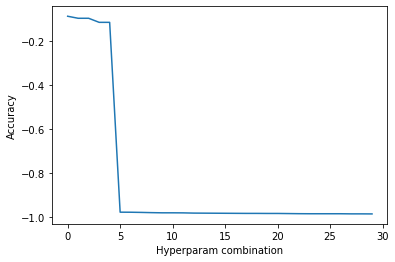

In [22]:
results['loss'].plot()
plt.ylabel('Accuracy')
plt.xlabel('Hyperparam combination')

# Evaluate the model

In [23]:
# load best model

model = load_model(path_best_model)

In [24]:
# make predictions in test set

result = model.evaluate(x=X_test,
                        y=y_test)

132/132 [==============================] - 3s 21ms/step - loss: 0.0507 - accuracy: 0.9850


In [25]:
# print evaluation metrics

for name, value in zip(model.metrics_names, result):
    print(name, value)

loss 0.05074620246887207
accuracy 0.9850000143051147


## Confusion matrix

In [26]:
# Predict the values from the validation dataset
y_pred = model.predict(X_test)

# Convert predictions classes to one hot vectors 
y_pred_classes = np.argmax(y_pred, axis = 1)

# Convert validation observations to one hot vectors
y_true = np.argmax(y_test, axis = 1)

# compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes) 

cm

array([[419,   0,   0,   0,   0,   0,   1,   0,   2,   0],
       [  0, 469,   1,   0,   0,   0,   1,   0,   2,   0],
       [  1,   0, 400,   5,   0,   0,   1,   0,   2,   0],
       [  0,   0,   0, 422,   0,   1,   0,   1,   2,   0],
       [  1,   1,   0,   0, 414,   0,   3,   1,   1,   8],
       [  0,   0,   0,   1,   0, 373,   4,   0,   3,   1],
       [  0,   0,   0,   0,   2,   0, 409,   0,   1,   0],
       [  0,   1,   3,   0,   0,   1,   0, 462,   0,   2],
       [  0,   0,   0,   0,   0,   0,   4,   0, 380,   0],
       [  1,   0,   0,   0,   1,   0,   0,   0,   3, 389]], dtype=int64)

Text(0.5, 13.421126458070283, 'Predicted label')

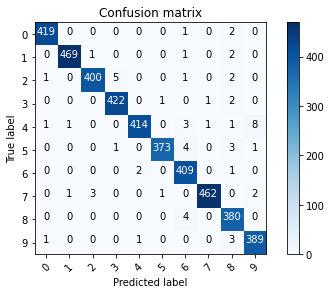

In [27]:
# let's make it more colourful
classes = 10

plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion matrix')
plt.colorbar()
tick_marks = np.arange(classes)
plt.xticks(tick_marks, range(classes), rotation=45)
plt.yticks(tick_marks, range(classes))

for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment="center",
             color="white" if cm[i, j] > 100 else "black",
            )

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

Here we can see that our CNN performs very well on all digits.